# Prediction of SARS-COVID19 severity based on graph-based features of T-cell receptors’ CDR3 amino acid sequences
by Aizhan Uteubayeva (NetID:au198)

# Step 0: Initial Setup

In [1]:
# Installing the necessary packages
%pip install IPython
%pip install matplotlib
%pip install pandas
%pip install seaborn
%pip install scipy

!pip install scvi-tools
!pip install LZGraphs

# Importing necessary libraries
import pandas as pd
pd.options.mode.chained_assignment = None

from IPython import get_ipython
from scipy import stats
from LZGraphs import LZCentrality, NDPLZGraph
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from LZGraphs import NaiveLZGraph, generate_dictionary
from LZGraphs import K1000_Diversity
from LZGraphs import AAPLZGraph
from sklearn.preprocessing import LabelEncoder

import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import numpy as np

# Step 1. Exploring the LZGraph

## LZGraphs: ex-vivo 0-hours

In [5]:
file_path = '/content/drive/MyDrive/7006_Final_Project_Aizhan/Severe_patients_0-h.xlsx'
data_0h = pd.read_excel(file_path)
data_0h.head()

,Clonotype ID,CDR3 Aminoacid Sequences,CDR3 Nucleotide Sequences,Virus reactivity (*),Clone size,P01,P03,P04,P05,P06,...,P16,P17,P18,P20,P24,P43,P46,P49,P25,P26
0,clonotype1,TRA:CATEGSVDSSYKLIF;TRB:CAISNPTGTEDEKLFF,TRA:TGTGCTACCGAGGGTTCGGTGGATAGCAGCTATAAATTGATC...,NaN,155,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,clonotype2,TRA:CAVRLGADGLTF;TRB:CASSLENYGYTF,TRA:TGTGCTGTGAGGCTAGGTGCTGACGGACTCACCTTT;TRB:T...,NaN,108,0,0,0,108,0,...,0,0,0,0,0,0,0,0,0,0
2,clonotype3,TRA:CAMDQAGTALIF;TRB:CASSSKGQLYGYTF,TRA:TGTGCAATGGACCAGGCAGGAACTGCTCTGATCTTT;TRB:T...,NaN,128,0,0,0,128,0,...,0,0,0,0,0,0,0,0,0,0
3,clonotype4,TRA:CAVQAEFSDGQKLLF;TRB:CATSRERDFYEQYF,TRA:TGTGCTGTGCAGGCCGAGTTTTCAGATGGCCAGAAGCTGCTC...,NaN,103,0,0,0,0,103,...,0,0,0,0,0,0,0,0,0,0
4,clonotype5,TRA:CALTRGGSRLTF;TRB:CSVAEGGVYGYTF,TRA:TGTGCTCTAACACGGGGTGGCTCTAGGTTGACCTTT;TRB:T...,NaN,109,0,0,0,109,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
def split_cdr3_sequences(data, column_name):
    # Two new columns
    data[f'{column_name}_Alpha'] = None
    data[f'{column_name}_Beta'] = None

    # Processing each row and split the sequences
    for index, row in data.iterrows():
        parts = row[column_name].split(';')
        if len(parts) > 0:
            data.at[index, f'{column_name}_Alpha'] = parts[0].strip() if len(parts[0]) > 0 else None
        if len(parts) > 1:
            data.at[index, f'{column_name}_Beta'] = parts[1].strip() if len(parts[1]) > 0 else None

# Applying the function to both amino acid and nucleotide sequences
split_cdr3_sequences(data_0h, 'CDR3 Aminoacid Sequences')
split_cdr3_sequences(data_0h, 'CDR3 Nucleotide Sequences')

# Removing the 'Virus reactivity (*)' column and original sequence columns
data_0h.drop(['Virus reactivity (*)', 'CDR3 Aminoacid Sequences', 'CDR3 Nucleotide Sequences'], axis=1, inplace=True)

# Displaying the first few rows to verify changes
print(data_0h.head())

  Clonotype ID  Clone size  P01  P03  P04  P05  P06  P07  P08  P09  ... P24  \
0   clonotype1         155    0    0    0    0    0    0    0    0  ...   0   
1   clonotype2         108    0    0    0  108    0    0    0    0  ...   0   
2   clonotype3         128    0    0    0  128    0    0    0    0  ...   0   
3   clonotype4         103    0    0    0    0  103    0    0    0  ...   0   
4   clonotype5         109    0    0    0  109    0    0    0    0  ...   0   

   P43  P46  P49  P25  P26  CDR3 Aminoacid Sequences_Alpha  \
0    0    0    0    0    0             TRA:CATEGSVDSSYKLIF   
1    0    0    0    0    0                TRA:CAVRLGADGLTF   
2    0    0    0    0    0                TRA:CAMDQAGTALIF   
3    0    0    0    0    0             TRA:CAVQAEFSDGQKLLF   
4    0    0    0    0    0                TRA:CALTRGGSRLTF   

   CDR3 Aminoacid Sequences_Beta  \
0           TRB:CAISNPTGTEDEKLFF   
1               TRB:CASSLENYGYTF   
2             TRB:CASSSKGQLYGYTF   
3       

In [7]:
# Cleaning up the sequences by removing "TRA:" and "TRB:" prefixes
data_0h['CDR3 Aminoacid Sequences_Alpha'] = data_0h['CDR3 Aminoacid Sequences_Alpha'].str.replace('TRA:', '', regex=False)
data_0h['CDR3 Aminoacid Sequences_Beta'] = data_0h['CDR3 Aminoacid Sequences_Beta'].str.replace('TRB:', '', regex=False)
data_0h['CDR3 Nucleotide Sequences_Alpha'] = data_0h['CDR3 Nucleotide Sequences_Alpha'].str.replace('TRA:', '', regex=False)
data_0h['CDR3 Nucleotide Sequences_Beta'] = data_0h['CDR3 Nucleotide Sequences_Beta'].str.replace('TRB:', '', regex=False)

# Displaying the first few rows to verify changes
print(data_0h[['CDR3 Aminoacid Sequences_Alpha', 'CDR3 Aminoacid Sequences_Beta', 'CDR3 Nucleotide Sequences_Alpha', 'CDR3 Nucleotide Sequences_Beta']].head())


  CDR3 Aminoacid Sequences_Alpha CDR3 Aminoacid Sequences_Beta  \
0                CATEGSVDSSYKLIF              CAISNPTGTEDEKLFF   
1                   CAVRLGADGLTF                  CASSLENYGYTF   
2                   CAMDQAGTALIF                CASSSKGQLYGYTF   
3                CAVQAEFSDGQKLLF                CATSRERDFYEQYF   
4                   CALTRGGSRLTF                 CSVAEGGVYGYTF   

                 CDR3 Nucleotide Sequences_Alpha  \
0  TGTGCTACCGAGGGTTCGGTGGATAGCAGCTATAAATTGATCTTC   
1           TGTGCTGTGAGGCTAGGTGCTGACGGACTCACCTTT   
2           TGTGCAATGGACCAGGCAGGAACTGCTCTGATCTTT   
3  TGTGCTGTGCAGGCCGAGTTTTCAGATGGCCAGAAGCTGCTCTTT   
4           TGTGCTCTAACACGGGGTGGCTCTAGGTTGACCTTT   

                     CDR3 Nucleotide Sequences_Beta  
0  TGTGCCATCAGTAATCCAACAGGGACTGAGGATGAAAAACTGTTTTTT  
1              TGTGCCAGCAGCTTAGAGAACTATGGCTACACCTTC  
2        TGTGCCAGCAGTTCAAAAGGACAGCTCTATGGCTACACCTTC  
3        TGTGCCACCAGCAGAGAACGGGACTTCTACGAGCAGTACTTC  
4           TGCAGCGT

### Clusters with KMeans


In [8]:
scaler = StandardScaler()
data_0h['Normalized Clone Size'] = scaler.fit_transform(data_0h[['Clone size']])

# Using K-means
kmeans = KMeans(n_clusters=8, random_state=0)  #8 clusters as stated in the paper
data_0h['Cluster'] = kmeans.fit_predict(data_0h[['Normalized Clone Size']])

# Checking the distribution of data points in each cluster
print(data_0h['Cluster'].value_counts())

0    8545
7     464
4      61
3      18
6       6
1       1
2       1
5       1
Name: Cluster, dtype: int64


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


**Cluster Distribution**

The Cluster output shows how many clonotypes fall into each cluster:
The output shows the distribution of data points across the clusters, with most points belonging to cluster 0 (8545 points), followed by cluster 7 (464 points), cluster 4 (61 points), cluster 3 (18 points), cluster 6 (6 points), and very few points in clusters 1, 2, and 5 (1 point each). This distribution suggests that the majority of data points tend to group closely around the centroid of cluster 0, while clusters 1-7 capture fewer data points, indicating potential outliers or less common patterns in the data

### Nodes, Edges, Centrality and the Graph

In these steps, I am initializing a new undirected graph (nx.Graph()) and populating it with nodes and edges:

- **Nodes** represent entities in the data, clonotypes or unique sequences from your TCRB sequence data.
- **Edges** represent connections or relationships between these nodes, indicating some form of sequence similarity or functional relationship.

- **Eigenvector centrality** measures the influence of a node in a network. It assigns relative scores to all nodes in the network based on the principle that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes

Conclusion:
The network analysis here helps in understanding the structural and relational dynamics of TCRB sequences at a given time point (0h in this case). The high number of connected components and the centrality measures provide insights into how these sequences are related or isolated, which can be crucial for identifying key sequences or understanding the immune response's complexity and diversity in severe COVID-19 cases. Further comparative analysis with the 24h data can reveal changes or stability in these network structures over time, potentially indicating how the immune response evolves or reacts to the infection

In [9]:
# Selecting only Beta sequences here
data_0h = data_0h.rename(columns={
    'CDR3 Nucleotide Sequences_Beta': 'cdr3_amino_acid'
})

In [10]:
# Using the correct column for nucleotide sequences
sequences_beta_0 = data_0h['cdr3_amino_acid'].tolist()

# Filtering out None values from sequences_beta if they exist
sequences_beta_0 = [seq for seq in sequences_beta_0 if seq is not None]

# Verifying that sequences_beta is not empty
if not sequences_beta_0:
    raise ValueError("No valid sequences available to process.")

# Ensuring the dictionary is generated correctly
dictionary = generate_dictionary(6)
if not dictionary:
    raise ValueError("Failed to generate a valid dictionary.")

from LZGraphs.Graphs.Naive import NaiveLZGraph, generate_dictionary

try:
    lzgraph_0 = NaiveLZGraph(sequences_beta_0, dictionary, verbose=True)
except Exception as e:
    print(f"Failed to construct graph: {e}")

# Retrieving the list of all graph nodes / edges
node_list_0 = list(lzgraph_0.nodes)
edge_list_0 = list(lzgraph_0.edges)

print('First 10 Nodes: ',list(lzgraph_0.nodes)[:10])
print('First 10 Edges: ',list(lzgraph_0.edges)[:10])
summary = lzgraph_0.graph_summary()
print(summary)


Graph Constructed.. |  0.43  Seconds
Graph Metadata Derived.. |  0.43  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.46  Seconds
Graph Edge Weight Normalized.. |  0.47  Seconds
Terminal State Map Derived.. |  0.48  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.54  Seconds
LZGraph Created Successfully.. |  0.54  Seconds


First 10 Nodes:  ['A', 'T', 'G', 'C', 'AA', 'AT', 'AG', 'AC', 'TA', 'TT']
First 10 Edges:  [('A', 'GT'), ('A', 'GCT'), ('A', 'GC'), ('A', ':'), ('A', 'GA'), ('A', 'GCA'), ('A', 'GG'), ('A', 'TA'), ('A', 'GCG'), ('A', 'CC')]
Chromatic Number        28
Number of Isolates    5168
Max In Deg             126
Max Out Deg            125
Number of Edges       6221
dtype: int64


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


In [11]:
# Calculating the K1000 Diversity index
k1000 = K1000_Diversity(sequences_beta_0, AAPLZGraph.encode_sequence, draws=30)
print(f"The K1000 Diversity index is {k1000}")

The K1000 Diversity index is 2143.0666666666666


In [12]:
# Generating the Eigenvector Centrality with LZGrapg
centrality_0 = lzgraph_0.eigenvector_centrality()
print("Eigenvector Centrality:", centrality_0)

Eigenvector Centrality: {'A': 0.28280087878907473, 'T': 0.10672628157026237, 'G': 0.11455124703297487, 'C': 0.2512838117709182, 'AA': 0.12270945858064951, 'AT': 0.11746327816832935, 'AG': 0.21472684205328296, 'AC': 0.21449045811540665, 'TA': 0.18357796783822447, 'TT': 0.3250117071262562, 'TG': 0.12734421770160897, 'TC': 0.22349764626639212, 'GA': 0.21781408784729148, 'GT': 0.20189794248964346, 'GG': 0.2852444414309828, 'GC': 0.2559119561031467, 'CA': 0.24890332662404782, 'CT': 0.21544633650343253, 'CG': 0.16040444701137604, 'CC': 0.17996441485868958, 'AAA': 0.010513877190714628, 'AAT': 0.0064313795852652955, 'AAG': 0.0044725206637259, 'AAC': 0.01054707114986841, 'ATA': 0.008500751323667947, 'ATT': 0.013213456978542168, 'ATG': 0.005060768297524305, 'ATC': 0.003224420277302704, 'AGA': 0.022380596162359632, 'AGT': 0.03234400111087043, 'AGG': 0.016875367741713613, 'AGC': 0.04116761714842708, 'ACA': 0.023432095735449562, 'ACT': 0.03868687336546609, 'ACG': 0.01752095657022342, 'ACC': 0.02578

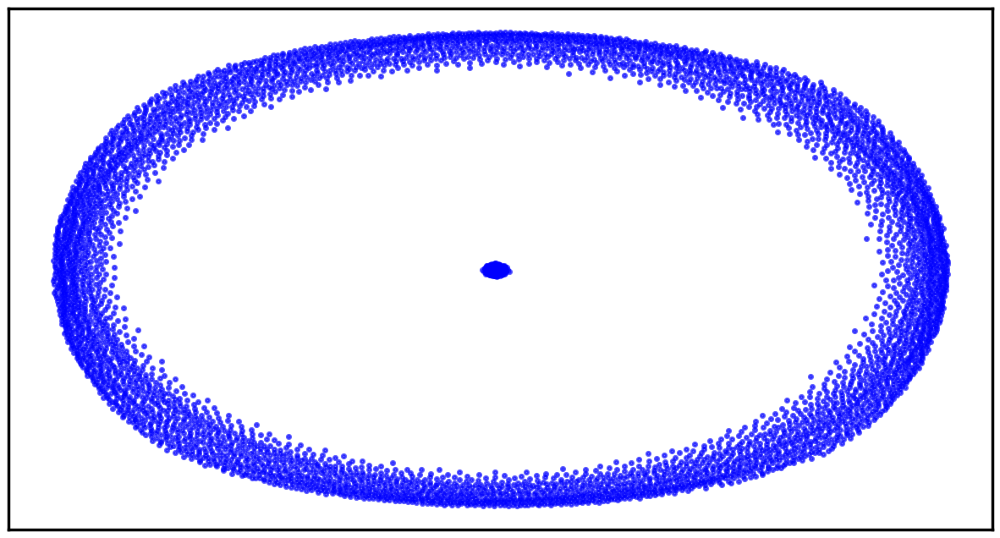

In [13]:
# Converting the custom graph to a networkx graph
nx_graph_0 = nx.Graph()
nx_graph_0.add_nodes_from(list(lzgraph_0.nodes))
nx_graph_0.add_edges_from(list(lzgraph_0.edges))

# Visualization
pos = nx.spring_layout(nx_graph_0)  # Use spring layout for positioning
nx.draw_networkx_nodes(nx_graph_0, pos, node_size=10, node_color='blue', alpha=0.6)
nx.draw_networkx_edges(nx_graph_0, pos, alpha=0.4)

plt.show()

A bunch of noise around the edges -- we actually need the center -- which is actually the connection in the 0 hours patients

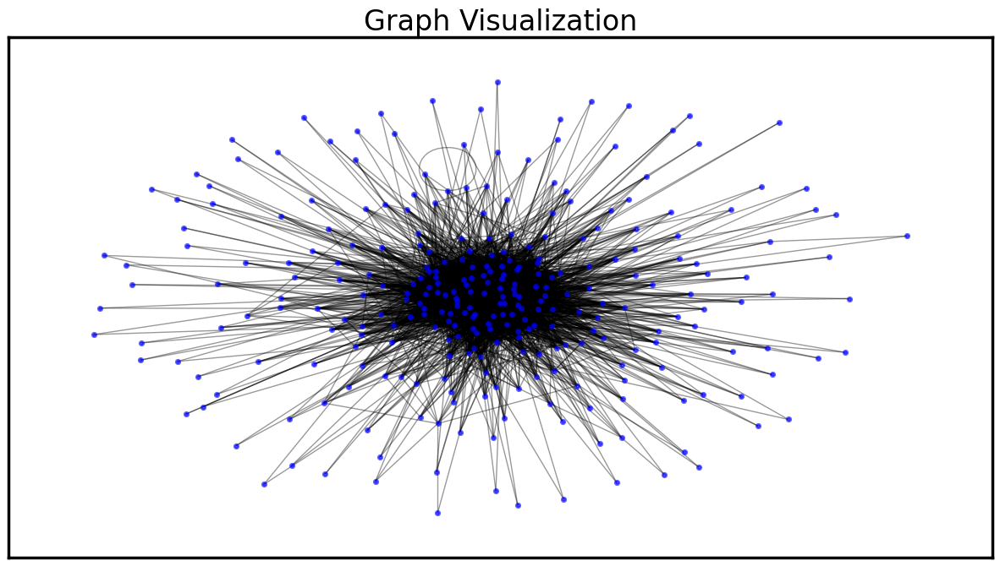

In [14]:
# Converting the custom graph to a networkx graph
nx_graph_0 = nx.Graph()
nx_graph_0.add_nodes_from(list(lzgraph_0.nodes))
nx_graph_0.add_edges_from(list(lzgraph_0.edges))

# Removing isolated nodes (nodes with no edges)
isolated_nodes = [node for node, degree in nx_graph_0.degree() if degree == 0]
nx_graph_0.remove_nodes_from(isolated_nodes)

# Visualization
pos = nx.spring_layout(nx_graph_0)  # Use spring layout for positioning
nx.draw_networkx_nodes(nx_graph_0, pos, node_size=10, node_color='blue', alpha=0.6)
nx.draw_networkx_edges(nx_graph_0, pos, alpha=0.4)

plt.title('Graph Visualization')
plt.show()

In [15]:
# Getting some additional information about the graphs: the initial states and len_states
init_states = lzgraph_0.initial_states
print(init_states)

len_states = lzgraph_0.length_distribution_proba
print(len_states)

T    7802
dtype: int64
TT      0.159446
C       0.255704
TC      0.241348
T       0.175083
TTT     0.102153
TTC     0.058575
G       0.000385
CTTC    0.001923
CTTT    0.001154
TGG     0.000897
GTC     0.000641
TTTT    0.001154
GG      0.001154
TGC     0.000256
ATTT    0.000128
dtype: float64


## LZGraphs: same steps but for the in-vitro 24-hour

In [16]:
# Loading the file for severe patients at 0 h
file_path = '/content/drive/MyDrive/7006_Final_Project_Aizhan/All_patients_24-h.xlsx'

data_24h = pd.read_excel(file_path)

data_24h.head()

,Clonotype ID,CDR3 Aminoacid Sequences,CDR3 Nucleotide Sequences,Virus reactivity (*),Clone Size,P01,P03,P04,P05,P06,...,P64,P66,SDBB020,SDBB063,SDBB051,SDBB073,SDBB077,SDBB079,SDBB082,SDBB088
0,clonotype1,TRA:CAVATGNQFYF;TRB:CASSPYSGAIYNEQFF,TRA:TGTGCTGTCGCCACCGGTAACCAGTTCTATTTT;TRB:TGTG...,SARS-CoV-2,1469,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,clonotype2,TRA:CAGFSNSGYALNF;TRA:CAGGLYGGATNKLIF;TRB:CASS...,TRA:TGTGCCGGCGGGCTTTATGGTGGTGCTACAAACAAGCTCATC...,SARS-CoV-2,817,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,clonotype3,TRA:CVVSDDYGGSQGNLIF;TRB:CASSLAPRDISEAFF,TRA:TGTGTTGTGAGTGATGATTATGGAGGAAGCCAAGGAAATCTC...,SARS-CoV-2,594,0,0,0,0,594,...,0,0,0,0,0,0,0,0,0,0
3,clonotype4,TRA:CATEGSVDSSYKLIF;TRB:CAISNPTGTEDEKLFF,TRA:TGTGCTACCGAGGGTTCGGTGGATAGCAGCTATAAATTGATC...,SARS-CoV-2,635,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,clonotype5,TRA:CAGGLYGGATNKLIF;TRB:CASSQDLGQEGGLFSGNTIYF,TRA:TGTGCCGGCGGGCTTTATGGTGGTGCTACAAACAAGCTCATC...,SARS-CoV-2,496,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [17]:
def split_cdr3_sequences(data, column_name):
    # Initialize two new columns
    data[f'{column_name}_Alpha'] = None
    data[f'{column_name}_Beta'] = None

    # Process each row and split the sequences
    for index, row in data.iterrows():
        parts = row[column_name].split(';')
        if len(parts) > 0:
            data.at[index, f'{column_name}_Alpha'] = parts[0].strip() if len(parts[0]) > 0 else None
        if len(parts) > 1:
            data.at[index, f'{column_name}_Beta'] = parts[1].strip() if len(parts[1]) > 0 else None

# Apply the function to both amino acid and nucleotide sequences
split_cdr3_sequences(data_24h, 'CDR3 Aminoacid Sequences')
split_cdr3_sequences(data_24h, 'CDR3 Nucleotide Sequences')

# Remove the 'Virus reactivity (*)' column and original sequence columns
data_24h.drop(['Virus reactivity (*)', 'CDR3 Aminoacid Sequences', 'CDR3 Nucleotide Sequences'], axis=1, inplace=True)

# Display the first few rows to verify changes
print(data_24h.head())

  Clonotype ID  Clone Size  P01  P03  P04  P05  P06   P07  P08  P09  ...  \
0   clonotype1        1469    0    0    0    0    0  1467    0    0  ...   
1   clonotype2         817    0    0    0    0    0     0    0    0  ...   
2   clonotype3         594    0    0    0    0  594     0    0    0  ...   
3   clonotype4         635    0    0    0    0    0     0    0    0  ...   
4   clonotype5         496    0    0    0    0    0     0    0    0  ...   

   SDBB051  SDBB073  SDBB077  SDBB079  SDBB082  SDBB088  \
0        0        0        0        0        0        0   
1        0        0        0        0        0        0   
2        0        0        0        0        0        0   
3        0        0        0        0        0        0   
4        0        0        0        0        0        0   

   CDR3 Aminoacid Sequences_Alpha  CDR3 Aminoacid Sequences_Beta  \
0                 TRA:CAVATGNQFYF           TRB:CASSPYSGAIYNEQFF   
1               TRA:CAGFSNSGYALNF            TRA:CAG

In [18]:
# Clean up the sequences by removing "TRA:" and "TRB:" prefixes
data_24h['CDR3 Aminoacid Sequences_Alpha'] = data_24h['CDR3 Aminoacid Sequences_Alpha'].str.replace('TRA:', '', regex=False)
data_24h['CDR3 Aminoacid Sequences_Beta'] = data_24h['CDR3 Aminoacid Sequences_Beta'].str.replace('TRB:', '', regex=False)
data_24h['CDR3 Nucleotide Sequences_Alpha'] = data_24h['CDR3 Nucleotide Sequences_Alpha'].str.replace('TRA:', '', regex=False)
data_24h['CDR3 Nucleotide Sequences_Beta'] = data_24h['CDR3 Nucleotide Sequences_Beta'].str.replace('TRB:', '', regex=False)

# Display the first few rows to verify changes
print(data_24h[['CDR3 Aminoacid Sequences_Alpha', 'CDR3 Aminoacid Sequences_Beta', 'CDR3 Nucleotide Sequences_Alpha', 'CDR3 Nucleotide Sequences_Beta']].head())

  CDR3 Aminoacid Sequences_Alpha CDR3 Aminoacid Sequences_Beta  \
0                    CAVATGNQFYF              CASSPYSGAIYNEQFF   
1                  CAGFSNSGYALNF           TRA:CAGGLYGGATNKLIF   
2               CVVSDDYGGSQGNLIF               CASSLAPRDISEAFF   
3                CATEGSVDSSYKLIF              CAISNPTGTEDEKLFF   
4                CAGGLYGGATNKLIF         CASSQDLGQEGGLFSGNTIYF   

                    CDR3 Nucleotide Sequences_Alpha  \
0                 TGTGCTGTCGCCACCGGTAACCAGTTCTATTTT   
1     TGTGCCGGCGGGCTTTATGGTGGTGCTACAAACAAGCTCATCTTT   
2  TGTGTTGTGAGTGATGATTATGGAGGAAGCCAAGGAAATCTCATCTTT   
3     TGTGCTACCGAGGGTTCGGTGGATAGCAGCTATAAATTGATCTTC   
4     TGTGCCGGCGGGCTTTATGGTGGTGCTACAAACAAGCTCATCTTT   

                      CDR3 Nucleotide Sequences_Beta  
0   TGTGCCAGCAGTCCATATAGCGGGGCAATATACAATGAGCAGTTCTTC  
1        TRA:TGTGCTGGGTTCTCAAATTCCGGGTATGCACTCAACTTC  
2      TGTGCCAGCAGCTTAGCGCCTCGGGATATTAGTGAAGCTTTCTTT  
3   TGTGCCATCAGTAATCCAACAGGGACTGAGGATGAAAAACTGTTTTTT

In [19]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import pandas as pd

# Assuming 'Clone size' is the column you want to normalize
scaler = StandardScaler()
data_24h['Normalized Clone Size'] = scaler.fit_transform(data_24h[['Clone Size']])

# Now apply clustering - let's use K-means as an example
kmeans = KMeans(n_clusters=8, random_state=0)  # You can choose the number of clusters based on your specific needs
data_24h['Cluster'] = kmeans.fit_predict(data_24h[['Normalized Clone Size']])

# Check the distribution of data points in each cluster
print(data_24h['Cluster'].value_counts())

# Optional: Analyze cluster centers
print(kmeans.cluster_centers_)

0    11573
4      138
6       27
2       15
7        7
1        6
3        1
5        1
Name: Cluster, dtype: int64
[[-0.06993467]
 [22.60529416]
 [ 8.98386875]
 [57.29844589]
 [ 1.57217355]
 [40.81621592]
 [ 4.69158283]
 [13.88810514]]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [20]:
from LZGraphs.Graphs.Naive import NaiveLZGraph, generate_dictionary
import pandas as pd

In [21]:
data_24h = data_24h.rename(columns={
    'CDR3 Nucleotide Sequences_Beta': 'cdr3_amino_acid'  # If you need to use beta chains separately
})

In [22]:
# Use the correct column for nucleotide sequences
sequences_beta = data_24h['cdr3_amino_acid'].tolist()

# Filter out None values from sequences_beta if they exist
sequences_beta = [seq for seq in sequences_beta if seq is not None]

# Verify that sequences_beta is not empty
if not sequences_beta:
    raise ValueError("No valid sequences available to process.")

# Ensure the dictionary is generated correctly
dictionary = generate_dictionary(6)
if not dictionary:
    raise ValueError("Failed to generate a valid dictionary.")

from LZGraphs.Graphs.Naive import NaiveLZGraph, generate_dictionary

try:
    lzgraph_24 = NaiveLZGraph(sequences_beta, dictionary, verbose=True)
except Exception as e:
    print(f"Failed to construct graph: {e}")

Graph Constructed.. |  0.59  Seconds
Graph Metadata Derived.. |  0.59  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.62  Seconds
Graph Edge Weight Normalized.. |  0.63  Seconds
Terminal State Map Derived.. |  0.64  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.72  Seconds
LZGraph Created Successfully.. |  0.72  Seconds




/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


In [23]:
print(dir(lzgraph_24))

['_NaiveLZGraph__derive_terminal_state_map', '_NaiveLZGraph__get_state_weights', '_NaiveLZGraph__random_initial_state', '_NaiveLZGraph__random_step', '_NaiveLZGraph__simultaneous_graph_construction', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_derive_subpattern_individual_probability', '_insert_edge_and_information', '_normalize_edge_weights', '_update_initial_states', '_update_terminal_states', 'constructor_end_time', 'constructor_start_time', 'derive_final_state_data', 'dictionary', 'drop_isolates', 'edges', 'eigenvector_centrality', 'encode_sequence', 'graph', 'graph_summary', 'initial_states', 'is_stop_condition', 'isolates', 'length_distribution_proba', 'nodes', 'per_node_observed_fre

In [24]:
# Retrieving the list of all graph nodes / edges
node_list = list(lzgraph_24.nodes)
edge_list = list(lzgraph_24.edges)

print('First 10 Nodes: ',list(lzgraph_24.nodes)[:10])
print('First 10 Edges: ',list(lzgraph_24.edges)[:10])

First 10 Nodes:  ['A', 'T', 'G', 'C', 'AA', 'AT', 'AG', 'AC', 'TA', 'TT']
First 10 Edges:  [('A', 'GT'), ('A', ':'), ('A', 'GCT'), ('A', 'GG'), ('A', 'GC'), ('A', 'GTT'), ('A', 'GTC'), ('A', 'TA'), ('A', 'GCAG'), ('A', 'GCG')]


In [25]:
# Assuming the method returns or prints a summary
summary = lzgraph_24.graph_summary()
print(summary)

Chromatic Number        28
Number of Isolates    5138
Max In Deg             138
Max Out Deg            137
Number of Edges       7147
dtype: int64


In [26]:
centrality = lzgraph_24.eigenvector_centrality()
print("Eigenvector Centrality:", centrality)

Eigenvector Centrality: {'A': 0.2805826209144501, 'T': 0.10419978121338935, 'G': 0.11653669478104638, 'C': 0.26037422138691285, 'AA': 0.12313884277503752, 'AT': 0.11895743543177695, 'AG': 0.2196357137198978, 'AC': 0.21106503928266987, 'TA': 0.1841447182731905, 'TT': 0.3192985785185119, 'TG': 0.13390243076413227, 'TC': 0.2266008261228941, 'GA': 0.21644527574044167, 'GT': 0.1987670696681385, 'GG': 0.2795606487000571, 'GC': 0.2583598440653616, 'CA': 0.25283937594538525, 'CT': 0.22011852777947757, 'CG': 0.15897047454721766, 'CC': 0.17437130036281442, 'AAA': 0.009354571191488368, 'AAT': 0.007160847329632728, 'AAG': 0.004099116477746117, 'AAC': 0.010188385226461143, 'ATA': 0.008270168103237696, 'ATT': 0.01388059323561358, 'ATG': 0.0064363828659905345, 'ATC': 0.002946497702914912, 'AGA': 0.021306188174997423, 'AGT': 0.033917406749440285, 'AGG': 0.02015269754190947, 'AGC': 0.043905022601945044, 'ACA': 0.02496619233566112, 'ACT': 0.03812005405513204, 'ACG': 0.018770866621212173, 'ACC': 0.024244

In [27]:
import networkx as nx

# Create a new NetworkX graph
nx_graph_24 = nx.Graph()

# Add nodes and edges
nx_graph_24.add_nodes_from(node_list)
nx_graph_24.add_edges_from(edge_list)

# Now you can apply various NetworkX functions
# Calculate centrality
centrality = nx.eigenvector_centrality(nx_graph_24)
print("Eigenvector Centrality:", centrality)

# Calculate the number of connected components
print("Number of connected components:", nx.number_connected_components(nx_graph_24))

# Basic info
print("Number of nodes:", nx_graph_24.number_of_nodes())
print("Number of edges:", nx_graph_24.number_of_edges())

Eigenvector Centrality: {'A': 0.10515505357459443, 'T': 0.006676950167507009, 'G': 0.06900061568989864, 'C': 0.09041029915516405, 'AA': 0.1362821920272612, 'AT': 0.13277219304348553, 'AG': 0.13690620454549202, 'AC': 0.1358829889534204, 'TA': 0.13405041309117874, 'TT': 0.1325517780614775, 'TG': 0.10924303734777026, 'TC': 0.13813118821915582, 'GA': 0.13714856833632239, 'GT': 0.12756348537109988, 'GG': 0.13351393564794023, 'GC': 0.11907810941832277, 'CA': 0.11748635750851855, 'CT': 0.1355380004964231, 'CG': 0.13115074758146444, 'CC': 0.13318316795046325, 'AAA': 0.07629676550557998, 'AAT': 0.07572879498414509, 'AAG': 0.07161516879740092, 'AAC': 0.09488074421116506, 'ATA': 0.07309623988490595, 'ATT': 0.06552566765889388, 'ATG': 0.07583415971504658, 'ATC': 0.06241648162257149, 'AGA': 0.10077336374801416, 'AGT': 0.09174304467595507, 'AGG': 0.1034570163697627, 'AGC': 0.11015260222606797, 'ACA': 0.1048665206842345, 'ACT': 0.09972994111969657, 'ACG': 0.08675266339121679, 'ACC': 0.092189209978936

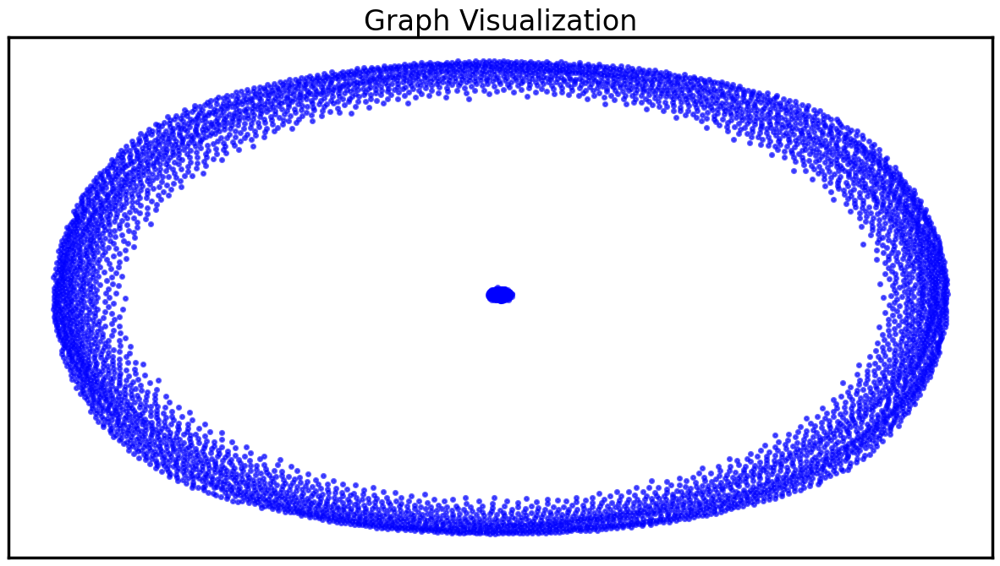

In [28]:
import matplotlib.pyplot as plt

# Position nodes using one of the layout algorithms
pos = nx.spring_layout(nx_graph_24)

# Draw nodes and edges
nx.draw_networkx_nodes(nx_graph_24, pos, node_size=10, node_color='blue', alpha=0.6)
nx.draw_networkx_edges(nx_graph_24, pos, alpha=0.4)

plt.title('Graph Visualization')
plt.show()

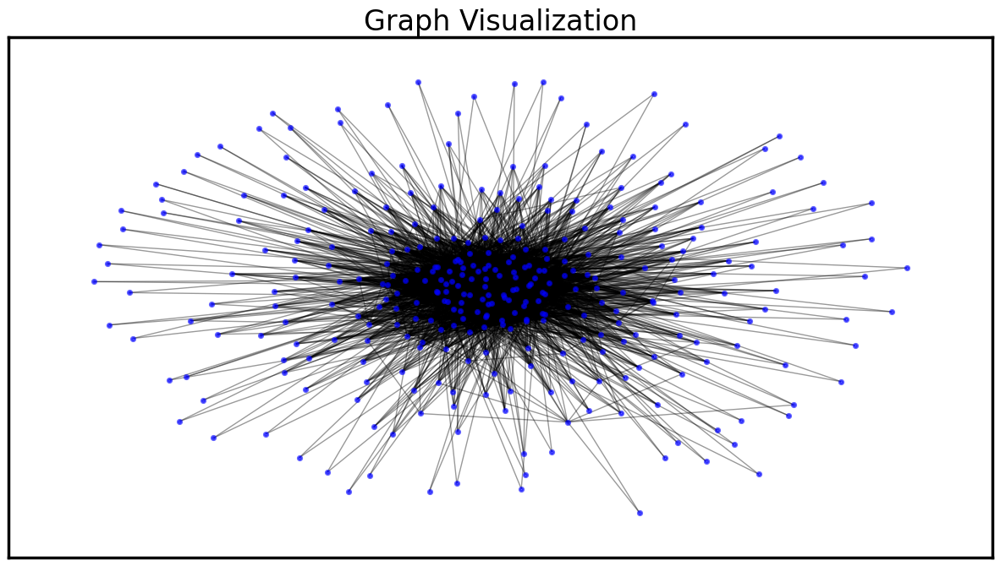

In [29]:
import matplotlib.pyplot as plt
import networkx as nx

# Assuming nx_graph_24 is already defined and contains nodes and edges
# Remove isolated nodes (nodes with no edges)
isolated_nodes = [node for node, degree in nx_graph_24.degree() if degree == 0]
nx_graph_24.remove_nodes_from(isolated_nodes)

# Position nodes using one of the layout algorithms
pos = nx.spring_layout(nx_graph_24)  # Use spring layout for positioning

# Draw nodes and edges
nx.draw_networkx_nodes(nx_graph_24, pos, node_size=10, node_color='blue', alpha=0.6)
nx.draw_networkx_edges(nx_graph_24, pos, alpha=0.4)

plt.title('Graph Visualization')
plt.show()


# Step 2: Final Dataset

Simmilarly to the initial dataset, as we have been looking into the CD8+ cell we will look into CD8+ cell in the new dataset.

The data contains the CD8+ sequences and the severity of patients' response to COVID-19.

Total number of patients: 270

In [129]:
file_path = '/content/drive/MyDrive/7006_Final_Project_Aizhan/su_TCR_cd8_AllPatients.csv'

new_data = pd.read_csv(file_path)

new_data.head()

,dataset,patient_ID,patient_subID,cell_type,barcode,TRA_cdr3,TRA_cdr3_nt,TRA_V_gene,TRA_D_gene,TRA_J_gene,...,TRB_cdr3_nt,TRB_V_gene,TRB_D_gene,TRB_J_gene,TRB_C_gene,clonotype,d_cond,sex,age,race
0,Su,100_1,T1,CD8+,AAGACCTTCGTTACAG-1-9:I1:100-1,None,None,None,NaN,None,...,TGCAGTGCCGATCTGGACAGGGCAGGTAACGAGCAGTACTTC,TRBV20-1,NaN,TRBJ2-7,TRBC2,32396,mild,Female,32.0,Asian
1,Su,100_1,T1,CD8+,AGACGTTCACGTGAGA-1-9:I1:100-1,CALMDSNYQLIW,TGTGCGTTAATGGATAGCAACTATCAGTTAATCTGG,TRAV1-2,NaN,TRAJ33,...,TGTGCCAGCGCCCCCGGGACGCAGGTGGCAGTGGGGCAGTTCTTC,TRBV6-2,NaN,TRBJ2-1,TRBC2,32397,mild,Female,32.0,Asian
2,Su,100_1,T1,CD8+,AGTCTTTGTCTTCTCG-1-9:I1:100-1,CAVKDSNYQLIW,TGTGCTGTGAAGGATAGCAACTATCAGTTAATCTGG,TRAV1-2,NaN,TRAJ33,...,TGTGCCAGCAGTGCGGGACTAGAATACAATGAGCAGTTCTTC,TRBV28,NaN,TRBJ2-1,TRBC2,32398,mild,Female,32.0,Asian
3,Su,100_1,T1,CD8+,ATCTACTTCGCTGATA-1-9:I1:100-1,CAGSISNFGNEKLTF,TGTGCTGGCTCCATATCTAACTTTGGAAATGAGAAATTAACCTTT,TRAV41,NaN,TRAJ48,...,TGTGCCAGCAGACCTGAGGATAGCGGTAGCTCCTACAATGAGCAGT...,TRBV28,NaN,TRBJ2-1,TRBC2,32399,mild,Female,32.0,Asian
4,Su,100_1,T1,CD8+,ATGGGAGTCCGGGTGT-1-9:I1:100-1,None,None,None,NaN,None,...,TGTGCCAGCGCGAACCTCGGGACAGGGGGCACAGATACGCAGTATTTT,TRBV10-3,NaN,TRBJ2-3,TRBC2,28105,mild,Female,32.0,Asian


In [130]:
print("Data shape:", new_data.shape)
print("Missing values:", new_data.isnull().sum())

Data shape: (72951, 22)
Missing values: dataset              0
patient_ID           0
patient_subID     6297
cell_type            0
barcode              0
TRA_cdr3             0
TRA_cdr3_nt          0
TRA_V_gene           0
TRA_D_gene       72951
TRA_J_gene           0
TRA_C_gene           0
TRB_cdr3             0
TRB_cdr3_nt          0
TRB_V_gene           0
TRB_D_gene       72951
TRB_J_gene           0
TRB_C_gene           0
clonotype            0
d_cond             340
sex                  0
age                866
race              6297
dtype: int64


In [131]:
columns_to_keep = ['patient_ID', 'TRB_cdr3', 'd_cond']
df_filtered = new_data[columns_to_keep]

# Renaming columns to fit the package requirements and to standardize naming conventions
df_filtered = df_filtered.rename(columns={
    'patient_ID': 'patient_id',
    'TRB_cdr3': 'cdr3_amino_acid'  # Using only the beta chains
})
df_filtered.head()

,patient_id,cdr3_amino_acid,d_cond
0,100_1,CSADLDRAGNEQYF,mild
1,100_1,CASAPGTQVAVGQFF,mild
2,100_1,CASSAGLEYNEQFF,mild
3,100_1,CASRPEDSGSSYNEQFF,mild
4,100_1,CASANLGTGGTDTQYF,mild


In [132]:
# Exploring the d_cond column that contains the contidion types
non_missing_count = df_filtered['d_cond'].notna().sum()
unique_values = df_filtered['d_cond'].dropna().unique()
value_counts = df_filtered['d_cond'].value_counts()
unique_patient_ids_count = df_filtered['patient_id'].nunique()

print(f"Number of non-missing values in 'd_cond': {non_missing_count}")
print("Unique values in 'd_cond':", unique_values)
print("Count of each unique value in 'd_cond':")
print(value_counts)
print(f"Number of unique patient IDs: {unique_patient_ids_count}")

Number of non-missing values in 'd_cond': 72611
Unique values in 'd_cond': ['mild' 'moderate' 'HD' 'severe']
Count of each unique value in 'd_cond':
mild        31527
moderate    23553
severe      11234
HD           6297
Name: d_cond, dtype: int64
Number of unique patient IDs: 270


## Feature extraction for the new dataset

As I have explored the package with the intial dataset for 0-h and 24-h, now applying the steps for the final dataset

In [133]:
# Listing all attributes and methods of the AAPLZGraph and NaiveLZGraph class
print(dir(AAPLZGraph))
print(dir(NaiveLZGraph))

['_AAPLZGraph__simultaneous_graph_construction', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_batch_gene_weight_normalization', '_decomposed_sequence_generator', '_derive_stop_probability_data', '_derive_subpattern_individual_probability', '_derive_terminal_state_map', '_full_appearance_gene_prediction', '_get_node_feature_info_df', '_get_node_info_df', '_get_state_weights', '_insert_edge_and_information', '_insert_edge_and_information_no_genes', '_length_specific_terminal_state', '_load_gene_data', '_max_product_gene_prediction', '_max_sum_gene_prediction', '_normalize_edge_weights', '_normalize_gene_weights', '_raise_genetic_mode_error', '_random_initial_state', '_sampling_gene_prediction

In [134]:
sequences_beta = df_filtered['cdr3_amino_acid'].tolist()

# Filtering out None values from sequences_beta if they exist
sequences_beta = [seq for seq in sequences_beta if seq is not None]

# Verifying that sequences_beta is not empty
if not sequences_beta:
    raise ValueError("No valid sequences available to process.")

# Ensuring the dictionary is generated correctly
dictionary = generate_dictionary(6)
if not dictionary:
    raise ValueError("Failed to generate a valid dictionary.")

try:
    lzgraph = NaiveLZGraph(sequences_beta, dictionary, verbose=True)
except Exception as e:
    print(f"Failed to construct graph: {e}")

Graph Constructed.. |  1.85  Seconds
Graph Metadata Derived.. |  1.85  Seconds
Individual Subpattern Empirical Probability Derived.. |  2.13  Seconds
Graph Edge Weight Normalized.. |  2.16  Seconds
Terminal State Map Derived.. |  2.18  Seconds
Individual Subpattern Empirical Probability Derived.. |  2.3  Seconds
LZGraph Created Successfully.. |  2.3  Seconds




/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


In [135]:
# Retrieving the list of all graph nodes and edges from lzgraph
node_list = list(lzgraph.nodes())
edge_list = list(lzgraph.edges())

# Printing the first 10 nodes and first 10 edges, if available
print('First 10 Nodes:', node_list[:10] if len(node_list) > 10 else node_list)
print('First 10 Edges:', edge_list[:10] if len(edge_list) > 10 else edge_list)


First 10 Nodes: ['A', 'T', 'G', 'C', 'AA', 'AT', 'AG', 'AC', 'TA', 'TT']
First 10 Edges: [('A', 'D'), ('A', 'S'), ('A', 'I'), ('A', 'Q'), ('A', 'P'), ('A', 'T'), ('A', 'R'), ('A', 'W'), ('A', 'SW'), ('A', 'G')]


### Removing isolates

In [136]:
print("Number of nodes before dropping isolates:", lzgraph.graph.number_of_nodes())

# Dropping isolates
try:
    lzgraph.drop_isolates()
    print("Isolates dropped successfully.")
    print("Number of nodes after dropping isolates:", lzgraph.graph.number_of_nodes())
except Exception as e:
    print(f"Failed to drop isolates due to: {e}")

Number of nodes before dropping isolates: 6075
Isolates dropped successfully.
Number of nodes after dropping isolates: 647


In [137]:
# Calculating the K1000 Diversity index
k1000 = K1000_Diversity(sequences_beta, AAPLZGraph.encode_sequence, draws=30)
print(f"The K1000 Diversity index is {k1000}")

The K1000 Diversity index is 929.6666666666666


In [138]:
centrality = lzgraph.eigenvector_centrality()
print("Eigenvector Centrality:", centrality)

Eigenvector Centrality: {'A': 0.0019615032596958398, 'T': 0.10966190076839583, 'G': 0.11461255559103323, 'C': 2.4384099543791466e-13, 'AA': 0.0015655089978157785, 'AT': 0.0024748916467557634, 'AG': 0.016374460273118615, 'AC': 4.931766054440567e-06, 'TA': 0.0005674344992950595, 'TT': 0.00040662006820331263, 'TG': 0.004834212042272391, 'GA': 0.005059594553498195, 'GT': 0.005374003199450959, 'GG': 0.007068452573106388, 'GC': 2.7448883876024273e-06, 'CA': 2.8016495537167204e-06, 'CT': 1.0899188283370696e-05, 'CG': 4.887658629061055e-06, 'AAT': 2.308668409167271e-06, 'ATG': 2.583051996222868e-05, 'AGA': 2.132283737387617e-05, 'AGT': 1.689854831496687e-05, 'AGG': 0.0005569317253165002, 'TTG': 2.5739718684631935e-06, 'TGG': 4.964138887587469e-06, 'GAA': 2.888410358954989e-06, 'GAG': 1.4442050819410962e-05, 'GTT': 1.948590816128445e-06, 'GTG': 4.542644897693806e-05, 'GGA': 2.6804166622746253e-06, 'GGT': 5.360833080708255e-06, 'GGG': 2.6804166622746253e-06, 'S': 0.012965077533068211, 'D': 0.041

### Features: single patient

In [139]:
# Selecting data for one specific patient (for example, patient_id = '100_1')
patient_data = df_filtered[df_filtered['patient_id'] == '100_1']

# Sequences are stored in a column named 'cdr3_amino_acid'
sequences = patient_data['cdr3_amino_acid'].tolist()

# Creating the graph for this patient using the NaiveLZGraph
lzgraph101 = NaiveLZGraph(sequences, dictionary, verbose=True)

# Lzgraph provides a method to get a NetworkX graph object
G = nx.Graph(lzgraph101.edges())

# Displaying the number of nodes before removing isolates
print(f"Number of nodes before removing isolates: {G.number_of_nodes()}")

# Removing isolates from the graph
isolates = list(nx.isolates(G))
G.remove_nodes_from(isolates)

# Displaying the number of nodes after removing isolates
print(f"Isolates removed. Number of nodes remaining: {G.number_of_nodes()}")

# Calculating centrality measures
degree_centrality = nx.degree_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)  # may need tolerance adjustments
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)

# Creating a DataFrame that organizes these measures into columns, one row per node
centrality_df = pd.DataFrame({
    'node': list(G.nodes()),  # Ensure nodes are listed as they may not match indices exactly
    'degree_centrality': [degree_centrality[node] for node in G.nodes()],
    'eigenvector_centrality': [eigenvector_centrality[node] for node in G.nodes()],
    'betweenness_centrality': [betweenness_centrality[node] for node in G.nodes()],
    'closeness_centrality': [closeness_centrality[node] for node in G.nodes()]
})

# Adding patient ID column
centrality_df['patient_id'] = '100_1'

print(centrality_df)

# Saving the DataFrame to a CSV file for further analysis
centrality_df.to_csv("one_patient_features.csv", index=False)


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Number of nodes before removing isolates: 115
Isolates removed. Number of nodes remaining: 115
    node  degree_centrality  eigenvector_centrality  betweenness_centrality  \
0      A           0.105263                0.115131                0.010843   
1      D           0.271930                0.237558                0.045623   
2      S           0.271930                0.219657                0.043211   
3      I           0.114035                0.107675                0.005900   
4      Q           0.236842                0.184255                0.082204   
..   ...                ...                     ...                 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


In [140]:
print("Shape of centrality_df:", centrality_df.shape)
print("Basic Statistics of centrality_df:")
print(centrality_df.describe())
print("Counts of unique nodes (or categories):")
print(centrality_df['node'].value_counts())

Shape of centrality_df: (115, 6)
Basic Statistics of centrality_df:
       degree_centrality  eigenvector_centrality  betweenness_centrality  \
count         115.000000              115.000000              115.000000   
mean            0.069870                0.065287                0.012638   
std             0.087819                0.066874                0.032747   
min             0.008772                0.000027                0.000000   
25%             0.017544                0.019956                0.000045   
50%             0.035088                0.038010                0.000726   
75%             0.078947                0.088732                0.007191   
max             0.508772                0.316039                0.237193   

       closeness_centrality  
count            115.000000  
mean               0.423200  
std                0.068960  
min                0.205405  
25%                0.378119  
50%                0.414545  
75%                0.459677  
max    

In [141]:
# Calculating eigenvector centrality
eigenvector_centrality = lzgraph101.eigenvector_centrality()

# Calculating voterank - gives a list of important nodes directly
important_nodes = lzgraph101.voterank()

# Maping these important nodes to their eigenvector centrality scores
important_node_scores = {node: eigenvector_centrality.get(node, 0) for node in important_nodes}

node_ids = list(important_node_scores.keys())
eigenvector_scores = [important_node_scores[node] for node in node_ids]

# Creating a structured array or a simple 2D array
node_matrix = np.column_stack((node_ids, eigenvector_scores))

print("Matrix of Important Nodes for a Single Patient:")
print(node_matrix)

Matrix of Important Nodes for a Single Patient:
[['G' '0.06085841926764658']
 ['S' '0.003911069675372188']
 ['T' '0.03895492691740962']
 ['L' '0.03465486147340873']
 ['E' '0.0664622506072267']
 ['R' '0.03372411148920504']
 ['P' '0.01487648238802199']
 ['M' '0.006319463160378206']
 ['N' '0.03489156665195572']
 ['SG' '0.025768877500639928']
 ['SF' '0.000734597597389052']
 ['A' '0.0015042858635097853']
 ['GG' '0.0087067256484398']
 ['Q' '0.05581073602513062']
 ['Y' '0.06504792972421636']
 ['V' '0.024338156831387143']
 ['SA' '0.0019253823198154495']
 ['AN' '0.005208559809019506']
 ['GE' '0.019310869132283668']
 ['I' '0.003814841618690444']
 ['K' '0.005802227172912315']
 ['o' '0.0049522366041048664']
 ['n' '0.0051238683696685355']
 ['SN' '0.004751990037877214']
 ['RD' '0.0018615562320487796']]


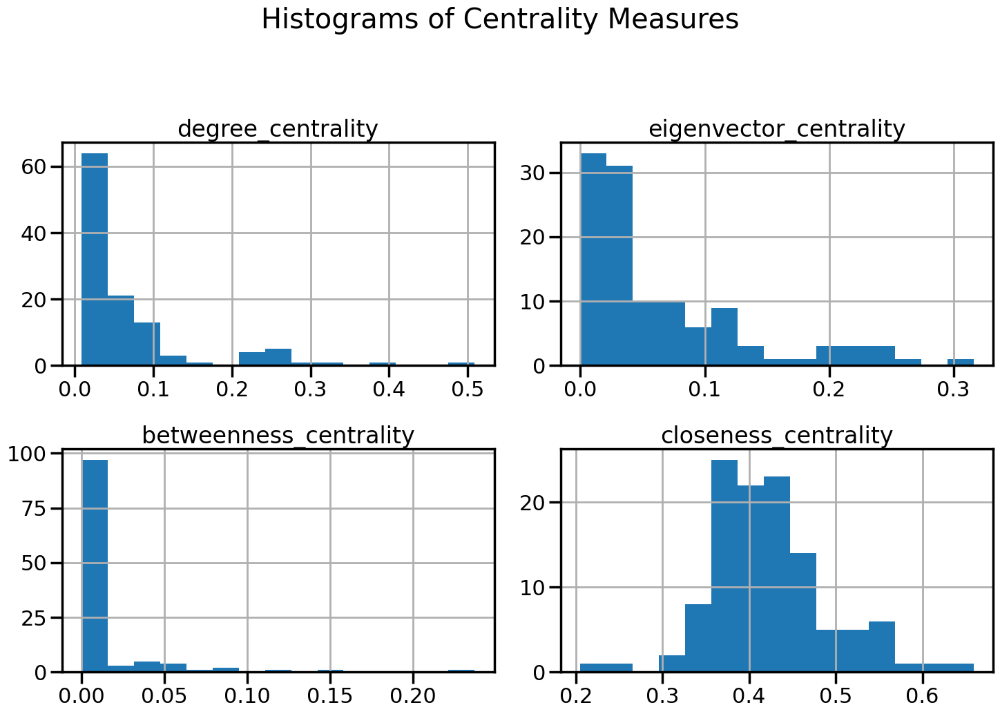

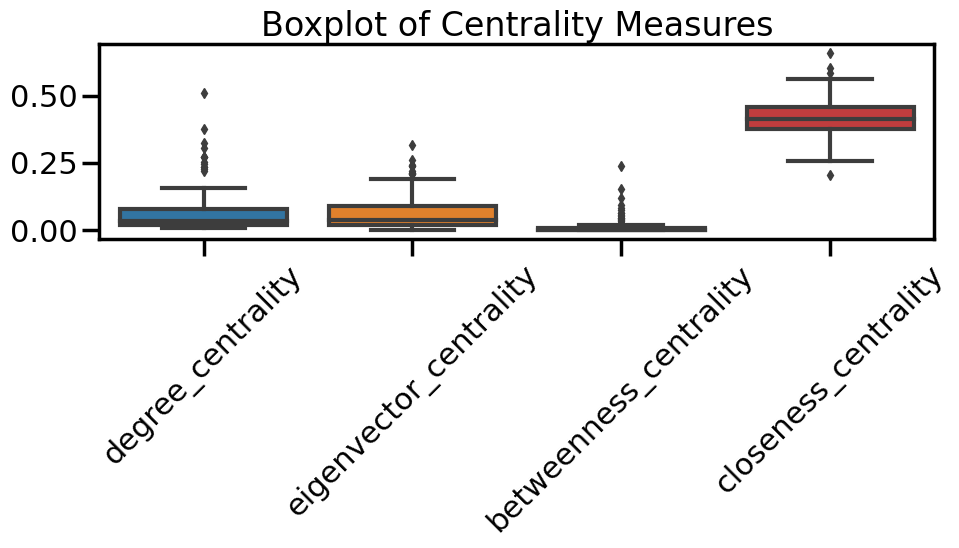

In [142]:
# Histograms for each centrality measure
centrality_df.hist(bins=15, figsize=(15, 10))
plt.suptitle('Histograms of Centrality Measures', y=1.05)  # Adjust the position of the title
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

# Boxplots to check for outliers
plt.figure(figsize=(10, 6))
sns.boxplot(data=centrality_df.drop(['node', 'patient_id'], axis=1))
plt.title('Boxplot of Centrality Measures')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to ensure everything fits without overlap
plt.show()

### Features: all patients - TCRB amino acids

In [143]:
all_patients_voterank = pd.DataFrame()

# Iterating over each patient
for patient_id, group in df_filtered.groupby('patient_id'):
    sequences = group['cdr3_amino_acid'].tolist()

    # Creating the graph for this patient using the NaiveLZGraph
    lzgraph = NaiveLZGraph(sequences, dictionary, verbose=True)

    # Lzgraph provides a method to get a NetworkX graph object
    G = nx.Graph(lzgraph.edges())  # Adjust if needed to correctly interface with your lzgraph object

    # Displaying the number of nodes before removing isolates
    print(f"Patient {patient_id} - Number of nodes before removing isolates: {G.number_of_nodes()}")

    # Removing isolates from the graph
    isolates = list(nx.isolates(G))
    G.remove_nodes_from(isolates)

    # Displaying the number of nodes after removing isolates
    print(f"Patient {patient_id} - Isolates removed. Number of nodes remaining: {G.number_of_nodes()}")

    # Calculating centrality measures
    degree_centrality = nx.degree_centrality(G)
    eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)
    betweenness_centrality = nx.betweenness_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)

    # Calculating voterank - it gives a list of important nodes directly
    important_nodes = nx.voterank(G)

    # Preparing a DataFrame for this patient's data
    centrality_df = pd.DataFrame({
        'node': list(G.nodes()),
        'degree_centrality': [degree_centrality.get(node, 0) for node in G.nodes()],
        'eigenvector_centrality': [eigenvector_centrality.get(node, 0) for node in G.nodes()],
        'betweenness_centrality': [betweenness_centrality.get(node, 0) for node in G.nodes()],
        'closeness_centrality': [closeness_centrality.get(node, 0) for node in G.nodes()],
        'patient_id': patient_id  # Add patient ID column for each row
    })

    # Mapping voterank to the nodes and assign the ranking as score
    centrality_df['voterank_score'] = centrality_df['node'].apply(lambda x: important_nodes.index(x) + 1 if x in important_nodes else None)

    # Appending this patient's data to the all_patients_voterank DataFrame
    all_patients_voterank = pd.concat([all_patients_voterank, centrality_df], ignore_index=True)

Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 100_1 - Number of nodes before removing isolates: 115
Patient 100_1 - Isolates removed. Number of nodes remaining: 115


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 100_2 - Number of nodes before removing isolates: 103
Patient 100_2 - Isolates removed. Number of nodes remaining: 103


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.04  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
Graph Edge Weight Normalized.. |  0.07  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 101_1 - Number of nodes before removing isolates: 153
Patient 101_1 - Isolates removed. Number of nodes remaining: 153


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 101_2 - Number of nodes before removing isolates: 91
Patient 101_2 - Isolates removed. Number of nodes remaining: 91
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 102_1 - Number of nodes before removing isolates: 118
Patient 102_1 - Isolates removed. Number of nodes remaining: 118
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 102_2 - Number of nodes before removing isolates: 91
Patient 102_2 - Isolates removed. Number of nodes remaining: 91
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpatt

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


 |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 103_1 - Number of nodes before removing isolates: 102
Patient 103_1 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 103_2 - Number of nodes before removing isolates: 110
Patient 103_2 - Isolates removed. Number of nodes remaining: 110
Graph Constructed.. |  0.04  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
Graph Edge Weight Normalized.. |  0.07  Seconds
Terminal State Map Derived.. |  0.08  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 104_1 - Number of nodes before removing isolates: 142
Patient 104_1 - Isolates removed. Number of nodes remaining: 142


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 104_2 - Number of nodes before removing isolates: 138
Patient 104_2 - Isolates removed. Number of nodes remaining: 138
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 1053BW - Number of nodes before removing isolates: 111
Patient 1053BW - Isolates removed. Number of nodes remaining: 111
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 105_1 - Number of nodes before removing isolates: 91
Patient 105_1 - Isolates removed. Number of nodes remaining: 91


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 105_2 - Number of nodes before removing isolates: 117
Patient 105_2 - Isolates removed. Number of nodes remaining: 117
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 106_1 - Number of nodes before removing isolates: 122
Patient 106_1 - Isolates removed. Number of nodes remaining: 122
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 106_2 - Number of nodes before removing isolates: 107
Patient 106_2 - Isolates removed. Number of nodes remaining: 107
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpa

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 108_1 - Number of nodes before removing isolates: 103
Patient 108_1 - Isolates removed. Number of nodes remaining: 103
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 108_2 - Number of nodes before removing isolates: 125
Patient 108_2 - Isolates removed. Number of nodes remaining: 125


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 109_1 - Number of nodes before removing isolates: 78
Patient 109_1 - Isolates removed. Number of nodes remaining: 78
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 109_2 - Number of nodes before removing isolates: 76
Patient 109_2 - Isolates removed. Number of nodes remaining: 76


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 10_1 - Number of nodes before removing isolates: 172
Patient 10_1 - Isolates removed. Number of nodes remaining: 172


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 10_2 - Number of nodes before removing isolates: 130
Patient 10_2 - Isolates removed. Number of nodes remaining: 130
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 110_1 - Number of nodes before removing isolates: 131
Patient 110_1 - Isolates removed. Number of nodes remaining: 131
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 110_2 - Number of nodes before removing isolates: 106
Patient 110_2 - Isolates removed. Number of nodes remaining: 106
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 111_1 - Number of nodes before removing isolates: 124
Patient 111_1 - Isolates removed. Number of nodes remaining: 124
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpa

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 112_1 - Number of nodes before removing isolates: 134
Patient 112_1 - Isolates removed. Number of nodes remaining: 134
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 112_2 - Number of nodes before removing isolates: 149
Patient 112_2 - Isolates removed. Number of nodes remaining: 149


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 113_1 - Number of nodes before removing isolates: 135
Patient 113_1 - Isolates removed. Number of nodes remaining: 135


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 113_2 - Number of nodes before removing isolates: 125
Patient 113_2 - Isolates removed. Number of nodes remaining: 125
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 114_1 - Number of nodes before removing isolates: 111
Patient 114_1 - Isolates removed. Number of nodes remaining: 111
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 114_2 - Number of nodes before removing isolates: 117
Patient 114_2 - Isolates removed. Number of nodes remaining: 117


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 115_1 - Number of nodes before removing isolates: 130
Patient 115_1 - Isolates removed. Number of nodes remaining: 130
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 115_2 - Number of nodes before removing isolates: 140
Patient 115_2 - Isolates removed. Number of nodes remaining: 140
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})



Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 116_1 - Number of nodes before removing isolates: 155
Patient 116_1 - Isolates removed. Number of nodes remaining: 155
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 116_2 - Number of nodes before removing isolates: 115
Patient 116_2 - Isolates removed. Number of nodes remaining: 115
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 117_1 - Number of nodes before removing isolates: 88
Patient 117_1 - Isolates removed. Number of nodes remaining: 88
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 117_2 - Number of nodes before removing isolates: 121
Patient 117_2 - Isolates removed. Number of nodes remaining: 121


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.05  Seconds
Graph Metadata Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
Graph Edge Weight Normalized.. |  0.07  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 1193BW - Number of nodes before removing isolates: 227
Patient 1193BW - Isolates removed. Number of nodes remaining: 227
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 119_1 - Number of nodes before removing isolates: 105
Patient 119_1 - Isolates removed. Number of nodes remaining: 105
Graph Construc

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 11_1 - Number of nodes before removing isolates: 83
Patient 11_1 - Isolates removed. Number of nodes remaining: 83
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 11_2 - Number of nodes before removing isolates: 74
Patient 11_2 - Isolates removed. Number of nodes remaining: 74


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 120_1 - Number of nodes before removing isolates: 149
Patient 120_1 - Isolates removed. Number of nodes remaining: 149


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 120_2 - Number of nodes before removing isolates: 148
Patient 120_2 - Isolates removed. Number of nodes remaining: 148


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 121_1 - Number of nodes before removing isolates: 84
Patient 121_1 - Isolates removed. Number of nodes remaining: 84
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 121_2 - Number of nodes before removing isolates: 92
Patient 121_2 - Isolates removed. Number of nodes remaining: 92


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 122_1 - Number of nodes before removing isolates: 137
Patient 122_1 - Isolates removed. Number of nodes remaining: 137


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 122_2 - Number of nodes before removing isolates: 155
Patient 122_2 - Isolates removed. Number of nodes remaining: 155


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 123_1 - Number of nodes before removing isolates: 136
Patient 123_1 - Isolates removed. Number of nodes remaining: 136
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. | 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


 0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 123_2 - Number of nodes before removing isolates: 127
Patient 123_2 - Isolates removed. Number of nodes remaining: 127
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 124_1 - Number of nodes before removing isolates: 96
Patient 124_1 - Isolates removed. Number of nodes remaining: 96
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 124_2 - Number of nodes before removing isolates: 102
Patient 124_2 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpatt

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 125_2 - Number of nodes before removing isolates: 163
Patient 125_2 - Isolates removed. Number of nodes remaining: 163
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 126_1 - Number of nodes before removing isolates: 143
Patient 126_1 - Isolates removed. Number of nodes remaining: 143
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 126_2 - Number of nodes before removing isolates: 144
Patient 126_2 - Isolates removed. Number of nodes remaining: 144
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 127_1 - Number of nodes before removing isolates: 90
Patient 127_1 - Isolates removed. Number of nodes remaining: 90
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Indi

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 128_1 - Number of nodes before removing isolates: 113
Patient 128_1 - Isolates removed. Number of nodes remaining: 113
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 128_2 - Number of nodes before removing isolates: 131
Patient 128_2 - Isolates removed. Number of nodes remaining: 131
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 129_1 - Number of nodes before removing isolates: 84
Patient 129_1 - Isolates removed. Number of nodes remaining: 84


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 129_2 - Number of nodes before removing isolates: 125
Patient 129_2 - Isolates removed. Number of nodes remaining: 125
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 12_1 - Number of nodes before removing isolates: 98
Patient 12_1 - Isolates removed. Number of nodes remaining: 98


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 12_2 - Number of nodes before removing isolates: 90
Patient 12_2 - Isolates removed. Number of nodes remaining: 90
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.15  Seconds


Patient 130_1 - Number of nodes before removing isolates: 79
Patient 130_1 - Isolates removed. Number of nodes remaining: 79
Graph Constructed.. |  1.51  Seconds
Graph Metadata Derived.. |  1.52  Seconds
Individual Subpattern Empirical Probability Derived.. |  1.56  Seconds
Graph Edge Weight Normalized.. |  1.56  Seconds
Terminal State Map Derived.. |  1.57  Seconds
Individual Subpattern Empirical Probability Derived.. |  1.66  Seconds
LZGraph Created Successfully.. |  1.66  Seconds


Patient 130_2 - Number of nodes before removing isolates: 104
Patient 130_2 - Isolates removed. Number of nodes remaining: 104


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.05  Seconds
Graph Metadata Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
Graph Edge Weight Normalized.. |  0.09  Seconds
Terminal State Map Derived.. |  0.12  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.31  Seconds
LZGraph Created Successfully.. |  0.32  Seconds


Patient 131_1 - Number of nodes before removing isolates: 107
Patient 131_1 - Isolates removed. Number of nodes remaining: 107
Graph Constructed.. |  0.08  Seconds
Graph Metadata Derived.. |  0.08  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
Graph Edge Weight Normalized.. |  0.13  Seconds
Terminal State Map Derived.. |  0.16  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.42  Seconds
LZGraph Created Successfully.. |  0.42  Seconds


Patient 131_2 - Number of nodes before removing isolates: 143
Patient 131_2 - Isolates removed. Number of nodes remaining: 143
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 132_1 - Number of nodes before removing isolates: 86
Patient 132_1 - Isolates removed. Number of nodes remaining: 86
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 132_2 - Number of nodes before removing isolates: 134
Patient 132_2 - Isolates removed. Number of nodes remaining: 134
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 133_1 - Number of nodes before removing isolates: 56
Patient 133_1 - Isolates removed. Number of nodes remaining: 56
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpatt

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 134_1 - Number of nodes before removing isolates: 101
Patient 134_1 - Isolates removed. Number of nodes remaining: 101
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 134_2 - Number of nodes before removing isolates: 112
Patient 134_2 - Isolates removed. Number of nodes remaining: 112
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 135_1 - Number of nodes before removing isolates: 93
Patient 135_1 - Isolates removed. Number of nodes remaining: 93


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 135_2 - Number of nodes before removing isolates: 127
Patient 135_2 - Isolates removed. Number of nodes remaining: 127
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 136_1 - Number of nodes before removing isolates: 104
Patient 136_1 - Isolates removed. Number of nodes remaining: 104
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 136_2 - Number of nodes before removing isolates: 92
Patient 136_2 - Isolates removed. Number of nodes remaining: 92
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpatt

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


 0.06  Seconds


Patient 137_2 - Number of nodes before removing isolates: 128
Patient 137_2 - Isolates removed. Number of nodes remaining: 128
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 13_1 - Number of nodes before removing isolates: 97
Patient 13_1 - Isolates removed. Number of nodes remaining: 97


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 13_2 - Number of nodes before removing isolates: 49
Patient 13_2 - Isolates removed. Number of nodes remaining: 49
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 141_1 - Number of nodes before removing isolates: 123
Patient 141_1 - Isolates removed. Number of nodes remaining: 123
Graph Constructed.. 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 142_1 - Number of nodes before removing isolates: 69
Patient 142_1 - Isolates removed. Number of nodes remaining: 69
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 142_2 - Number of nodes before removing isolates: 72
Patient 142_2 - Isolates removed. Number of nodes remaining: 72
Graph Constructed.. 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 144_1 - Number of nodes before removing isolates: 91
Patient 144_1 - Isolates removed. Number of nodes remaining: 91
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 144_2 - Number of nodes before removing isolates: 130
Patient 144_2 - Isolates removed. Number of nodes remaining: 130


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 145_1 - Number of nodes before removing isolates: 73
Patient 145_1 - Isolates removed. Number of nodes remaining: 73
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 145_2 - Number of nodes before removing isolates: 22
Patient 145_2 - Isolates removed. Number of nodes remaining: 22
Graph Constructed.. 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 147_1 - Number of nodes before removing isolates: 74
Patient 147_1 - Isolates removed. Number of nodes remaining: 74
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 147_2 - Number of nodes before removing isolates: 102
Patient 147_2 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 14_1 - Number of nodes before removing isolates: 140
Patient 14_1 - Isolates removed. Number of nodes remaining: 140
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 15_1 - Number of nodes before removing isolates: 82
Patient 15_1 - Isolates removed. Number of nodes remaining: 82
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 16_1 - Number of nodes before removing isolates: 147
Patient 16_1 - Isolates removed. Number of nodes remaining: 147


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 16_2 - Number of nodes before removing isolates: 136
Patient 16_2 - Isolates removed. Number of nodes remaining: 136
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 17_1 - Number of nodes before removing isolates: 128
Patient 17_1 - Isolates removed. Number of nodes remaining: 128
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 17_2 - Number of nodes before removing isolates: 124
Patient 17_2 - Isolates removed. Number of nodes remaining: 124
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 18_1 - Number of nodes before removing isolates: 58
Patient 18_1 - Isolates removed. Number of nodes remaining: 58
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 19_2 - Number of nodes before removing isolates: 141
Patient 19_2 - Isolates removed. Number of nodes remaining: 141


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 1_1 - Number of nodes before removing isolates: 134
Patient 1_1 - Isolates removed. Number of nodes remaining: 134
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 1_2 - Number of nodes before removing isolates: 109
Patient 1_2 - Isolates removed. Number of nodes remaining: 109
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 20_1 - Number of nodes before removing isolates: 71
Patient 20_1 - Isolates removed. Number of nodes remaining: 71
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 20_2 - Number of nodes before removing isolates: 84
Patient 20_2 - Isolates removed. Number of nodes remaining: 84
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 22_1 - Number of nodes before removing isolates: 80
Patient 22_1 - Isolates removed. Number of nodes remaining: 80
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Em

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 23_1 - Number of nodes before removing isolates: 117
Patient 23_1 - Isolates removed. Number of nodes remaining: 117
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 23_2 - Number of nodes before removing isolates: 142
Patient 23_2 - Isolates removed. Number of nodes remaining: 142


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 24_1 - Number of nodes before removing isolates: 160
Patient 24_1 - Isolates removed. Number of nodes remaining: 160
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 24_2 - Number of nodes before removing isolates: 110
Patient 24_2 - Isolates removed. Number of nodes remaining: 110


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.05  Seconds
Graph Metadata Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
Graph Edge Weight Normalized.. |  0.07  Seconds
Terminal State Map Derived.. |  0.08  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 25_1 - Number of nodes before removing isolates: 158
Patient 25_1 - Isolates removed. Number of nodes remaining: 158
Graph Constructed.. |  0.04  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 25_2 - Number of nodes before removing isolates: 153
Patient 25_2 - Isolates removed. Number of nodes remaining: 153


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 26_1 - Number of nodes before removing isolates: 101
Patient 26_1 - Isolates removed. Number of nodes remaining: 101
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 26_2 - Number of nodes before removing isolates: 102


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Patient 26_2 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 2773BW - Number of nodes before removing isolates: 130
Patient 2773BW - Isolates removed. Number of nodes remaining: 130


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 27_1 - Number of nodes before removing isolates: 150
Patient 27_1 - Isolates removed. Number of nodes remaining: 150
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 27_2 - Number of nodes before removing isolates: 135
Patient 27_2 - Isolates removed. Number of nodes remaining: 135
Graph Constructed.. 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 28_1 - Number of nodes before removing isolates: 122
Patient 28_1 - Isolates removed. Number of nodes remaining: 122
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 28_2 - Number of nodes before removing isolates: 98
Patient 28_2 - Isolates removed. Number of nodes remaining: 98


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 2982BW - Number of nodes before removing isolates: 167
Patient 2982BW - Isolates removed. Number of nodes remaining: 167
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 29_1 - Number of nodes before removing isolates: 113
Patient 29_1 - Isolates removed. Number of nodes remaining: 113
Graph Constructe

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Patient 29_2 - Isolates removed. Number of nodes remaining: 119
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 2_1 - Number of nodes before removing isolates: 214
Patient 2_1 - Isolates removed. Number of nodes remaining: 214


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.04  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 2_2 - Number of nodes before removing isolates: 190
Patient 2_2 - Isolates removed. Number of nodes remaining: 190


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 30_1 - Number of nodes before removing isolates: 82
Patient 30_1 - Isolates removed. Number of nodes remaining: 82
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 30_2 - Number of nodes before removing isolates: 124
Patient 30_2 - Isolates removed. Number of nodes remaining: 124


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 3126BW - Number of nodes before removing isolates: 115
Patient 3126BW - Isolates removed. Number of nodes remaining: 115


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 31_1 - Number of nodes before removing isolates: 130
Patient 31_1 - Isolates removed. Number of nodes remaining: 130


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 31_2 - Number of nodes before removing isolates: 122
Patient 31_2 - Isolates removed. Number of nodes remaining: 122


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 3283BW - Number of nodes before removing isolates: 111
Patient 3283BW - Isolates removed. Number of nodes remaining: 111


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 32_1 - Number of nodes before removing isolates: 66
Patient 32_1 - Isolates removed. Number of nodes remaining: 66
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 32_2 - Number of nodes before removing isolates: 76
Patient 32_2 - Isolates removed. Number of nodes remaining: 76
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 33_1 - Number of nodes before removing isolates: 80
Patient 33_1 - Isolates removed. Number of nodes remaining: 80


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 33_2 - Number of nodes before removing isolates: 123
Patient 33_2 - Isolates removed. Number of nodes remaining: 123
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 34_1 - Number of nodes before removing isolates: 110
Patient 34_1 - Isolates removed. Number of nodes remaining: 110


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 34_2 - Number of nodes before removing isolates: 131
Patient 34_2 - Isolates removed. Number of nodes remaining: 131


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 3577BW - Number of nodes before removing isolates: 73
Patient 3577BW - Isolates removed. Number of nodes remaining: 73
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 35_1 - Number of nodes before removing isolates: 97
Patient 35_1 - Isolates removed. Number of nodes remaining: 97
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 35_2 - Number of nodes before removing isolates: 89
Patient 35_2 - Isolates removed. Number of nodes remaining: 89


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 36_1 - Number of nodes before removing isolates: 117
Patient 36_1 - Isolates removed. Number of nodes remaining: 117
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 36_2 - Number of nodes before removing isolates: 117
Patient 36_2 - Isolates removed. Number of nodes remaining: 117


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 39_1 - Number of nodes before removing isolates: 118
Patient 39_1 - Isolates removed. Number of nodes remaining: 118


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 39_2 - Number of nodes before removing isolates: 163
Patient 39_2 - Isolates removed. Number of nodes remaining: 163


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 3_1 - Number of nodes before removing isolates: 80
Patient 3_1 - Isolates removed. Number of nodes remaining: 80
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 3_2 - Number of nodes before removing isolates: 105

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})



Patient 3_2 - Isolates removed. Number of nodes remaining: 105
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 40_1 - Number of nodes before removing isolates: 83
Patient 40_1 - Isolates removed. Number of nodes remaining: 83


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 40_2 - Number of nodes before removing isolates: 102
Patient 40_2 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 41_1 - Number of nodes before removing isolates: 138
Patient 41_1 - Isolates removed. Number of nodes remaining: 138


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 41_2 - Number of nodes before removing isolates: 81
Patient 41_2 - Isolates removed. Number of nodes remaining: 81
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 42_1 - Number of nodes before removing isolates: 111
Patient 42_1 - Isolates removed. Number of nodes remaining: 111


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 42_2 - Number of nodes before removing isolates: 104
Patient 42_2 - Isolates removed. Number of nodes remaining: 104
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 43_1 - Number of nodes before removing isolates: 93
Patient 43_1 - Isolates removed. Number of nodes remaining: 93


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 43_2 - Number of nodes before removing isolates: 102
Patient 43_2 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
LZGraph Created Successfully.. |  0.03  Seconds


Patient 44_1 - Number of nodes before removing isolates: 59
Patient 44_1 - Isolates removed. Number of nodes remaining: 59
Graph Constructed.. | 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers


Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 44_2 - Number of nodes before removing isolates: 99
Patient 44_2 - Isolates removed. Number of nodes remaining: 99
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 45_1 - Number of nodes before removing isolates: 151
Patient 45_1 - Isolates removed. Number of nodes remaining: 151


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 45_2 - Number of nodes before removing isolates: 122
Patient 45_2 - Isolates removed. Number of nodes remaining: 122
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
LZGraph Created Successfully.. |  0.04  Seconds


Patient 47_1 - Number of nodes before removing isolates: 49
Patient 47_1 - Isolates removed. Number of nodes remaining: 49
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 47_2 - Number of nodes before removing isolates: 65
Patient 47_2 - Isolates removed. Number of nodes remaining: 65
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Em

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 49_1 - Number of nodes before removing isolates: 104
Patient 49_1 - Isolates removed. Number of nodes remaining: 104
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 49_2 - Number of nodes before removing isolates: 105
Patient 49_2 - Isolates removed. Number of nodes remaining: 105


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 4_1 - Number of nodes before removing isolates: 148
Patient 4_1 - Isolates removed. Number of nodes remaining: 148


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 4_2 - Number of nodes before removing isolates: 152
Patient 4_2 - Isolates removed. Number of nodes remaining: 152


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 5046BW - Number of nodes before removing isolates: 164
Patient 5046BW - Isolates removed. Number of nodes remaining: 164


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 50_1 - Number of nodes before removing isolates: 106
Patient 50_1 - Isolates removed. Number of nodes remaining: 106


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.35  Seconds
Graph Metadata Derived.. |  0.36  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.37  Seconds
Graph Edge Weight Normalized.. |  0.37  Seconds
Terminal State Map Derived.. |  0.38  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.4  Seconds
LZGraph Created Successfully.. |  0.4  Seconds


Patient 50_2 - Number of nodes before removing isolates: 104
Patient 50_2 - Isolates removed. Number of nodes remaining: 104
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 51_1 - Number of nodes before removing isolates: 117
Patient 51_1 - Isolates removed. Number of nodes remaining: 117


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 51_2 - Number of nodes before removing isolates: 119
Patient 51_2 - Isolates removed. Number of nodes remaining: 119
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 52_1 - Number of nodes before removing isolates: 109
Patient 52_1 - Isolates removed. Number of nodes remaining: 109
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 52_2 - Number of nodes before removing isolates: 107
Patient 52_2 - Isolates removed. Number of nodes remaining: 107


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 53_1 - Number of nodes before removing isolates: 84
Patient 53_1 - Isolates removed. Number of nodes remaining: 84
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 53_2 - Number of nodes before removing isolates: 96
Patient 53_2 - Isolates removed. Number of nodes remaining: 96


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 55_1 - Number of nodes before removing isolates: 89
Patient 55_1 - Isolates removed. Number of nodes remaining: 89
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 56_1 - Number of nodes before removing isolates: 141
Patient 56_1 - Isolates removed. Number of nodes remaining: 141


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 56_2 - Number of nodes before removing isolates: 117
Patient 56_2 - Isolates removed. Number of nodes remaining: 117
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 57_1 - Number of nodes before removing isolates: 122
Patient 57_1 - Isolates removed. Number of nodes remaining: 122
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 57_2 - Number of nodes before removing isolates: 139
Patient 57_2 - Isolates removed. Number of nodes remaining: 139
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpatter

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 59_1 - Number of nodes before removing isolates: 112
Patient 59_1 - Isolates removed. Number of nodes remaining: 112
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 59_2 - Number of nodes before removing isolates: 116
Patient 59_2 - Isolates removed. Number of nodes remaining: 116
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 5_1 - Number of nodes before removing isolates: 81
Patient 5_1 - Isolates removed. Number of nodes remaining: 81


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 5_2 - Number of nodes before removing isolates: 102
Patient 5_2 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 60_1 - Number of nodes before removing isolates: 131
Patient 60_1 - Isolates removed. Number of nodes remaining: 131


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 60_2 - Number of nodes before removing isolates: 181
Patient 60_2 - Isolates removed. Number of nodes remaining: 181
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 6130BW - Number of nodes before removing isolates: 183
Patient 6130BW - Isolates removed. Number of nodes remaining: 183


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 61_1 - Number of nodes before removing isolates: 99
Patient 61_1 - Isolates removed. Number of nodes remaining: 99
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 61_2 - Number of nodes before removing isolates: 154
Patient 61_2 - Isolates removed. Number of nodes remaining: 154
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 62_1 - Number of nodes before removing isolates: 105
Patient 62_1 - Isolates removed. Number of nodes remaining: 105
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 62_2 - Number of nodes before removing isolates: 118
Patient 62_2 - Isolates removed. Number of nodes remaining: 118
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpatter

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 63_2 - Number of nodes before removing isolates: 130
Patient 63_2 - Isolates removed. Number of nodes remaining: 130
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 66_1 - Number of nodes before removing isolates: 160
Patient 66_1 - Isolates removed. Number of nodes remaining: 160
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 66_2 - Number of nodes before removing isolates: 148
Patient 66_2 - Isolates removed. Number of nodes remaining: 148


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 67_1 - Number of nodes before removing isolates: 125
Patient 67_1 - Isolates removed. Number of nodes remaining: 125
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 67_2 - Number of nodes before removing isolates: 126
Patient 67_2 - Isolates removed. Number of nodes remaining: 126


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 68_1 - Number of nodes before removing isolates: 94
Patient 68_1 - Isolates removed. Number of nodes remaining: 94
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 68_2 - Number of nodes before removing isolates: 87
Patient 68_2 - Isolates removed. Number of nodes remaining: 87


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 69_1 - Number of nodes before removing isolates: 118
Patient 69_1 - Isolates removed. Number of nodes remaining: 118
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived..

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


 |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 69_2 - Number of nodes before removing isolates: 136
Patient 69_2 - Isolates removed. Number of nodes remaining: 136
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 6_1 - Number of nodes before removing isolates: 105
Patient 6_1 - Isolates removed. Number of nodes remaining: 105
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Indivi

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 70_1 - Number of nodes before removing isolates: 81
Patient 70_1 - Isolates removed. Number of nodes remaining: 81
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 70_2 - Number of nodes before removing isolates: 124
Patient 70_2 - Isolates removed. Number of nodes remaining: 124


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 71_1 - Number of nodes before removing isolates: 135
Patient 71_1 - Isolates removed. Number of nodes remaining: 135


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 71_2 - Number of nodes before removing isolates: 105
Patient 71_2 - Isolates removed. Number of nodes remaining: 105


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 72_1 - Number of nodes before removing isolates: 102
Patient 72_1 - Isolates removed. Number of nodes remaining: 102


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.04  Seconds
Graph Metadata Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
Graph Edge Weight Normalized.. |  0.07  Seconds
Terminal State Map Derived.. |  0.08  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 72_2 - Number of nodes before removing isolates: 130
Patient 72_2 - Isolates removed. Number of nodes remaining: 130


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 73_1 - Number of nodes before removing isolates: 86
Patient 73_1 - Isolates removed. Number of nodes remaining: 86
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 73_2 - Number of nodes before removing isolates: 90
Patient 73_2 - Isolates removed. Number of nodes remaining: 90
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 74_1 - Number of nodes before removing isolates: 116
Patient 74_1 - Isolates removed. Number of nodes remaining: 116


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 74_2 - Number of nodes before removing isolates: 80
Patient 74_2 - Isolates removed. Number of nodes remaining: 80
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 7541BW - Number of nodes before removing isolates: 147
Patient 7541BW - Isolates removed. Number of nodes remaining: 147
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 75_1 - Number of nodes before removing isolates: 130
Patient 75_1 - Isolates removed. Number of nodes remaining: 130


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 75_2 - Number of nodes before removing isolates: 101
Patient 75_2 - Isolates removed. Number of nodes remaining: 101


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 76_1 - Number of nodes before removing isolates: 121
Patient 76_1 - Isolates removed. Number of nodes remaining: 121


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 76_2 - Number of nodes before removing isolates: 131
Patient 76_2 - Isolates removed. Number of nodes remaining: 131


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 77_1 - Number of nodes before removing isolates: 165
Patient 77_1 - Isolates removed. Number of nodes remaining: 165


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 77_2 - Number of nodes before removing isolates: 159
Patient 77_2 - Isolates removed. Number of nodes remaining: 159


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 78_1 - Number of nodes before removing isolates: 124
Patient 78_1 - Isolates removed. Number of nodes remaining: 124


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 78_2 - Number of nodes before removing isolates: 104
Patient 78_2 - Isolates removed. Number of nodes remaining: 104


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 79_1 - Number of nodes before removing isolates: 85
Patient 79_1 - Isolates removed. Number of nodes remaining: 85
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 79_2 - Number of nodes before removing isolates: 82
Patient 79_2 - Isolates removed. Number of nodes remaining: 82
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 7_1 - Number of nodes before removing isolates: 131
Patient 7_1 - Isolates removed. Number of nodes remaining: 131


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 7_2 - Number of nodes before removing isolates: 81
Patient 7_2 - Isolates removed. Number of nodes remaining: 81
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 80_1 - Number of nodes before removing isolates: 87
Patient 80_1 - Isolates removed. Number of nodes remaining: 87


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 80_2 - Number of nodes before removing isolates: 82
Patient 80_2 - Isolates removed. Number of nodes remaining: 82
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 81_1 - Number of nodes before removing isolates: 121
Patient 81_1 - Isolates removed. Number of nodes remaining: 121


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 81_2 - Number of nodes before removing isolates: 136
Patient 81_2 - Isolates removed. Number of nodes remaining: 136


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.06  Seconds
Graph Metadata Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
Graph Edge Weight Normalized.. |  0.08  Seconds
Terminal State Map Derived.. |  0.08  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 82_1 - Number of nodes before removing isolates: 145
Patient 82_1 - Isolates removed. Number of nodes remaining: 145
Graph Constructed.. |  0.01  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 82_2 - Number of nodes before removing isolates: 105
Patient 82_2 - Isolates removed. Number of nodes remaining: 105
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 83_1 - Number of nodes before removing isolates: 181
Patient 83_1 - Isolates removed. Number of nodes remaining: 181
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 83_2 - Number of nodes before removing isolates: 92
Patient 83_2 - Isolates removed. Number of nodes remaining: 92
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 86_2 - Number of nodes before removing isolates: 106
Patient 86_2 - Isolates removed. Number of nodes remaining: 106
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 87_1 - Number of nodes before removing isolates: 108
Patient 87_1 - Isolates removed. Number of nodes remaining: 108


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 87_2 - Number of nodes before removing isolates: 115
Patient 87_2 - Isolates removed. Number of nodes remaining: 115
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 88_1 - Number of nodes before removing isolates: 124
Patient 88_1 - Isolates removed. Number of nodes remaining: 124


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 88_2 - Number of nodes before removing isolates: 107
Patient 88_2 - Isolates removed. Number of nodes remaining: 107
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 8_1 - Number of nodes before removing isolates: 67
Patient 8_1 - Isolates removed. Number of nodes remaining: 67


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 90_1 - Number of nodes before removing isolates: 90
Patient 90_1 - Isolates removed. Number of nodes remaining: 90
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 90_2 - Number of nodes before removing isolates: 95
Patient 90_2 - Isolates removed. Number of nodes remaining: 95


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 91_1 - Number of nodes before removing isolates: 112
Patient 91_1 - Isolates removed. Number of nodes remaining: 112
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 91_2 - Number of nodes before removing isolates: 86
Patient 91_2 - Isolates removed. Number of nodes remaining: 86


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 92_1 - Number of nodes before removing isolates: 90
Patient 92_1 - Isolates removed. Number of nodes remaining: 90
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 92_2 - Number of nodes before removing isolates: 72
Patient 92_2 - Isolates removed. Number of nodes remaining: 72
Graph Constructed.. |  0

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 93_1 - Number of nodes before removing isolates: 103
Patient 93_1 - Isolates removed. Number of nodes remaining: 103
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 93_2 - Number of nodes before removing isolates: 117
Patient 93_2 - Isolates removed. Number of nodes remaining: 117


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 94_1 - Number of nodes before removing isolates: 116
Patient 94_1 - Isolates removed. Number of nodes remaining: 116
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 94_2 - Number of nodes before removing isolates: 95
Patient 94_2 - Isolates removed. Number of nodes remaining: 95


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
LZGraph Created Successfully.. |  0.04  Seconds


Patient 96_1 - Number of nodes before removing isolates: 53
Patient 96_1 - Isolates removed. Number of nodes remaining: 53
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 96_2 - Number of nodes before removing isolates: 89
Patient 96_2 - Isolates removed. Number of nodes remaining: 89
Graph Constructed.. |  0

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 97_1 - Number of nodes before removing isolates: 95
Patient 97_1 - Isolates removed. Number of nodes remaining: 95
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 97_2 - Number of nodes before removing isolates: 117
Patient 97_2 - Isolates removed. Number of nodes remaining: 117
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 98_1 - Number of nodes before removing isolates: 80
Patient 98_1 - Isolates removed. Number of nodes remaining: 80
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 98_2 - Number of nodes before removing isolates: 68
Patient 98_2 - Isolates removed. Number of nodes remaining: 68
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Em

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient BP0319250 - Number of nodes before removing isolates: 134
Patient BP0319250 - Isolates removed. Number of nodes remaining: 134
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient BP05191345 - Number of nodes before removing isolates: 144
Patient BP05191345 - Isolates removed. Number of nodes remaining: 144
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient BP08191115 - Number of nodes before removing isolates: 138
Patient BP08191115 - Isolates removed. Number of nodes remaining: 138


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient CL2 - Number of nodes before removing isolates: 163
Patient CL2 - Isolates removed. Number of nodes remaining: 163
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient Mix_donor1 - Number of nodes before removing isolates: 160
Patient Mix_donor1 - Isolates removed. Number of nodes remaining: 160


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


In [144]:
all_patients_voterank.shape

(30657, 7)

In [145]:
# Aggregating clinical data to ensure unique patient_id for merging
# Replacing 'd_cond' with the actual clinical data column that should be the same for each patient_id
df_filtered_agg = df_filtered.groupby('patient_id').agg({
    'd_cond': 'first'
}).reset_index()

# Merging the all_patients_voterank DataFrame with the aggregated clinical data
merged_df_voterank = pd.merge(all_patients_voterank, df_filtered_agg, on='patient_id', how='left')

# Printing the shape of the merged DataFrame to confirm the merge
print("Shape after merging with clinical data:", merged_df_voterank.shape)

Shape after merging with clinical data: (30657, 8)


In [146]:
merged_df_voterank.head()

,node,degree_centrality,eigenvector_centrality,betweenness_centrality,closeness_centrality,patient_id,voterank_score,d_cond
0,A,0.105263,0.115131,0.010843,0.478992,100_1,18.0,mild
1,D,0.271930,0.237558,0.045623,0.556098,100_1,10.0,mild
2,S,0.271930,0.219657,0.043211,0.525346,100_1,6.0,mild
3,I,0.114035,0.107675,0.005900,0.447059,100_1,31.0,mild
4,Q,0.236842,0.184255,0.082204,0.540284,100_1,9.0,mild


In [147]:
# Counting rows with any missing values
missing_rows_count = merged_df_voterank.isnull().any(axis=1).sum()
print(f"Number of rows with any missing values: {missing_rows_count}")

# Removing rows with any missing values and create a new DataFrame
cleaned_df = merged_df_voterank.dropna()

# Printing the shape of the new DataFrame to see the effect of removal
print("Shape of DataFrame after removing rows with missing values:", cleaned_df.shape)

# Saving the DataFrame to a CSV file for further analysis
cleaned_df.to_csv("all_patients_features.csv", index=False)

Number of rows with any missing values: 19046
Shape of DataFrame after removing rows with missing values: (11611, 8)


In [148]:
# 1. Identify unique nodes per class
unique_nodes_per_class = {}
for d_cond, group in merged_df_voterank.groupby('d_cond'):
    unique_nodes = set(group['node'].unique())
    unique_nodes_per_class[d_cond] = unique_nodes
    print(f"Number of unique nodes for class {d_cond}: {len(unique_nodes)}")

# 2. Analyze shared and unique nodes across classes
all_classes = list(unique_nodes_per_class.keys())
shared_nodes = set.intersection(*unique_nodes_per_class.values())
print(f"Number of nodes shared across all classes: {len(shared_nodes)}")

# Nodes unique to each class
unique_to_class_nodes = {}
for d_cond in all_classes:
    # Other classes' nodes
    other_classes_nodes = set.union(*(unique_nodes_per_class[cls] for cls in all_classes if cls != d_cond))
    # Unique to this class
    unique_to_class = unique_nodes_per_class[d_cond] - other_classes_nodes
    unique_to_class_nodes[d_cond] = unique_to_class
    print(f"Number of nodes unique to class {d_cond}: {len(unique_to_class)}")

Number of unique nodes for class HD: 358
Number of unique nodes for class mild: 510
Number of unique nodes for class moderate: 450
Number of unique nodes for class severe: 383
Number of nodes shared across all classes: 269
Number of nodes unique to class HD: 24
Number of nodes unique to class mild: 90
Number of nodes unique to class moderate: 62
Number of nodes unique to class severe: 31


The output provides a detailed examination of how nodes are distributed across different classes in a graph-based dataset, highlighting specific characteristics that may distinguish between the conditions associated with each class. Here’s an elaboration on what the analysis reveals:

**Unique Nodes by Class:**
- HD (Healthy or Control Group): The dataset identifies 358 nodes associated with the HD class, of which 24 are unique to it. These unique nodes might be indicative of specific traits or markers that are only present in the healthy or control population, potentially serving as indicators of a healthy state absent in diseased conditions.

- Mild: This class includes 510 nodes with 90 uniquely identifying mild conditions. The relatively higher number of unique nodes suggests a distinct set of characteristics that are present in mild conditions, which could be critical for early diagnosis or intervention.

- Moderate: With 450 nodes, of which 62 are unique, the moderate class nodes likely represent transitional features that escalate from mild but are not as severe as those in the severe category. These nodes could be crucial in understanding progression stages.

- Severe: There are 383 nodes associated with the severe class, and 31 of these are unique. These nodes are possibly linked to the most acute manifestations of the condition and might be vital for identifying critical interventions or prognostic assessments.

**Shared Nodes Across All Classes:**
- Commonality: The analysis identifies 269 nodes that are common across all classes, suggesting these nodes might represent fundamental functions or generic features that do not change with the condition's severity. These could be core biological or structural components essential across all observed states.

**Interpretation and Implications:**
Shared Nodes (269): These nodes indicate underlying commonalities that might be foundational to all classes, suggesting essential pathways or features that are consistently present regardless of the condition's severity.

**Unique Nodes:** The unique nodes for each class (24 for HD, 90 for mild, 62 for moderate, 31 for severe) highlight specific characteristics that define each condition's uniqueness. In medical or biological contexts, these nodes could serve as potential biomarkers for differentiating among various stages of a disease or health condition.

**Diagnostic and Prognostic Value:** Understanding the distinct and shared nodes can aid in the development of diagnostic tools or therapeutic strategies that target specific pathways identified by these unique nodes. Additionally, it can enhance prognostic models by incorporating these unique markers to predict disease progression or response to treatment.

This analysis not only underscores the distinctiveness and overlap among the classes but also enriches our understanding of the potential biological or pathological significance of these nodes in the context of disease severity and health. Such insights are crucial for targeted medical interventions and enhancing the specificity of diagnostic criteria

In [149]:
cleaned_df.head()

,node,degree_centrality,eigenvector_centrality,betweenness_centrality,closeness_centrality,patient_id,voterank_score,d_cond
0,A,0.105263,0.115131,0.010843,0.478992,100_1,18.0,mild
1,D,0.271930,0.237558,0.045623,0.556098,100_1,10.0,mild
2,S,0.271930,0.219657,0.043211,0.525346,100_1,6.0,mild
3,I,0.114035,0.107675,0.005900,0.447059,100_1,31.0,mild
4,Q,0.236842,0.184255,0.082204,0.540284,100_1,9.0,mild


In [150]:
encoder = LabelEncoder()
cleaned_df['node_encoded'] = encoder.fit_transform(cleaned_df['node'])

# Creating a map to check the encoding
node_mapping = dict(zip(cleaned_df['node'], cleaned_df['node_encoded']))
print("Node encoding mapping:", node_mapping)

Node encoding mapping: {'A': 0, 'D': 28, 'S': 159, 'I': 79, 'Q': 126, 'P': 111, 'T': 193, 'R': 138, 'W': 227, 'SW': 191, 'G': 56, 'GG': 61, 'GE': 59, 'L': 87, 'DT': 36, 'E': 39, 'SGS': 171, 'Y': 232, 'F': 53, 'SS': 183, 'AS': 18, 'TG': 198, 'SY': 192, 'SG': 166, 'K': 83, 'H': 77, 'M': 100, 'AN': 14, 'V': 212, 'N': 102, 'RY': 158, 'ST': 188, 'DR': 34, 'GY': 76, 'TQ': 206, 'SA': 160, 'AG': 6, 'AP': 15, 'SF': 164, 'RD': 141, 'AV': 20, 'EQ': 49, 'GS': 72, 'VA': 213, 'n': 238, 'TE': 196, 'QY': 137, 'SD': 161, 'GQ': 70, 'SL': 175, 'SE': 162, 'SN': 178, 'LF': 91, 'AY': 22, 'AQ': 16, 'QH': 132, 'AR': 17, 'GV': 74, 'GT': 73, 'GF': 60, 'GA': 57, 'GP': 69, 'AD': 2, 'SP': 179, 'GD': 58, 'VD': 214, 'AF': 4, 'VT': 224, 'SQ': 181, 'QP': 133, 'ET': 52, 'QF': 130, 'ER': 50, 'PQ': 121, 'YE': 233, 'PR': 122, 'AW': 21, 'GN': 68, 'AA': 1, 'RL': 148, 'AE': 3, 'WA': 228, 'SR': 182, 'GR': 71, 'YT': 237, 'YF': 234, 'GK': 65, 'AL': 12, 'EA': 40, 'NS': 109, 'EF': 43, 'VG': 217, 'AT': 19, 'FF': 55, 'TS': 208, 'SV

In [151]:
# Adjusting the DataFrame aggregation to maintain unique node features per patient
expanded_features = cleaned_df.groupby(['patient_id', 'node_encoded']).agg({
    'degree_centrality': 'mean',
    'eigenvector_centrality': 'mean',
    'betweenness_centrality': 'mean',
    'closeness_centrality': 'mean'
}).reset_index()

# Pivoting the DataFrame to have node_encoded as columns
node_pivot = expanded_features.pivot(index='patient_id', columns='node_encoded')

# Flattening the columns to make them suitable for machine learning models
node_pivot.columns = ['{}_{}'.format(col[0], col[1]) for col in node_pivot.columns.values]

In [152]:
node_pivot = expanded_features.pivot(index='patient_id', columns='node_encoded')
print(node_pivot.isnull().sum())

                      node_encoded
degree_centrality     0                 1
                      1               219
                      2               200
                      3               192
                      4               107
                                     ... 
closeness_centrality  234             246
                      235             249
                      236             268
                      237             195
                      238              10
Length: 956, dtype: int64


In [153]:
# Merging with the original patient data if there's more information like 'd_cond'
beta_features = pd.merge(
    node_pivot.reset_index(),
    cleaned_df[['patient_id', 'd_cond']].drop_duplicates(),
    on='patient_id',
    how='left'
)

<ipython-input-153-9937632544d9>:2: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left, 1 on the right)
  beta_features = pd.merge(


In [154]:
beta_features = pd.merge(
    node_pivot.reset_index(),
    cleaned_df[['patient_id', 'd_cond']].drop_duplicates(),
    on='patient_id',
    how='left'
)
print(beta_features.isnull().sum())

patient_id                       0
(patient_id, )                   0
(degree_centrality, 0)           1
(degree_centrality, 1)         219
(degree_centrality, 2)         200
                              ... 
(closeness_centrality, 235)    249
(closeness_centrality, 236)    268
(closeness_centrality, 237)    195
(closeness_centrality, 238)     10
d_cond                           0
Length: 959, dtype: int64


<ipython-input-154-9225776309a4>:1: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (2 levels on the left, 1 on the right)
  beta_features = pd.merge(


In [155]:
beta_features = beta_features.fillna(0)


In [156]:
beta_features.head()

,patient_id,"(patient_id, )","(degree_centrality, 0)","(degree_centrality, 1)","(degree_centrality, 2)","(degree_centrality, 3)","(degree_centrality, 4)","(degree_centrality, 5)","(degree_centrality, 6)","(degree_centrality, 7)",...,"(closeness_centrality, 230)","(closeness_centrality, 231)","(closeness_centrality, 232)","(closeness_centrality, 233)","(closeness_centrality, 234)","(closeness_centrality, 235)","(closeness_centrality, 236)","(closeness_centrality, 237)","(closeness_centrality, 238)",d_cond
0,100_1,100_1,0.105263,0.000000,0.000000,0.000000,0.000000,0.0,0.078947,0.0,...,0.0,0.0,0.553398,0.000000,0.000000,0.0,0.0,0.000000,0.257919,mild
1,100_2,100_2,0.098039,0.000000,0.000000,0.000000,0.000000,0.0,0.117647,0.0,...,0.0,0.0,0.545455,0.000000,0.000000,0.0,0.0,0.000000,0.272000,mild
2,101_1,101_1,0.118421,0.000000,0.052632,0.000000,0.039474,0.0,0.164474,0.0,...,0.0,0.0,0.562963,0.394805,0.000000,0.0,0.0,0.000000,0.274368,mild
3,101_2,101_2,0.144444,0.044444,0.000000,0.022222,0.033333,0.0,0.111111,0.0,...,0.0,0.0,0.526316,0.000000,0.000000,0.0,0.0,0.000000,0.261628,mild
4,102_1,102_1,0.119658,0.000000,0.000000,0.000000,0.059829,0.0,0.145299,0.0,...,0.0,0.0,0.554502,0.000000,0.373802,0.0,0.0,0.413428,0.272093,mild


In [157]:
# Printing the column names of the DataFrame 'full_features'
print("Column names in full_features:")
print(beta_features.columns)

# Looking at the data type of each column which might help in identifying non-numeric columns
print("\nData types of each column in full_features:")
print(beta_features.dtypes)

Column names in full_features:
Index([                 'patient_id',            ('patient_id', ''),
            ('degree_centrality', 0),      ('degree_centrality', 1),
            ('degree_centrality', 2),      ('degree_centrality', 3),
            ('degree_centrality', 4),      ('degree_centrality', 5),
            ('degree_centrality', 6),      ('degree_centrality', 7),
       ...
       ('closeness_centrality', 230), ('closeness_centrality', 231),
       ('closeness_centrality', 232), ('closeness_centrality', 233),
       ('closeness_centrality', 234), ('closeness_centrality', 235),
       ('closeness_centrality', 236), ('closeness_centrality', 237),
       ('closeness_centrality', 238),                      'd_cond'],
      dtype='object', length=959)

Data types of each column in full_features:
patient_id                      object
(patient_id, )                  object
(degree_centrality, 0)         float64
(degree_centrality, 1)         float64
(degree_centrality, 2)         f

In [158]:
print(beta_features.isnull().sum())

patient_id                     0
(patient_id, )                 0
(degree_centrality, 0)         0
(degree_centrality, 1)         0
(degree_centrality, 2)         0
                              ..
(closeness_centrality, 235)    0
(closeness_centrality, 236)    0
(closeness_centrality, 237)    0
(closeness_centrality, 238)    0
d_cond                         0
Length: 959, dtype: int64


In [159]:
# Saving the final DataFrame to a CSV file for further analysis
beta_features.to_csv("beta_features.csv", index=False)

## Features: All patients - TCRA amino acids

In [160]:
# Step 1: Filter and rename the columns
columns_to_keep = ['patient_ID', 'TRA_cdr3', 'd_cond']
df_filtered = new_data[columns_to_keep]

# Renaming columns to fit the package requirements and to standardize naming conventions
df_filtered = df_filtered.rename(columns={
    'patient_ID': 'patient_id',
    'TRA_cdr3': 'cdr3_amino_acid'  # Using the alpha chains
})
print(df_filtered.head())

# Step 2: Handling missing values and verifying the data
print("Data shape:", df_filtered.shape)
print("Missing values:", df_filtered.isnull().sum())

# Remove rows with missing CDR3 sequences
df_filtered = df_filtered.dropna(subset=['cdr3_amino_acid'])

# Step 3: Extracting CDR3 sequences
sequences_alpha = df_filtered['cdr3_amino_acid'].tolist()

# Filtering out None values from sequences_alpha if they exist
sequences_alpha = [seq for seq in sequences_alpha if seq is not None]

# Verifying that sequences_alpha is not empty
if not sequences_alpha:
    raise ValueError("No valid sequences available to process.")

# Step 4: Generating dictionary and constructing LZGraph
dictionary = generate_dictionary(6)
if not dictionary:
    raise ValueError("Failed to generate a valid dictionary.")

try:
    lzgraph = NaiveLZGraph(sequences_alpha, dictionary, verbose=True)
except Exception as e:
    print(f"Failed to construct graph: {e}")

# Step 5: Dropping isolates from the graph
print("Number of nodes before dropping isolates:", lzgraph.graph.number_of_nodes())

try:
    lzgraph.drop_isolates()
    print("Isolates dropped successfully.")
    print("Number of nodes after dropping isolates:", lzgraph.graph.number_of_nodes())
except Exception as e:
    print(f"Failed to drop isolates due to: {e}")

# Step 6: Calculating centrality measures for all patients
all_patients_voterank = pd.DataFrame()

# Iterating over each patient
for patient_id, group in df_filtered.groupby('patient_id'):
    sequences = group['cdr3_amino_acid'].tolist()

    # Creating the graph for this patient using the NaiveLZGraph
    lzgraph = NaiveLZGraph(sequences, dictionary, verbose=True)

    # Lzgraph provides a method to get a NetworkX graph object
    G = nx.Graph(lzgraph.edges())

    # Displaying the number of nodes before removing isolates
    print(f"Patient {patient_id} - Number of nodes before removing isolates: {G.number_of_nodes()}")

    # Removing isolates from the graph
    isolates = list(nx.isolates(G))
    G.remove_nodes_from(isolates)

    # Displaying the number of nodes after removing isolates
    print(f"Patient {patient_id} - Isolates removed. Number of nodes remaining: {G.number_of_nodes()}")

    # Calculating centrality measures
    degree_centrality = nx.degree_centrality(G)
    eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)
    betweenness_centrality = nx.betweenness_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)

    # Calculating voterank - it gives a list of important nodes directly
    important_nodes = nx.voterank(G)

    # Preparing a DataFrame for this patient's data
    centrality_df = pd.DataFrame({
        'node': list(G.nodes()),
        'degree_centrality': [degree_centrality.get(node, 0) for node in G.nodes()],
        'eigenvector_centrality': [eigenvector_centrality.get(node, 0) for node in G.nodes()],
        'betweenness_centrality': [betweenness_centrality.get(node, 0) for node in G.nodes()],
        'closeness_centrality': [closeness_centrality.get(node, 0) for node in G.nodes()],
        'patient_id': patient_id  # Add patient ID column for each row
    })

    # Mapping voterank to the nodes and assign the ranking as score
    centrality_df['voterank_score'] = centrality_df['node'].apply(lambda x: important_nodes.index(x) + 1 if x in important_nodes else None)

    # Appending this patient's data to the all_patients_voterank DataFrame
    all_patients_voterank = pd.concat([all_patients_voterank, centrality_df], ignore_index=True)

# Step 7: Aggregating clinical data to ensure unique patient_id for merging
df_filtered_agg = df_filtered.groupby('patient_id').agg({
    'd_cond': 'first'
}).reset_index()

# Merging the all_patients_voterank DataFrame with the aggregated clinical data
merged_df_voterank = pd.merge(all_patients_voterank, df_filtered_agg, on='patient_id', how='left')

print("Shape after merging with clinical data:", merged_df_voterank.shape)
print(merged_df_voterank.head())

# Step 8: Removing rows with any missing values and creating a new DataFrame
cleaned_df = merged_df_voterank.dropna()

print("Shape of DataFrame after removing rows with missing values:", cleaned_df.shape)

# Step 9: Identify unique nodes per class
unique_nodes_per_class = {}
for d_cond, group in merged_df_voterank.groupby('d_cond'):
    unique_nodes = set(group['node'].unique())
    unique_nodes_per_class[d_cond] = unique_nodes
    print(f"Number of unique nodes for class {d_cond}: {len(unique_nodes)}")

# Analyze shared and unique nodes across classes
all_classes = list(unique_nodes_per_class.keys())
shared_nodes = set.intersection(*unique_nodes_per_class.values())
print(f"Number of nodes shared across all classes: {len(shared_nodes)}")

unique_to_class_nodes = {}
for d_cond in all_classes:
    other_classes_nodes = set.union(*(unique_nodes_per_class[cls] for cls in all_classes if cls != d_cond))
    unique_to_class = unique_nodes_per_class[d_cond] - other_classes_nodes
    unique_to_class_nodes[d_cond] = unique_to_class
    print(f"Number of nodes unique to class {d_cond}: {len(unique_to_class)}")

# Step 10: Encoding node column
encoder = LabelEncoder()
cleaned_df['node_encoded'] = encoder.fit_transform(cleaned_df['node'])

node_mapping = dict(zip(cleaned_df['node'], cleaned_df['node_encoded']))
print("Node encoding mapping:", node_mapping)

# Step 11: Adjusting DataFrame aggregation to maintain unique node features per patient
expanded_features = cleaned_df.groupby(['patient_id', 'node_encoded']).agg({
    'degree_centrality': 'mean',
    'eigenvector_centrality': 'mean',
    'betweenness_centrality': 'mean',
    'closeness_centrality': 'mean'
}).reset_index()

# Pivoting the DataFrame to have node_encoded as columns
node_pivot = expanded_features.pivot(index='patient_id', columns='node_encoded')

# Flattening the columns to make them suitable for machine learning models
node_pivot.columns = ['{}_{}'.format(col[0], col[1]) for col in node_pivot.columns.values]

# Merging with the original patient data to include additional information like 'd_cond'
alpha_features = pd.merge(
    node_pivot.reset_index(),
    cleaned_df[['patient_id', 'd_cond']].drop_duplicates(),
    on='patient_id',
    how='left'
)

print("Final feature set shape:", alpha_features.shape)
print(alpha_features.head())

# Check for NaN values in the final feature set
nan_counts = alpha_features.isnull().sum()
print("Number of NaN values in each column:")
print(nan_counts[nan_counts > 0])

# Fill NaN values with 0
alpha_features = alpha_features.fillna(0)

# Verify that there are no more NaN values
nan_counts_after_filling = alpha_features.isnull().sum()
print("Number of NaN values after filling:")
print(nan_counts_after_filling[nan_counts_after_filling > 0])

# Saving the final DataFrame to a CSV file for further analysis
alpha_features.to_csv("alpha_features.csv", index=False)


  patient_id  cdr3_amino_acid d_cond
0      100_1             None   mild
1      100_1     CALMDSNYQLIW   mild
2      100_1     CAVKDSNYQLIW   mild
3      100_1  CAGSISNFGNEKLTF   mild
4      100_1             None   mild
Data shape: (72951, 3)
Missing values: patient_id           0
cdr3_amino_acid      0
d_cond             340
dtype: int64
Graph Constructed.. |  1.49  Seconds
Graph Metadata Derived.. |  1.5  Seconds
Individual Subpattern Empirical Probability Derived.. |  1.52  Seconds
Graph Edge Weight Normalized.. |  1.53  Seconds
Terminal State Map Derived.. |  1.56  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  1.72  Seconds
LZGraph Created Successfully.. |  1.72  Seconds


Number of nodes before dropping isolates: 5890
Isolates dropped successfully.
Number of nodes after dropping isolates: 456
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 100_1 - Number of nodes before removing isolates: 99
Patient 100_1 - Isolates removed. Number of nodes remaining: 99
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 100_2 - Number of nodes before removing isolates: 101
Patient 100_2 - Isolates removed. Number of nodes remaining: 101
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 101_1 - Number of nodes before removing isolates: 141
Patient 101_1 - Isolates removed. Number of nodes remaining: 141
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 101_2 - Number of nodes before removing isolates: 79
Patient 101_2 - Isolates removed. Number of nodes remaining: 79


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 102_1 - Number of nodes before removing isolates: 101
Patient 102_1 - Isolates removed. Number of nodes remaining: 101
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 102_2 - Number of nodes before removing isolates: 74
Patient 102_2 - Isolates removed. Number of nodes remaining: 74
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 103_1 - Number of nodes before removing isolates: 93
Patient 103_1 - Isolates removed. Number of nodes remaining: 93
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 104_1 - Number of nodes before removing isolates: 145
Patient 104_1 - Isolates removed. Number of nodes remaining: 145
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 104_2 - Number of nodes before removing isolates: 140
Patient 104_2 - Isolates removed. Number of nodes remaining: 140


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 1053BW - Number of nodes before removing isolates: 111
Patient 1053BW - Isolates removed. Number of nodes remaining: 111


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 105_1 - Number of nodes before removing isolates: 90
Patient 105_1 - Isolates removed. Number of nodes remaining: 90
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 105_2 - Number of nodes before removing isolates: 110
Patient 105_2 - Isolates removed. Number of nodes remaining: 110
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 106_1 - Number of nodes before removing isolates: 109
Patient 106_1 - Isolates removed. Number of nodes remaining: 109


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 106_2 - Number of nodes before removing isolates: 103
Patient 106_2 - Isolates removed. Number of nodes remaining: 103


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 107_1 - Number of nodes before removing isolates: 75
Patient 107_1 - Isolates removed. Number of nodes remaining: 75
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 107_2 - Number of nodes before removing isolates: 52
Patient 107_2 - Isolates removed. Number of nodes remaining: 52
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 108_1 - Number of nodes before removing isolates: 91
Patient 108_1 - Isolates removed. Number of nodes remaining: 91


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 108_2 - Number of nodes before removing isolates: 118
Patient 108_2 - Isolates removed. Number of nodes remaining: 118
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 109_1 - Number of nodes before removing isolates: 63
Patient 109_1 - Isolates removed. Number of nodes remaining: 63
Graph Constructed.

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 109_2 - Number of nodes before removing isolates: 66
Patient 109_2 - Isolates removed. Number of nodes remaining: 66
Graph Constructed.. |  0.04  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
Graph Edge Weight Normalized.. |  0.07  Seconds
Terminal State Map Derived.. |  0.08  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.17  Seconds
LZGraph Created Successfully.. |  0.17  Seconds


Patient 10_1 - Number of nodes before removing isolates: 179
Patient 10_1 - Isolates removed. Number of nodes remaining: 179
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.15  Seconds
LZGraph Created Successfully.. |  0.15  Seconds


Patient 10_2 - Number of nodes before removing isolates: 139
Patient 10_2 - Isolates removed. Number of nodes remaining: 139


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 110_1 - Number of nodes before removing isolates: 118
Patient 110_1 - Isolates removed. Number of nodes remaining: 118


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 110_2 - Number of nodes before removing isolates: 102
Patient 110_2 - Isolates removed. Number of nodes remaining: 102


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 111_1 - Number of nodes before removing isolates: 130
Patient 111_1 - Isolates removed. Number of nodes remaining: 130


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 111_2 - Number of nodes before removing isolates: 111
Patient 111_2 - Isolates removed. Number of nodes remaining: 111
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 112_1 - Number of nodes before removing isolates: 126
Patient 112_1 - Isolates removed. Number of nodes remaining: 126
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 112_2 - Number of nodes before removing isolates: 131
Patient 112_2 - Isolates removed. Number of nodes remaining: 131


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 113_1 - Number of nodes before removing isolates: 123
Patient 113_1 - Isolates removed. Number of nodes remaining: 123
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 113_2 - Number of nodes before removing isolates: 123
Patient 113_2 - Isolates removed. Number of nodes remaining: 123
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 114_1 - Number of nodes before removing isolates: 104
Patient 114_1 - Isolates removed. Number of nodes remaining: 104
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpatt

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 115_1 - Number of nodes before removing isolates: 117
Patient 115_1 - Isolates removed. Number of nodes remaining: 117
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 115_2 - Number of nodes before removing isolates: 126
Patient 115_2 - Isolates removed. Number of nodes remaining: 126


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 116_1 - Number of nodes before removing isolates: 149
Patient 116_1 - Isolates removed. Number of nodes remaining: 149
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 116_2 - Number of nodes before removing isolates: 117
Patient 116_2 - Isolates removed. Number of nodes remaining: 117
Graph Constructe

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 117_1 - Number of nodes before removing isolates: 95
Patient 117_1 - Isolates removed. Number of nodes remaining: 95
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 117_2 - Number of nodes before removing isolates: 121
Patient 117_2 - Isolates removed. Number of nodes remaining: 121


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 1193BW - Number of nodes before removing isolates: 224
Patient 1193BW - Isolates removed. Number of nodes remaining: 224
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 119_1 - Number of nodes before removing isolates: 110
Patient 119_1 - Isolates removed. Number of nodes remaining: 110
Graph Construc

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 119_2 - Number of nodes before removing isolates: 128
Patient 119_2 - Isolates removed. Number of nodes remaining: 128
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 11_1 - Number of nodes before removing isolates: 80
Patient 11_1 - Isolates removed. Number of nodes remaining: 80


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 11_2 - Number of nodes before removing isolates: 74
Patient 11_2 - Isolates removed. Number of nodes remaining: 74
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 120_1 - Number of nodes before removing isolates: 137
Patient 120_1 - Isolates removed. Number of nodes remaining: 137


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 120_2 - Number of nodes before removing isolates: 124
Patient 120_2 - Isolates removed. Number of nodes remaining: 124


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 121_1 - Number of nodes before removing isolates: 83
Patient 121_1 - Isolates removed. Number of nodes remaining: 83
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 121_2 - Number of nodes before removing isolates: 81
Patient 121_2 - Isolates removed. Number of nodes remaining: 81


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 122_1 - Number of nodes before removing isolates: 159
Patient 122_1 - Isolates removed. Number of nodes remaining: 159


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 122_2 - Number of nodes before removing isolates: 144
Patient 122_2 - Isolates removed. Number of nodes remaining: 144


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 123_1 - Number of nodes before removing isolates: 132
Patient 123_1 - Isolates removed. Number of nodes remaining: 132
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 123_2 - Number of nodes before removing isolates: 133
Patient 123_2 - Isolates removed. Number of nodes remaining: 133
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 124_1 - Number of nodes before removing isolates: 100
Patient 124_1 - Isolates removed. Number of nodes remaining: 100


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 124_2 - Number of nodes before removing isolates: 106
Patient 124_2 - Isolates removed. Number of nodes remaining: 106
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 125_1 - Number of nodes before removing isolates: 123
Patient 125_1 - Isolates removed. Number of nodes remaining: 123
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 125_2 - Number of nodes before removing isolates: 157
Patient 125_2 - Isolates removed. Number of nodes remaining: 157
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpa

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 126_2 - Number of nodes before removing isolates: 132
Patient 126_2 - Isolates removed. Number of nodes remaining: 132
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 127_1 - Number of nodes before removing isolates: 102
Patient 127_1 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 127_2 - Number of nodes before removing isolates: 123
Patient 127_2 - Isolates removed. Number of nodes remaining: 123


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 128_1 - Number of nodes before removing isolates: 111
Patient 128_1 - Isolates removed. Number of nodes remaining: 111
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 128_2 - Number of nodes before removing isolates: 126
Patient 128_2 - Isolates removed. Number of nodes remaining: 126
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 129_1 - Number of nodes before removing isolates: 87
Patient 129_1 - Isolates removed. Number of nodes remaining: 87
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpatter

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 12_1 - Number of nodes before removing isolates: 105
Patient 12_1 - Isolates removed. Number of nodes remaining: 105
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 12_2 - Number of nodes before removing isolates: 92
Patient 12_2 - Isolates removed. Number of nodes remaining: 92
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 130_1 - Number of nodes before removing isolates: 67
Patient 130_1 - Isolates removed. Number of nodes remaining: 67
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 130_2 - Number of nodes before removing isolates: 90
Patient 130_2 - Isolates removed. Number of nodes remaining: 90
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpatter

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 131_2 - Number of nodes before removing isolates: 146
Patient 131_2 - Isolates removed. Number of nodes remaining: 146
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 132_1 - Number of nodes before removing isolates: 81
Patient 132_1 - Isolates removed. Number of nodes remaining: 81


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 132_2 - Number of nodes before removing isolates: 118
Patient 132_2 - Isolates removed. Number of nodes remaining: 118
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers


Terminal State Map Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 133_1 - Number of nodes before removing isolates: 48
Patient 133_1 - Isolates removed. Number of nodes remaining: 48
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 133_2 - Number of nodes before removing isolates: 59
Patient 133_2 - Isolates removed. Number of nodes remaining: 59
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 135_2 - Number of nodes before removing isolates: 108
Patient 135_2 - Isolates removed. Number of nodes remaining: 108
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 136_1 - Number of nodes before removing isolates: 100
Patient 136_1 - Isolates removed. Number of nodes remaining: 100
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 136_2 - Number of nodes before removing isolates: 93
Patient 136_2 - Isolates removed. Number of nodes remaining: 93


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 137_1 - Number of nodes before removing isolates: 103
Patient 137_1 - Isolates removed. Number of nodes remaining: 103
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 137_2 - Number of nodes before removing isolates: 111
Patient 137_2 - Isolates removed. Number of nodes remaining: 111
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 13_1 - Number of nodes before removing isolates: 84
Patient 13_1 - Isolates removed. Number of nodes remaining: 84
Graph Constructed.. |  0.0  Seconds
Graph Metadata Derived.. |  0.01  Seconds

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})



Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 13_2 - Number of nodes before removing isolates: 50
Patient 13_2 - Isolates removed. Number of nodes remaining: 50
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 141_1 - Number of nodes before removing isolates: 125
Patient 141_1 - Isolates removed. Number of nodes remaining: 125
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpatte

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 142_1 - Number of nodes before removing isolates: 65
Patient 142_1 - Isolates removed. Number of nodes remaining: 65
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 142_2 - Number of nodes before removing isolates: 62
Patient 142_2 - Isolates removed. Number of nodes remaining: 62


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 144_1 - Number of nodes before removing isolates: 91
Patient 144_1 - Isolates removed. Number of nodes remaining: 91
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 144_2 - Number of nodes before removing isolates: 127
Patient 144_2 - Isolates removed. Number of nodes remaining: 127
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 145_1 - Number of nodes before removing isolates: 61
Patient 145_1 - Isolates removed. Number of nodes remaining: 61
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 147_1 - Number of nodes before removing isolates: 66
Patient 147_1 - Isolates removed. Number of nodes remaining: 66
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 147_2 - Number of nodes before removing isolates: 108
Patient 147_2 - Isolates removed. Number of nodes remaining: 108
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 14_1 - Number of nodes before removing isolates: 137
Patient 14_1 - Isolates removed. Number of nodes remaining: 137
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 15_1 - Number of nodes before removing isolates: 87
Patient 15_1 - Isolates removed. Number of nodes remaining: 87
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 15_2 - Number of nodes before removing isolates: 132
Patient 15_2 - Isolates removed. Number of nodes remaining: 132
Graph Constructed.. |  0.46  Seconds
Graph Metadata Derived.. |  0.46  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.47  Seconds
Graph Edge Weight Normalized.. |  0.48  Seconds
Terminal State Map Derived.. |  0.49  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.56  Seconds
LZGraph Created Successfully.. |  0.56  Seconds


Patient 16_1 - Number of nodes before removing isolates: 137
Patient 16_1 - Isolates removed. Number of nodes remaining: 137


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.16  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 16_2 - Number of nodes before removing isolates: 140
Patient 16_2 - Isolates removed. Number of nodes remaining: 140


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 17_1 - Number of nodes before removing isolates: 138
Patient 17_1 - Isolates removed. Number of nodes remaining: 138


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 17_2 - Number of nodes before removing isolates: 120
Patient 17_2 - Isolates removed. Number of nodes remaining: 120


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 18_1 - Number of nodes before removing isolates: 59
Patient 18_1 - Isolates removed. Number of nodes remaining: 59
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 18_2 - Number of nodes before removing isolates: 66
Patient 18_2 - Isolates removed. Number of nodes remaining: 66


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 19_1 - Number of nodes before removing isolates: 139
Patient 19_1 - Isolates removed. Number of nodes remaining: 139


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 19_2 - Number of nodes before removing isolates: 147
Patient 19_2 - Isolates removed. Number of nodes remaining: 147


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 1_1 - Number of nodes before removing isolates: 134
Patient 1_1 - Isolates removed. Number of nodes remaining: 134
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 1_2 - Number of nodes before removing isolates: 111
Patient 1_2 - Isolates removed. Number of nodes remaining: 111
Graph Constructed.. |  0.0

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 20_2 - Number of nodes before removing isolates: 87
Patient 20_2 - Isolates removed. Number of nodes remaining: 87
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 22_1 - Number of nodes before removing isolates: 79
Patient 22_1 - Isolates removed. Number of nodes remaining: 79


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 22_2 - Number of nodes before removing isolates: 137
Patient 22_2 - Isolates removed. Number of nodes remaining: 137
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 23_1 - Number of nodes before removing isolates: 115
Patient 23_1 - Isolates removed. Number of nodes remaining: 115
Graph Constructed.. 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 23_2 - Number of nodes before removing isolates: 123
Patient 23_2 - Isolates removed. Number of nodes remaining: 123
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 24_1 - Number of nodes before removing isolates: 157
Patient 24_1 - Isolates removed. Number of nodes remaining: 157
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 24_2 - Number of nodes before removing isolates: 100
Patient 24_2 - Isolates removed. Number of nodes remaining: 100
Graph Constructed.. |  0.04  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 25_1 - Number of nodes before removing isolates: 159
Patient 25_1 - Isolates removed. Number of nodes remaining: 159
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpatter

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 26_1 - Number of nodes before removing isolates: 104
Patient 26_1 - Isolates removed. Number of nodes remaining: 104
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 26_2 - Number of nodes before removing isolates: 94
Patient 26_2 - Isolates removed. Number of nodes remaining: 94


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 2773BW - Number of nodes before removing isolates: 119
Patient 2773BW - Isolates removed. Number of nodes remaining: 119
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 27_1 - Number of nodes before removing isolates: 151
Patient 27_1 - Isolates removed. Number of nodes remaining: 151
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 27_2 - Number of nodes before removing isolates: 123
Patient 27_2 - Isolates removed. Number of nodes remaining: 123
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Norm

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 28_1 - Number of nodes before removing isolates: 101
Patient 28_1 - Isolates removed. Number of nodes remaining: 101
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.06  Seconds


Patient 28_2 - Number of nodes before removing isolates: 86
Patient 28_2 - Isolates removed. Number of nodes remaining: 86
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. | 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


 0.03  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 2982BW - Number of nodes before removing isolates: 169
Patient 2982BW - Isolates removed. Number of nodes remaining: 169
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 29_1 - Number of nodes before removing isolates: 113
Patient 29_1 - Isolates removed. Number of nodes remaining: 113
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
T

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 29_2 - Number of nodes before removing isolates: 119
Patient 29_2 - Isolates removed. Number of nodes remaining: 119
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 2_1 - Number of nodes before removing isolates: 200
Patient 2_1 - Isolates removed. Number of nodes remaining: 200
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 2_2 - Number of nodes before removing isolates: 187
Patient 2_2 - Isolates removed. Number of nodes remaining: 187


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 30_1 - Number of nodes before removing isolates: 79
Patient 30_1 - Isolates removed. Number of nodes remaining: 79
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 30_2 - Number of nodes before removing isolates: 132
Patient 30_2 - Isolates removed. Number of nodes remaining: 132


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 3126BW - Number of nodes before removing isolates: 109
Patient 3126BW - Isolates removed. Number of nodes remaining: 109
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 31_1 - Number of nodes before removing isolates: 113
Patient 31_1 - Isolates removed. Number of nodes remaining: 113
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 31_2 - Number of nodes before removing isolates: 113
Patient 31_2 - Isolates removed. Number of nodes remaining: 113


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 3283BW - Number of nodes before removing isolates: 92
Patient 3283BW - Isolates removed. Number of nodes remaining: 92
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 32_1 - Number of nodes before removing isolates: 62
Patient 32_1 - Isolates removed. Number of nodes remaining: 62


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 32_2 - Number of nodes before removing isolates: 73
Patient 32_2 - Isolates removed. Number of nodes remaining: 73
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 33_1 - Number of nodes before removing isolates: 77
Patient 33_1 - Isolates removed. Number of nodes remaining: 77


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 33_2 - Number of nodes before removing isolates: 129
Patient 33_2 - Isolates removed. Number of nodes remaining: 129
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 34_1 - Number of nodes before removing isolates: 99
Patient 34_1 - Isolates removed. Number of nodes remaining: 99
Graph Constructed.. |  0

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 34_2 - Number of nodes before removing isolates: 112
Patient 34_2 - Isolates removed. Number of nodes remaining: 112
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 3577BW - Number of nodes before removing isolates: 81
Patient 3577BW - Isolates removed. Number of nodes remaining: 81


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 35_1 - Number of nodes before removing isolates: 90
Patient 35_1 - Isolates removed. Number of nodes remaining: 90
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 35_2 - Number of nodes before removing isolates: 83
Patient 35_2 - Isolates removed. Number of nodes remaining: 83


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 36_1 - Number of nodes before removing isolates: 114
Patient 36_1 - Isolates removed. Number of nodes remaining: 114
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 36_2 - Number of nodes before removing isolates: 102
Patient 36_2 - Isolates removed. Number of nodes remaining: 102


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 39_1 - Number of nodes before removing isolates: 109
Patient 39_1 - Isolates removed. Number of nodes remaining: 109


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 39_2 - Number of nodes before removing isolates: 155
Patient 39_2 - Isolates removed. Number of nodes remaining: 155


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 3_1 - Number of nodes before removing isolates: 83
Patient 3_1 - Isolates removed. Number of nodes remaining: 83
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 3_2 - Number of nodes before removing isolates: 103
Patient 3_2 - Isolates removed. Number of nodes remaining: 103
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 40_1 - Number of nodes before removing isolates: 56
Patient 40_1 - Isolates removed. Number of nodes remaining: 56
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.15  Seconds
LZGraph Created Successfully.. |  0.15  Seconds


Patient 40_2 - Number of nodes before removing isolates: 101
Patient 40_2 - Isolates removed. Number of nodes remaining: 101
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Em

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 41_1 - Number of nodes before removing isolates: 136
Patient 41_1 - Isolates removed. Number of nodes remaining: 136
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 41_2 - Number of nodes before removing isolates: 82
Patient 41_2 - Isolates removed. Number of nodes remaining: 82
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 42_1 - Number of nodes before removing isolates: 112
Patient 42_1 - Isolates removed. Number of nodes remaining: 112
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.15  Seconds
LZGraph Created Successfully.. |  0.15  Seconds


Patient 42_2 - Number of nodes before removing isolates: 94
Patient 42_2 - Isolates removed. Number of nodes remaining: 94
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 43_1 - Number of nodes before removing isolates: 76
Patient 43_1 - Isolates removed. Number of nodes remaining: 76


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.06  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.08  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.16  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 43_2 - Number of nodes before removing isolates: 107
Patient 43_2 - Isolates removed. Number of nodes remaining: 107


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 44_1 - Number of nodes before removing isolates: 44
Patient 44_1 - Isolates removed. Number of nodes remaining: 44
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 44_2 - Number of nodes before removing isolates: 94
Patient 44_2 - Isolates removed. Number of nodes remaining: 94
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.08  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.17  Seconds
LZGraph Created Successfully.. |  0.17  Seconds


Patient 45_1 - Number of nodes before removing isolates: 143
Patient 45_1 - Isolates removed. Number of nodes remaining: 143


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.16  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 45_2 - Number of nodes before removing isolates: 110
Patient 45_2 - Isolates removed. Number of nodes remaining: 110


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 47_1 - Number of nodes before removing isolates: 38
Patient 47_1 - Isolates removed. Number of nodes remaining: 38
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 47_2 - Number of nodes before removing isolates: 61
Patient 47_2 - Isolates removed. Number of nodes remaining: 61
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.16  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 48_1 - Number of nodes before removing isolates: 87
Patient 48_1 - Isolates removed. Number of nodes remaining: 87
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.07  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.15  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 49_1 - Number of nodes before removing isolates: 108
Patient 49_1 - Isolates removed. Number of nodes remaining: 108
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived..

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


 |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.16  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 49_2 - Number of nodes before removing isolates: 97
Patient 49_2 - Isolates removed. Number of nodes remaining: 97
Graph Constructed.. |  0.04  Seconds
Graph Metadata Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
Graph Edge Weight Normalized.. |  0.08  Seconds
Terminal State Map Derived.. |  0.09  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.21  Seconds
LZGraph Created Successfully.. |  0.21  Seconds


Patient 4_1 - Number of nodes before removing isolates: 147
Patient 4_1 - Isolates removed. Number of nodes remaining: 147


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.05  Seconds
Graph Metadata Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
Graph Edge Weight Normalized.. |  0.07  Seconds
Terminal State Map Derived.. |  0.09  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.16  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 4_2 - Number of nodes before removing isolates: 154
Patient 4_2 - Isolates removed. Number of nodes remaining: 154


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.16  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 5046BW - Number of nodes before removing isolates: 173
Patient 5046BW - Isolates removed. Number of nodes remaining: 173


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.15  Seconds


Patient 50_1 - Number of nodes before removing isolates: 107
Patient 50_1 - Isolates removed. Number of nodes remaining: 107


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 50_2 - Number of nodes before removing isolates: 109
Patient 50_2 - Isolates removed. Number of nodes remaining: 109


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 51_1 - Number of nodes before removing isolates: 111
Patient 51_1 - Isolates removed. Number of nodes remaining: 111


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 51_2 - Number of nodes before removing isolates: 114
Patient 51_2 - Isolates removed. Number of nodes remaining: 114


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 52_1 - Number of nodes before removing isolates: 97
Patient 52_1 - Isolates removed. Number of nodes remaining: 97


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 52_2 - Number of nodes before removing isolates: 98
Patient 52_2 - Isolates removed. Number of nodes remaining: 98


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 53_1 - Number of nodes before removing isolates: 67
Patient 53_1 - Isolates removed. Number of nodes remaining: 67
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 53_2 - Number of nodes before removing isolates: 102
Patient 53_2 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 55_1 - Number of nodes before removing isolates: 70
Patient 55_1 - Isolates removed. Number of nodes remaining: 70


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 56_1 - Number of nodes before removing isolates: 142
Patient 56_1 - Isolates removed. Number of nodes remaining: 142
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 56_2 - Number of nodes before removing isolates: 119
Patient 56_2 - Isolates removed. Number of nodes remaining: 119
Graph Constructed.. | 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 57_1 - Number of nodes before removing isolates: 116
Patient 57_1 - Isolates removed. Number of nodes remaining: 116
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 57_2 - Number of nodes before removing isolates: 130
Patient 57_2 - Isolates removed. Number of nodes remaining: 130
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 58_1 - Number of nodes before removing isolates: 95
Patient 58_1 - Isolates removed. Number of nodes remaining: 95
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Em

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 59_1 - Number of nodes before removing isolates: 127
Patient 59_1 - Isolates removed. Number of nodes remaining: 127
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 59_2 - Number of nodes before removing isolates: 116
Patient 59_2 - Isolates removed. Number of nodes remaining: 116
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 5_1 - Number of nodes before removing isolates: 74
Patient 5_1 - Isolates removed. Number of nodes remaining: 74
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empi

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 60_1 - Number of nodes before removing isolates: 134
Patient 60_1 - Isolates removed. Number of nodes remaining: 134
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 60_2 - Number of nodes before removing isolates: 183
Patient 60_2 - Isolates removed. Number of nodes remaining: 183


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 6130BW - Number of nodes before removing isolates: 161
Patient 6130BW - Isolates removed. Number of nodes remaining: 161


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 61_1 - Number of nodes before removing isolates: 103
Patient 61_1 - Isolates removed. Number of nodes remaining: 103
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 61_2 - Number of nodes before removing isolates: 144
Patient 61_2 - Isolates removed. Number of nodes remaining: 144
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 62_1 - Number of nodes before removing isolates: 102
Patient 62_1 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 62_2 - Number of nodes before removing isolates: 115
Patient 62_2 - Isolates removed. Number of nodes remaining: 115
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Em

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 63_2 - Number of nodes before removing isolates: 130
Patient 63_2 - Isolates removed. Number of nodes remaining: 130
Graph Constructed.. |  0.47  Seconds
Graph Metadata Derived.. |  0.47  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.49  Seconds
Graph Edge Weight Normalized.. |  0.49  Seconds
Terminal State Map Derived.. |  0.5  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.57  Seconds
LZGraph Created Successfully.. |  0.57  Seconds


Patient 66_1 - Number of nodes before removing isolates: 166
Patient 66_1 - Isolates removed. Number of nodes remaining: 166


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 66_2 - Number of nodes before removing isolates: 141
Patient 66_2 - Isolates removed. Number of nodes remaining: 141


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 67_1 - Number of nodes before removing isolates: 131
Patient 67_1 - Isolates removed. Number of nodes remaining: 131


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.15  Seconds


Patient 67_2 - Number of nodes before removing isolates: 137
Patient 67_2 - Isolates removed. Number of nodes remaining: 137


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 68_1 - Number of nodes before removing isolates: 84
Patient 68_1 - Isolates removed. Number of nodes remaining: 84
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 68_2 - Number of nodes before removing isolates: 99
Patient 68_2 - Isolates removed. Number of nodes remaining: 99


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 69_1 - Number of nodes before removing isolates: 127
Patient 69_1 - Isolates removed. Number of nodes remaining: 127


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.06  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 69_2 - Number of nodes before removing isolates: 136
Patient 69_2 - Isolates removed. Number of nodes remaining: 136


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 6_1 - Number of nodes before removing isolates: 93
Patient 6_1 - Isolates removed. Number of nodes remaining: 93
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 6_2 - Number of nodes before removing isolates: 161
Patient 6_2 - Isolates removed. Number of nodes remaining: 161
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 70_1 - Number of nodes before removing isolates: 68
Patient 70_1 - Isolates removed. Number of nodes remaining: 68
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 70_2 - Number of nodes before removing isolates: 127
Patient 70_2 - Isolates removed. Number of nodes remaining: 127
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern E

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 71_2 - Number of nodes before removing isolates: 104
Patient 71_2 - Isolates removed. Number of nodes remaining: 104
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 72_1 - Number of nodes before removing isolates: 102
Patient 72_1 - Isolates removed. Number of nodes remaining: 102
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 72_2 - Number of nodes before removing isolates: 133
Patient 72_2 - Isolates removed. Number of nodes remaining: 133
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpatter

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 74_1 - Number of nodes before removing isolates: 114
Patient 74_1 - Isolates removed. Number of nodes remaining: 114
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 74_2 - Number of nodes before removing isolates: 64
Patient 74_2 - Isolates removed. Number of nodes remaining: 64
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 7541BW - Number of nodes before removing isolates: 141
Patient 7541BW - Isolates removed. Number of nodes remaining: 141


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 75_1 - Number of nodes before removing isolates: 115
Patient 75_1 - Isolates removed. Number of nodes remaining: 115
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 75_2 - Number of nodes before removing isolates: 96
Patient 75_2 - Isolates removed. Number of nodes remaining: 96
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 76_1 - Number of nodes before removing isolates: 115
Patient 76_1 - Isolates removed. Number of nodes remaining: 115
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 76_2 - Number of nodes before removing isolates: 148
Patient 76_2 - Isolates removed. Number of nodes remaining: 148
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern 

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 77_2 - Number of nodes before removing isolates: 151
Patient 77_2 - Isolates removed. Number of nodes remaining: 151


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 78_1 - Number of nodes before removing isolates: 111
Patient 78_1 - Isolates removed. Number of nodes remaining: 111


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 78_2 - Number of nodes before removing isolates: 93
Patient 78_2 - Isolates removed. Number of nodes remaining: 93
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 79_1 - Number of nodes before removing isolates: 82
Patient 79_1 - Isolates removed. Number of nodes remaining: 82
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 79_2 - Number of nodes before removing isolates: 74
Patient 79_2 - Isolates removed. Number of nodes remaining: 74
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.16  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 7_1 - Number of nodes before removing isolates: 138
Patient 7_1 - Isolates removed. Number of nodes remaining: 138
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Em

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 80_1 - Number of nodes before removing isolates: 68
Patient 80_1 - Isolates removed. Number of nodes remaining: 68
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 80_2 - Number of nodes before removing isolates: 76
Patient 80_2 - Isolates removed. Number of nodes remaining: 76


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.14  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 81_1 - Number of nodes before removing isolates: 135
Patient 81_1 - Isolates removed. Number of nodes remaining: 135
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient 81_2 - Number of nodes before removing isolates: 127
Patient 81_2 - Isolates removed. Number of nodes remaining: 127


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.08  Seconds
Graph Metadata Derived.. |  0.09  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
Graph Edge Weight Normalized.. |  0.11  Seconds
Terminal State Map Derived.. |  0.12  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.19  Seconds
LZGraph Created Successfully.. |  0.19  Seconds


Patient 82_1 - Number of nodes before removing isolates: 136
Patient 82_1 - Isolates removed. Number of nodes remaining: 136


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 82_2 - Number of nodes before removing isolates: 97
Patient 82_2 - Isolates removed. Number of nodes remaining: 97


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.06  Seconds
Graph Metadata Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
Graph Edge Weight Normalized.. |  0.09  Seconds
Terminal State Map Derived.. |  0.11  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.22  Seconds
LZGraph Created Successfully.. |  0.22  Seconds


Patient 83_1 - Number of nodes before removing isolates: 187
Patient 83_1 - Isolates removed. Number of nodes remaining: 187


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 83_2 - Number of nodes before removing isolates: 95
Patient 83_2 - Isolates removed. Number of nodes remaining: 95


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.13  Seconds


Patient 86_1 - Number of nodes before removing isolates: 78
Patient 86_1 - Isolates removed. Number of nodes remaining: 78


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 86_2 - Number of nodes before removing isolates: 107
Patient 86_2 - Isolates removed. Number of nodes remaining: 107


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient 87_1 - Number of nodes before removing isolates: 105
Patient 87_1 - Isolates removed. Number of nodes remaining: 105


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.05  Seconds
Terminal State Map Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.15  Seconds
LZGraph Created Successfully.. |  0.16  Seconds


Patient 87_2 - Number of nodes before removing isolates: 109
Patient 87_2 - Isolates removed. Number of nodes remaining: 109


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.13  Seconds
LZGraph Created Successfully.. |  0.14  Seconds


Patient 88_1 - Number of nodes before removing isolates: 118
Patient 88_1 - Isolates removed. Number of nodes remaining: 118


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 88_2 - Number of nodes before removing isolates: 94
Patient 88_2 - Isolates removed. Number of nodes remaining: 94
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.05  Seconds
LZGraph Created Successfully.. |  0.05  Seconds


Patient 8_1 - Number of nodes before removing isolates: 70
Patient 8_1 - Isolates removed. Number of nodes remaining: 70


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 90_1 - Number of nodes before removing isolates: 89
Patient 90_1 - Isolates removed. Number of nodes remaining: 89
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 90_2 - Number of nodes before removing isolates: 97
Patient 90_2 - Isolates removed. Number of nodes remaining: 97
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 91_1 - Number of nodes before removing isolates: 118
Patient 91_1 - Isolates removed. Number of nodes remaining: 118


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.02  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 91_2 - Number of nodes before removing isolates: 67
Patient 91_2 - Isolates removed. Number of nodes remaining: 67
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived..

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


 |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 92_1 - Number of nodes before removing isolates: 94
Patient 92_1 - Isolates removed. Number of nodes remaining: 94
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 92_2 - Number of nodes before removing isolates: 76
Patient 92_2 - Isolates removed. Number of nodes remaining: 76
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 93_1 - Number of nodes before removing isolates: 111
Patient 93_1 - Isolates removed. Number of nodes remaining: 111
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 93_2 - Number of nodes before removing isolates: 123
Patient 93_2 - Isolates removed. Number of nodes remaining: 123
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpatter

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 94_2 - Number of nodes before removing isolates: 94
Patient 94_2 - Isolates removed. Number of nodes remaining: 94
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 96_1 - Number of nodes before removing isolates: 47
Patient 96_1 - Isolates removed. Number of nodes remaining: 47
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.08  Seconds
LZGraph Created Successfully.. |  0.08  Seconds


Patient 96_2 - Number of nodes before removing isolates: 77
Patient 96_2 - Isolates removed. Number of nodes remaining: 77
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.03  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.07  Seconds
LZGraph Created Successfully.. |  0.07  Seconds


Patient 97_1 - Number of nodes before removing isolates: 79
Patient 97_1 - Isolates removed. Number of nodes remaining: 79
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.02  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 97_2 - Number of nodes before removing isolates: 92
Patient 97_2 - Isolates removed. Number of nodes remaining: 92
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Em

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future vers

Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient 9_1 - Number of nodes before removing isolates: 115
Patient 9_1 - Isolates removed. Number of nodes remaining: 115
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient 9_2 - Number of nodes before removing isolates: 124
Patient 9_2 - Isolates removed. Number of nodes remaining: 124
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.09  Seconds
LZGraph Created Successfully.. |  0.09  Seconds


Patient BP0219101 - Number of nodes before removing isolates: 112
Patient BP0219101 - Isolates removed. Number of nodes remaining: 112
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.01  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient BP0319250 - Number of nodes before removing isolates: 111
Patient BP0319250 - Isolates removed. Number of nodes remaining: 111
Graph Constructed.. |  0.03  Seconds
Graph Metadata Derived.. |  0.03  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
In

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.05  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
LZGraph Created Successfully.. |  0.1  Seconds


Patient BP08191115 - Number of nodes before removing isolates: 116
Patient BP08191115 - Isolates removed. Number of nodes remaining: 116
Graph Constructed.. |  0.02  Seconds
Graph Metadata Derived.. |  0.02  Seconds


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Individual Subpattern Empirical Probability Derived.. |  0.04  Seconds
Graph Edge Weight Normalized.. |  0.04  Seconds
Terminal State Map Derived.. |  0.06  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.12  Seconds
LZGraph Created Successfully.. |  0.12  Seconds


Patient CL2 - Number of nodes before removing isolates: 163
Patient CL2 - Isolates removed. Number of nodes remaining: 163
Graph Constructed.. |  0.01  Seconds
Graph Metadata Derived.. |  0.02  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.03  Seconds
Graph Edge Weight Normalized.. |  0.03  Seconds
Terminal State Map Derived.. |  0.04  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.11  Seconds
LZGraph Created Successfully.. |  0.11  Seconds


Patient Mix_donor1 - Number of nodes before removing isolates: 164
Patient Mix_donor1 - Isolates removed. Number of nodes remaining: 164


/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/Naive.py:214: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Shape after merging with clinical data: (29479, 8)
  node  degree_centrality  eigenvector_centrality  betweenness_centrality  \
0    A           0.204082                0.169849                0.041003   
1    L           0.336735                0.229896                0.189995   
2    V           0.204082                0.209842                0.042384   
3    G           0.428571                0.290224                0.212170   
4   AY           0.030612                0.043406                0.000095   

   closeness_centrality patient_id  voterank_score d_cond  
0              0.518519      100_1            10.0   mild  
1              0.573099      100_1             3.0   mild  
2              0.541436      100_1            15.0   mild  
3              0.624204      100_1             1.0   mild  
4              0.410042      100_1             NaN   mild  
Shape of DataFrame after removing rows with missing values: (10164, 8)
Number of unique nodes for class HD: 325
Number of uniq

In [161]:
alpha_features.head()

,patient_id,degree_centrality_0,degree_centrality_1,degree_centrality_2,degree_centrality_3,degree_centrality_4,degree_centrality_5,degree_centrality_6,degree_centrality_7,degree_centrality_8,...,closeness_centrality_202,closeness_centrality_203,closeness_centrality_204,closeness_centrality_205,closeness_centrality_206,closeness_centrality_207,closeness_centrality_208,closeness_centrality_209,closeness_centrality_210,d_cond
0,100_1,0.204082,0.00,0.00,0.0,0.0,0.132653,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.276056,mild
1,100_2,0.190000,0.04,0.00,0.0,0.0,0.100000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.277778,mild
2,101_1,0.171429,0.00,0.00,0.0,0.0,0.135714,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.275591,mild
3,101_2,0.256410,0.00,0.00,0.0,0.0,0.128205,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.273684,mild
4,102_1,0.200000,0.00,0.04,0.0,0.0,0.170000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.4,0.0,0.0,0.0,0.0,0.273973,mild


# Step 3: Model Building

## TCR beta

In [237]:
# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
# Ensuring correct reference multi-level column names if they are present
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

In [238]:
X.head()

,"(degree_centrality, 0)","(degree_centrality, 1)","(degree_centrality, 2)","(degree_centrality, 3)","(degree_centrality, 4)","(degree_centrality, 5)","(degree_centrality, 6)","(degree_centrality, 7)","(degree_centrality, 8)","(degree_centrality, 9)",...,"(closeness_centrality, 229)","(closeness_centrality, 230)","(closeness_centrality, 231)","(closeness_centrality, 232)","(closeness_centrality, 233)","(closeness_centrality, 234)","(closeness_centrality, 235)","(closeness_centrality, 236)","(closeness_centrality, 237)","(closeness_centrality, 238)"
0,0.105263,0.000000,0.000000,0.000000,0.000000,0.0,0.078947,0.0,0.0,0.0,...,0.0,0.0,0.0,0.553398,0.000000,0.000000,0.0,0.0,0.000000,0.257919
1,0.098039,0.000000,0.000000,0.000000,0.000000,0.0,0.117647,0.0,0.0,0.0,...,0.0,0.0,0.0,0.545455,0.000000,0.000000,0.0,0.0,0.000000,0.272000
2,0.118421,0.000000,0.052632,0.000000,0.039474,0.0,0.164474,0.0,0.0,0.0,...,0.0,0.0,0.0,0.562963,0.394805,0.000000,0.0,0.0,0.000000,0.274368
3,0.144444,0.044444,0.000000,0.022222,0.033333,0.0,0.111111,0.0,0.0,0.0,...,0.0,0.0,0.0,0.526316,0.000000,0.000000,0.0,0.0,0.000000,0.261628
4,0.119658,0.000000,0.000000,0.000000,0.059829,0.0,0.145299,0.0,0.0,0.0,...,0.0,0.0,0.0,0.554502,0.000000,0.373802,0.0,0.0,0.413428,0.272093


In [239]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Encoding the target variable as it's categorical
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Applying SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

In [240]:
print("Original class distribution:")
print(y.value_counts())

Original class distribution:
mild        109
moderate     95
severe       49
HD           16
Name: d_cond, dtype: int64


In [241]:
print("Class distribution in training set:")
print(pd.Series(y_train).value_counts())

print("Class distribution in testing set:")
print(pd.Series(y_test).value_counts())

Class distribution in training set:
1    88
2    75
3    41
0    11
dtype: int64
Class distribution in testing set:
1    21
2    20
3     8
0     5
dtype: int64


In [242]:
# Checking if all classes are transformed correctly in LabelEncoder
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)
print("Classes after encoding:")
print(list(encoder.classes_))

Classes after encoding:
['HD', 'mild', 'moderate', 'severe']


In [243]:
import numpy as np

# Define class distribution
class_counts = {
    'mild': 109,
    'moderate': 95,
    'severe': 49,
    'HD': 16
}

# Total number of samples
total_samples = sum(class_counts.values())

# Calculate base weights inversely proportional to class frequencies
base_weights = {cls: total_samples / count for cls, count in class_counts.items()}

# Manually adjust weights to emphasize HD and severe classes
adjustment_factor_hd = 3  # Example adjustment factor for HD class
adjustment_factor_severe = 2  # Example adjustment factor for severe class
custom_weights = {
    'mild': base_weights['mild'],
    'moderate': base_weights['moderate'],
    'severe': base_weights['severe'] * adjustment_factor_severe,
    'HD': base_weights['HD'] * adjustment_factor_hd
}

# Normalize weights to ensure sum equals number of classes
weight_sum = sum(custom_weights.values())
normalized_weights = {cls: weight / weight_sum for cls, weight in custom_weights.items()}

# Convert to class weight format for sklearn
class_weight_dict = {idx: weight for idx, (cls, weight) in enumerate(normalized_weights.items())}
print("Custom Class Weights:", class_weight_dict)

Custom Class Weights: {0: 0.03699066442643363, 1: 0.0424419202366449, 2: 0.16457071112168428, 3: 0.7559967042152372}


### RandomForestClassifier with RandomizedSearchCV



After SMOTE, class distribution in training set:
[87 87 87 87]
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best parameters found:  {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 20, 'class_weight': 'balanced_subsample'}
Best accuracy found:  0.7442528735632185
Classification Report:
              precision    recall  f1-score   support

          HD       0.33      0.33      0.33         3
        mild       0.53      0.73      0.62        22
    moderate       0.39      0.37      0.38        19
      severe       0.67      0.20      0.31        10

    accuracy                           0.48        54
   macro avg       0.48      0.41      0.41        54
weighted avg       0.50      0.48      0.46        54

Accuracy: 0.48148148148148145


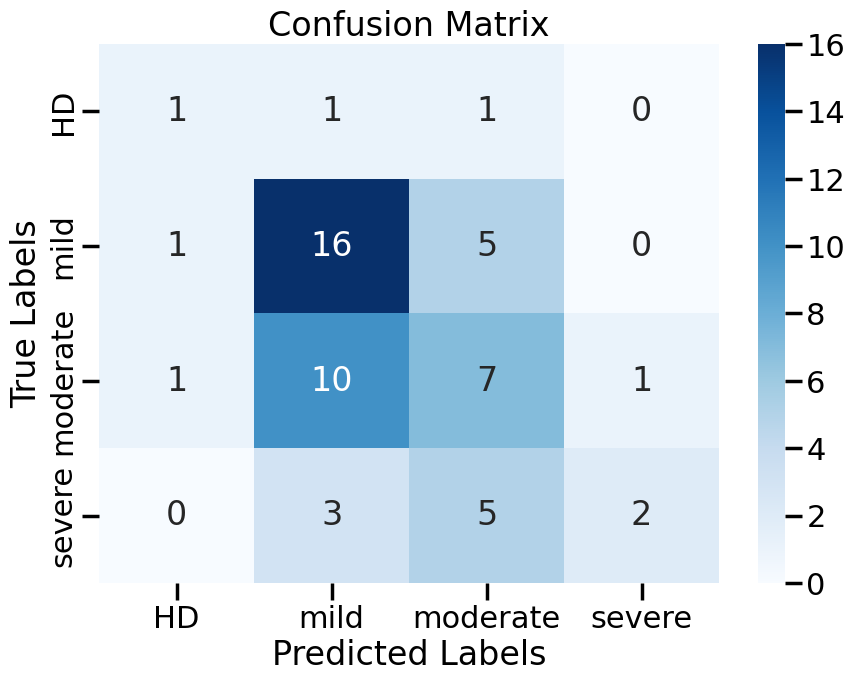

Cross-Validation Accuracy Scores: [0.71428571 0.72857143 0.77142857 0.76811594 0.85507246]
Mean CV Accuracy: 0.7674948240165632


In [174]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Encoding the target variable as it's categorical
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Applying SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Display class distribution after SMOTE
print("After SMOTE, class distribution in training set:")
print(np.bincount(y_train_smote))

# Define the parameter grid for RandomForestClassifier
param_dist = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'n_estimators': [50, 100, 200],
    'class_weight': [None, 'balanced', 'balanced_subsample']
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMOTE-enhanced training data
random_search.fit(X_train_smote, y_train_smote)

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_rf = random_search.best_estimator_
y_pred = best_rf.predict(X_test)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
cv_scores = cross_val_score(best_rf, X_train_smote, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

After SMOTE, class distribution in training set:
[87 87 87 87]
Fitting the RandomForestClassifier model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Model fitting complete.
Best parameters found:  {'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': None, 'class_weight': 'balanced_subsample'}
Best accuracy found:  0.7097701149425287
Classification Report:
              precision    recall  f1-score   support

          HD       0.50      0.33      0.40         3
        mild       0.42      0.50      0.46        22
    moderate       0.33      0.37      0.35        19
      severe       0.60      0.30      0.40        10

    accuracy                           0.41        54
   macro avg       0.46      0.38      0.40        54
weighted avg       0.43      0.41      0.41        54

Accuracy: 0.4074074074074074


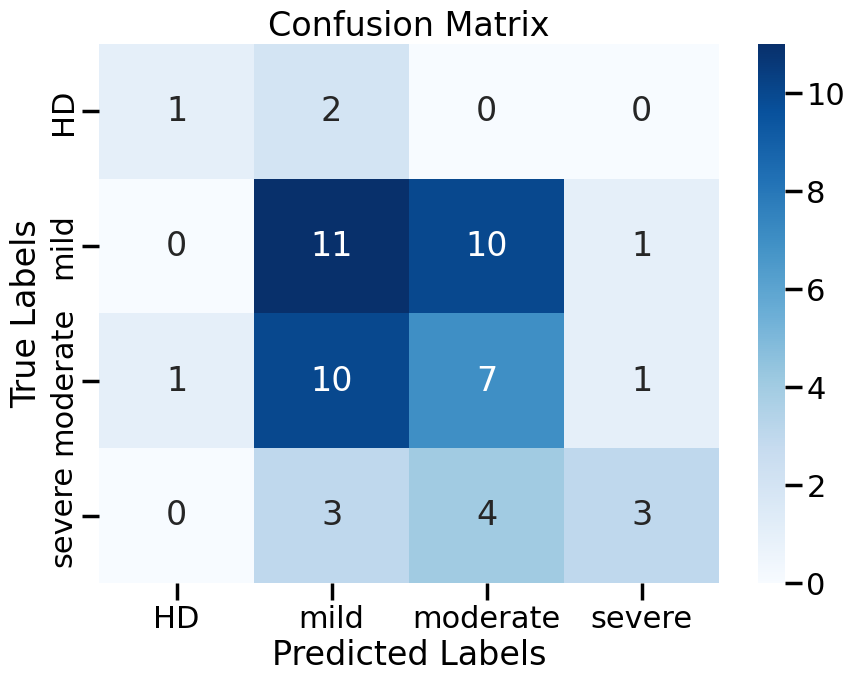

Performing cross-validation on the RandomForestClassifier...
Cross-Validation Accuracy Scores: [0.61428571 0.62857143 0.62857143 0.72463768 0.79710145]
Mean CV Accuracy: 0.6786335403726709


In [252]:
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Encoding the target variable as it's categorical
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Apply standard scaling to the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply PCA to reduce dimensionality
pca = PCA(n_components=0.95)  # Retain 95% of variance
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Apply SMOTE to the PCA-transformed training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_pca, y_train)

# Display class distribution after SMOTE
print("After SMOTE, class distribution in training set:")
print(np.bincount(y_train_smote))

# Define the parameter grid for RandomForestClassifier
param_dist = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'n_estimators': [50, 100, 200],
    'class_weight': [None, 'balanced', 'balanced_subsample']
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMOTE-enhanced training data
print("Fitting the RandomForestClassifier model...")
random_search.fit(X_train_smote, y_train_smote)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_rf = random_search.best_estimator_
y_pred = best_rf.predict(X_test_pca)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
print("Performing cross-validation on the RandomForestClassifier...")
cv_scores = cross_val_score(best_rf, X_train_smote, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

### BalancedRandomForestClassifier

Class distribution in training set:
[13 87 76 39]
Fitting 3 folds for each of 50 candidates, totalling 150 fits


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/util

Best parameters found:  {'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 20, 'class_weight': None}
Best accuracy found:  0.31618414188836724


/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.para

Cross-Validation Accuracy Scores: [0.20930233 0.39534884 0.20930233 0.27906977 0.23255814]
Mean CV Accuracy: 0.2651162790697674


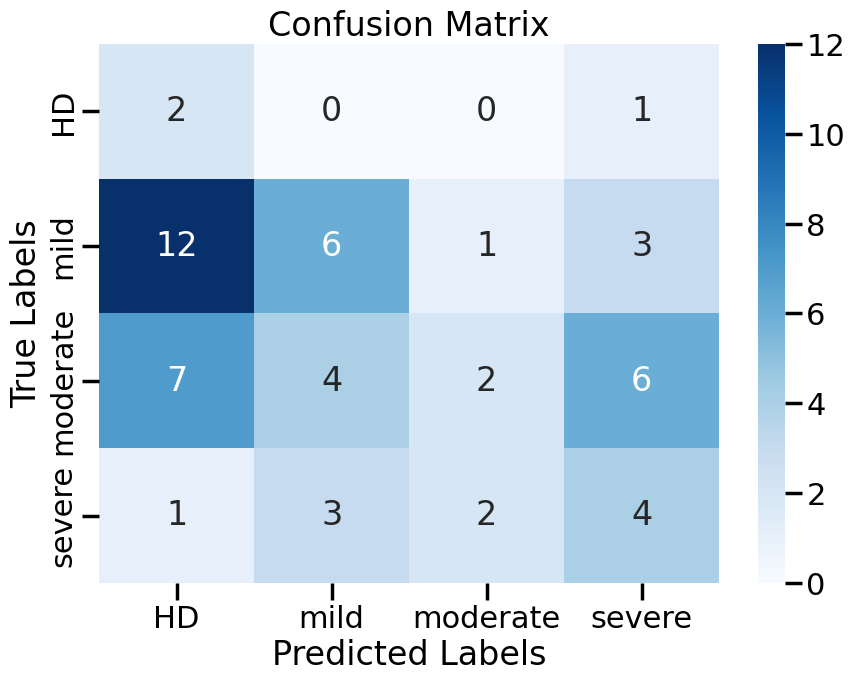

Classification Report:
              precision    recall  f1-score   support

          HD       0.09      0.67      0.16         3
        mild       0.46      0.27      0.34        22
    moderate       0.40      0.11      0.17        19
      severe       0.29      0.40      0.33        10

    accuracy                           0.26        54
   macro avg       0.31      0.36      0.25        54
weighted avg       0.39      0.26      0.27        54

Accuracy: 0.25925925925925924


In [179]:
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Display class distribution in training set
print("Class distribution in training set:")
print(np.bincount(y_train))

# Define the parameter grid for BalancedRandomForestClassifier
param_dist = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'n_estimators': [50, 100, 200],
    'class_weight': [None, 'balanced', 'balanced_subsample']
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=BalancedRandomForestClassifier(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the training data
random_search.fit(X_train, y_train)

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_brf = random_search.best_estimator_
y_pred = best_brf.predict(X_test)

# Perform cross-validation to assess model stability
cv_scores = cross_val_score(best_brf, X_train, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

In [244]:
# Calculate class weights based on the inverse of class frequencies
class_counts = np.bincount(y_train)
total_samples = len(y_train)
class_weights = {i: total_samples / (len(class_counts) * count) for i, count in enumerate(class_counts)}

# Print calculated class weights
print("Class Weights:", class_weights)

Class Weights: {0: 4.886363636363637, 1: 0.6107954545454546, 2: 0.7166666666666667, 3: 1.3109756097560976}


Fitting 3 folds for each of 50 candidates, totalling 150 fits


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/util

Best parameters found:  {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 30, 'class_weight': {0: 4.886363636363637, 1: 0.6107954545454546, 2: 0.7166666666666667, 3: 1.3109756097560976}}
Best accuracy found:  0.3065336463223787


/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.para

Cross-Validation Accuracy Scores: [0.25581395 0.37209302 0.23255814 0.3255814  0.20930233]
Mean CV Accuracy: 0.2790697674418604


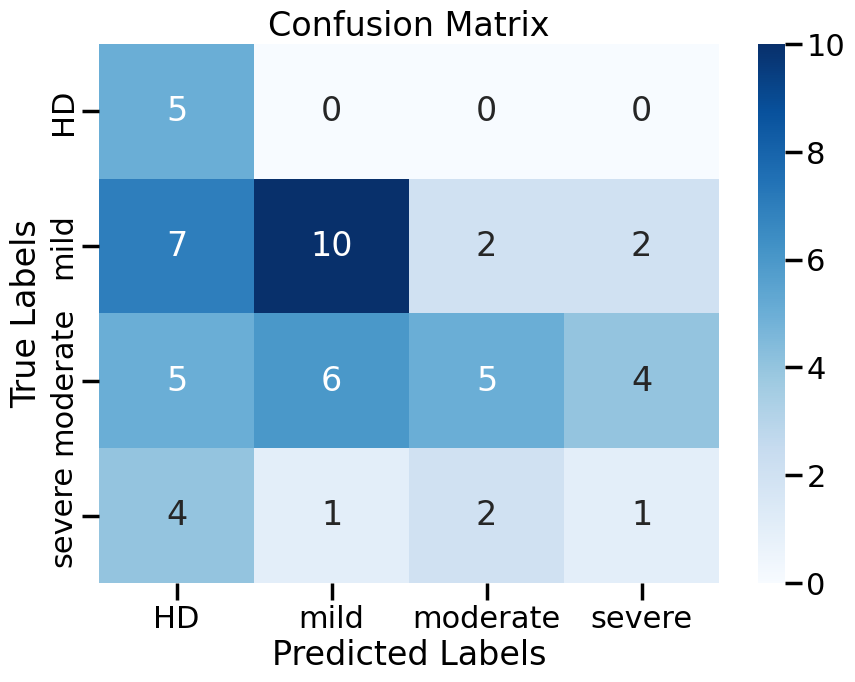

Classification Report:
              precision    recall  f1-score   support

          HD       0.24      1.00      0.38         5
        mild       0.59      0.48      0.53        21
    moderate       0.56      0.25      0.34        20
      severe       0.14      0.12      0.13         8

    accuracy                           0.39        54
   macro avg       0.38      0.46      0.35        54
weighted avg       0.48      0.39      0.39        54

Accuracy: 0.3888888888888889


In [245]:
# Define the parameter grid for BalancedRandomForestClassifier with calculated class weights
param_dist = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'n_estimators': [50, 100, 200],
    'class_weight': [class_weights]  # Use the calculated class weights
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=BalancedRandomForestClassifier(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the training data
random_search.fit(X_train, y_train)

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_brf = random_search.best_estimator_
y_pred = best_brf.predict(X_test)

# Perform cross-validation to assess model stability
cv_scores = cross_val_score(best_brf, X_train, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

### GradientBoostingClassifier

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best parameters found:  {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 5, 'learning_rate': 0.1}
Best accuracy found:  0.4928925404277517
Classification Report:
              precision    recall  f1-score   support

          HD       0.50      0.33      0.40         3
        mild       0.47      0.64      0.54        22
    moderate       0.33      0.32      0.32        19
      severe       0.25      0.10      0.14        10

    accuracy                           0.41        54
   macro avg       0.39      0.35      0.35        54
weighted avg       0.38      0.41      0.38        54

Accuracy: 0.4074074074074074


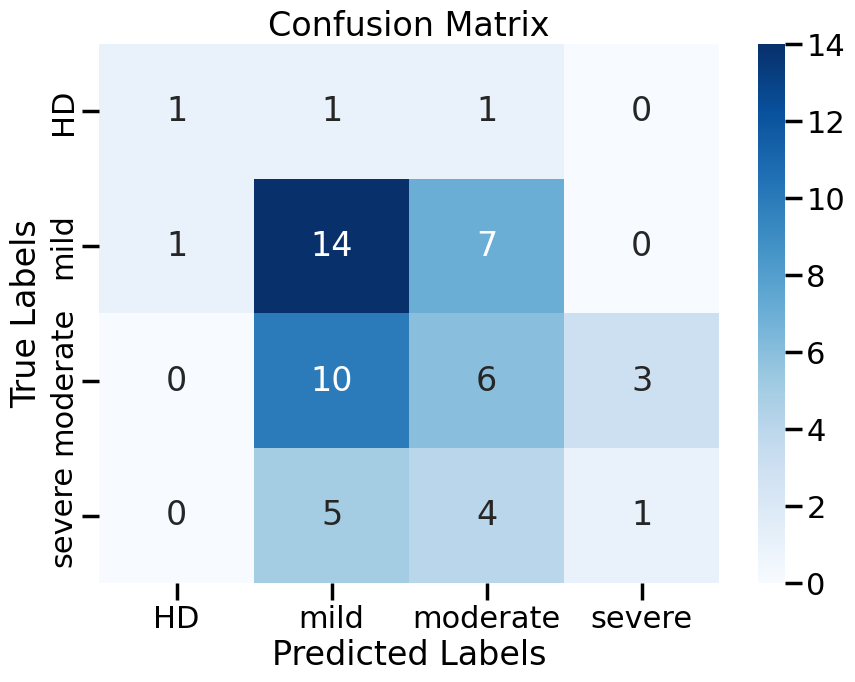

Cross-Validation Accuracy Scores: [0.46511628 0.55813953 0.41860465 0.44186047 0.46511628]
Mean CV Accuracy: 0.46976744186046515


In [177]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Encoding the target variable as it's categorical
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Define the parameter grid for GradientBoostingClassifier
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=GradientBoostingClassifier(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the training data
random_search.fit(X_train, y_train)

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_gbc = random_search.best_estimator_
y_pred = best_gbc.predict(X_test)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
cv_scores = cross_val_score(best_gbc, X_train, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))


Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best parameters found:  {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 3, 'learning_rate': 0.2}
Best accuracy found:  0.46961398017736045
Classification Report:
              precision    recall  f1-score   support

          HD       0.00      0.00      0.00         3
        mild       0.44      0.50      0.47        22
    moderate       0.29      0.32      0.30        19
      severe       0.29      0.20      0.24        10

    accuracy                           0.35        54
   macro avg       0.25      0.25      0.25        54
weighted avg       0.33      0.35      0.34        54

Accuracy: 0.35185185185185186


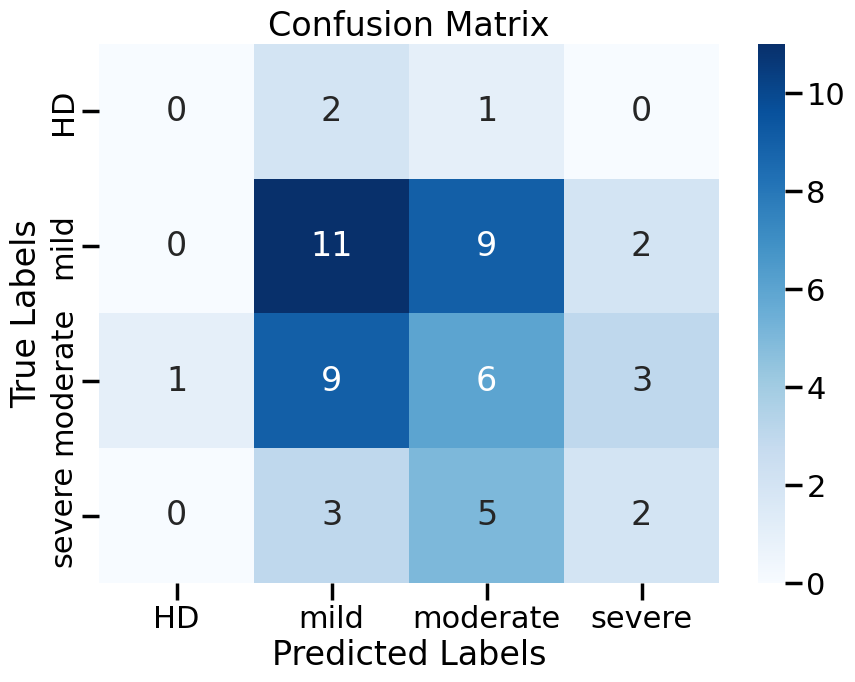

Cross-Validation Accuracy Scores: [0.48837209 0.58139535 0.46511628 0.39534884 0.51162791]
Mean CV Accuracy: 0.4883720930232558


In [247]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_sample_weight

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Encoding the target variable as it's categorical
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Compute sample weights
sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)

# Define the parameter grid for GradientBoostingClassifier
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=GradientBoostingClassifier(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the training data and sample weights
random_search.fit(X_train, y_train, sample_weight=sample_weights)

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_gbc = random_search.best_estimator_
y_pred = best_gbc.predict(X_test)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
cv_scores = cross_val_score(best_gbc, X_train, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))


### KNeighborsClassifier

Fitting the model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Model fitting complete.
Best parameters found:  {'weights': 'distance', 'p': 1, 'n_neighbors': 3, 'algorithm': 'ball_tree'}
Best accuracy found:  0.6436781609195402
Classification Report:
              precision    recall  f1-score   support

          HD       0.25      0.67      0.36         3
        mild       0.43      0.27      0.33        22
    moderate       0.50      0.53      0.51        19
      severe       0.17      0.20      0.18        10

    accuracy                           0.37        54
   macro avg       0.34      0.42      0.35        54
weighted avg       0.40      0.37      0.37        54

Accuracy: 0.37037037037037035


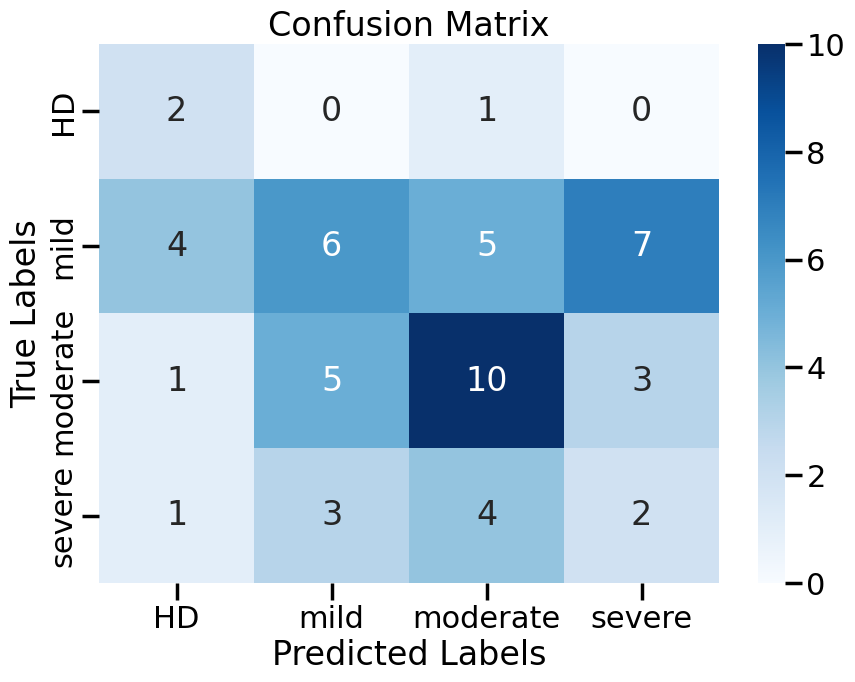

Performing cross-validation...
Cross-Validation Accuracy Scores: [0.61428571 0.61428571 0.72857143 0.66666667 0.72463768]
Mean CV Accuracy: 0.6696894409937888


In [178]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Define the parameter grid for KNeighborsClassifier
param_dist = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2]  # 1 for Manhattan, 2 for Euclidean
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=KNeighborsClassifier(),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMOTE-enhanced training data
print("Fitting the model...")
random_search.fit(X_train_smote, y_train_smote)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_knn = random_search.best_estimator_
y_pred = best_knn.predict(X_test)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
print("Performing cross-validation...")
cv_scores = cross_val_score(best_knn, X_train_smote, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))


Fitting the KNN model with RandomizedSearchCV...
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Model fitting complete.
Best parameters found:  {'weights': 'distance', 'p': 1, 'n_neighbors': 3, 'algorithm': 'ball_tree'}
Best accuracy found:  0.6551724137931034
Classification Report (KNN):
              precision    recall  f1-score   support

          HD       0.17      0.33      0.22         3
        mild       0.53      0.36      0.43        22
    moderate       0.47      0.47      0.47        19
      severe       0.36      0.50      0.42        10

    accuracy                           0.43        54
   macro avg       0.38      0.42      0.39        54
weighted avg       0.46      0.43      0.43        54

Accuracy (KNN): 0.42592592592592593


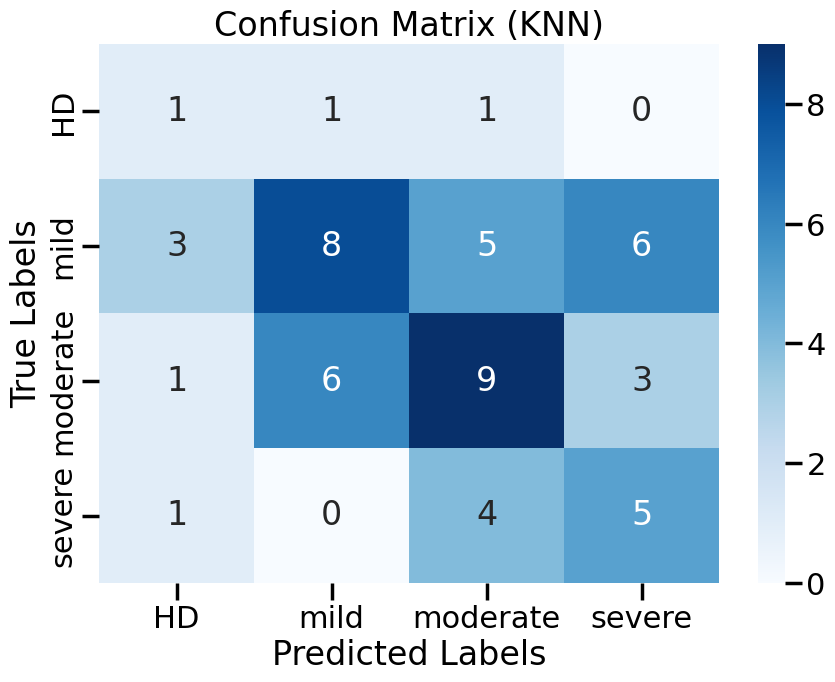

Fitting the stacking model...
Stacking model fitting complete.
Classification Report (Stacking Classifier):
              precision    recall  f1-score   support

          HD       1.00      0.33      0.50         3
        mild       0.54      0.64      0.58        22
    moderate       0.45      0.53      0.49        19
      severe       0.60      0.30      0.40        10

    accuracy                           0.52        54
   macro avg       0.65      0.45      0.49        54
weighted avg       0.55      0.52      0.51        54

Accuracy (Stacking Classifier): 0.5185185185185185


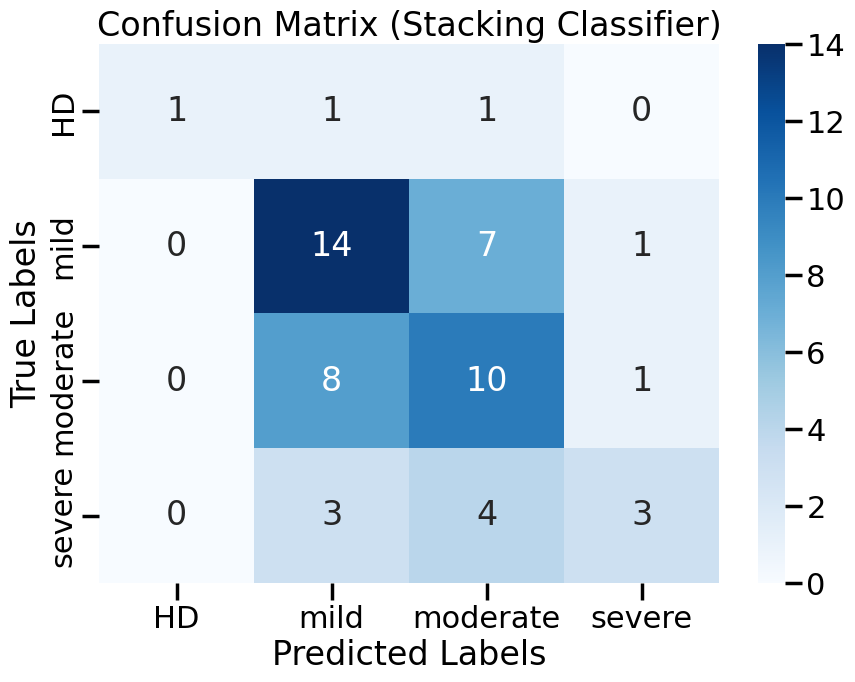

Classification Report (KNN with PCA):
              precision    recall  f1-score   support

          HD       0.22      0.67      0.33         3
        mild       0.77      0.45      0.57        22
    moderate       0.59      0.53      0.56        19
      severe       0.47      0.70      0.56        10

    accuracy                           0.54        54
   macro avg       0.51      0.59      0.51        54
weighted avg       0.62      0.54      0.55        54

Accuracy (KNN with PCA): 0.5370370370370371


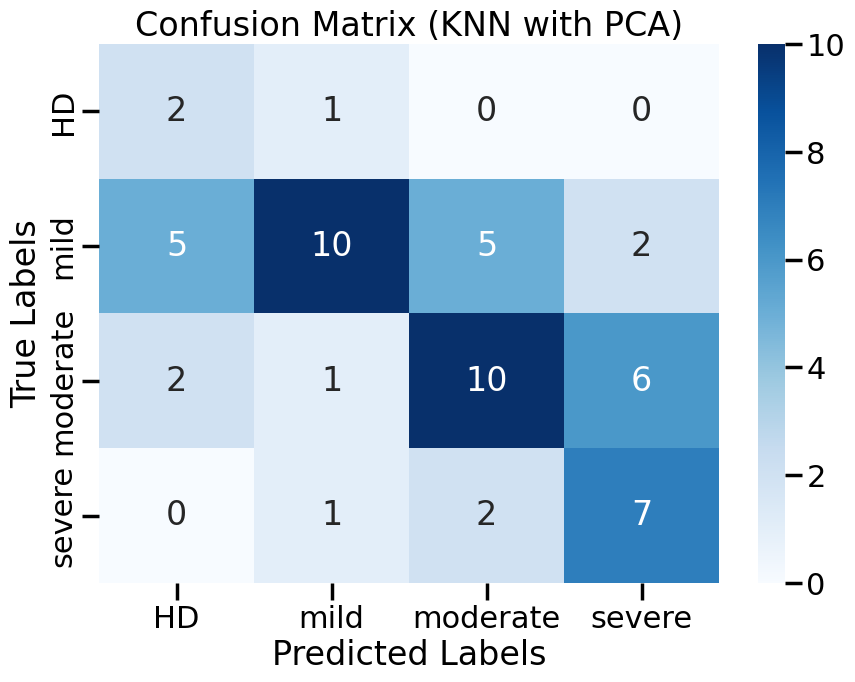

Performing cross-validation on the KNN model...
Cross-Validation Accuracy Scores (KNN): [0.67142857 0.52857143 0.71428571 0.71014493 0.76811594]
Mean CV Accuracy (KNN): 0.6785093167701863
Performing cross-validation on the stacking classifier...
Cross-Validation Accuracy Scores (Stacking Classifier): [0.7        0.7        0.8        0.75362319 0.84057971]
Mean CV Accuracy (Stacking Classifier): 0.758840579710145
Performing cross-validation on KNN with PCA...
Cross-Validation Accuracy Scores (KNN with PCA): [0.64285714 0.62857143 0.7        0.69565217 0.7826087 ]
Mean CV Accuracy (KNN with PCA): 0.6899378881987577


In [248]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Encoding the target variable as it's categorical
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Apply standard scaling to the features
scaler = StandardScaler()
X_train_smote_scaled = scaler.fit_transform(X_train_smote)
X_test_scaled = scaler.transform(X_test)

# Apply PCA to reduce dimensionality
pca = PCA(n_components=0.95)  # Retain 95% of variance
X_train_pca = pca.fit_transform(X_train_smote_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Define the parameter grid for KNeighborsClassifier
param_dist = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2]  # 1 for Manhattan, 2 for Euclidean
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=KNeighborsClassifier(),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMOTE-enhanced training data
print("Fitting the KNN model with RandomizedSearchCV...")
random_search.fit(X_train_smote_scaled, y_train_smote)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_knn = random_search.best_estimator_
y_pred_knn = best_knn.predict(X_test_scaled)

# Evaluation metrics for KNN
print("Classification Report (KNN):")
print(classification_report(y_test, y_pred_knn, target_names=encoder.classes_))
print("Accuracy (KNN):", accuracy_score(y_test, y_pred_knn))

# Display the confusion matrix for KNN
cm_knn = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix (KNN)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Initialize the Stacking Classifier with KNN and RandomForest
base_models = [
    ('knn', KNeighborsClassifier(weights='distance', p=1, n_neighbors=3, algorithm='ball_tree')),
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42))
]
meta_model = LogisticRegression()

stacking_clf = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=5)

# Fit the Stacking Classifier using the SMOTE-enhanced and scaled training data
print("Fitting the stacking model...")
stacking_clf.fit(X_train_smote_scaled, y_train_smote)
print("Stacking model fitting complete.")

# Predict on the test data using the stacking model
y_pred_stacking = stacking_clf.predict(X_test_scaled)

# Evaluation metrics for Stacking Classifier
print("Classification Report (Stacking Classifier):")
print(classification_report(y_test, y_pred_stacking, target_names=encoder.classes_))
print("Accuracy (Stacking Classifier):", accuracy_score(y_test, y_pred_stacking))

# Display the confusion matrix for Stacking Classifier
cm_stacking = confusion_matrix(y_test, y_pred_stacking)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_stacking, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix (Stacking Classifier)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Initialize and fit KNN with PCA
knn_pca = KNeighborsClassifier(weights='distance', p=1, n_neighbors=3, algorithm='ball_tree')
knn_pca.fit(X_train_pca, y_train_smote)
y_pred_pca = knn_pca.predict(X_test_pca)

# Evaluation metrics for KNN with PCA
print("Classification Report (KNN with PCA):")
print(classification_report(y_test, y_pred_pca, target_names=encoder.classes_))
print("Accuracy (KNN with PCA):", accuracy_score(y_test, y_pred_pca))

# Display the confusion matrix for KNN with PCA
cm_pca = confusion_matrix(y_test, y_pred_pca)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_pca, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix (KNN with PCA)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability for KNN
print("Performing cross-validation on the KNN model...")
cv_scores_knn = cross_val_score(best_knn, X_train_smote_scaled, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores (KNN):", cv_scores_knn)
print("Mean CV Accuracy (KNN):", np.mean(cv_scores_knn))

# Perform cross-validation to assess model stability for Stacking Classifier
print("Performing cross-validation on the stacking classifier...")
cv_scores_stacking = cross_val_score(stacking_clf, X_train_smote_scaled, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores (Stacking Classifier):", cv_scores_stacking)
print("Mean CV Accuracy (Stacking Classifier):", np.mean(cv_scores_stacking))

# Perform cross-validation to assess model stability for KNN with PCA
print("Performing cross-validation on KNN with PCA...")
cv_scores_pca = cross_val_score(knn_pca, X_train_pca, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores (KNN with PCA):", cv_scores_pca)
print("Mean CV Accuracy (KNN with PCA):", np.mean(cv_scores_pca))


### StackingClassifier

Cross-validation scores: [0.56338028 0.69014085 0.65714286 0.7        0.8       ]
Mean cross-validation score: 0.6821327967806841
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.48      0.71      0.58        21
           2       0.61      0.55      0.58        20
           3       0.20      0.12      0.15         8

    accuracy                           0.50        54
   macro avg       0.32      0.35      0.33        54
weighted avg       0.44      0.50      0.46        54

Accuracy: 0.5


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


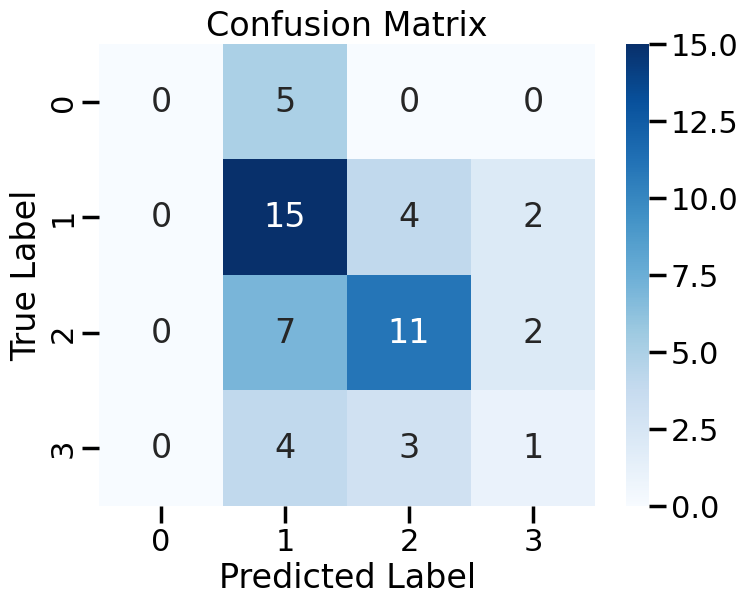

In [122]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define base models
base_models = [
    ('rf', RandomForestClassifier(random_state=42, class_weight='balanced')),
    ('gb', GradientBoostingClassifier(random_state=42))
]

# Define meta-model
meta_model = LogisticRegression()

# Initialize StackingClassifier
stacking_clf = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=3)

# Fit the StackingClassifier
stacking_clf.fit(X_train_smote, y_train_smote)

# Cross-validation scores
cv_scores = cross_val_score(stacking_clf, X_train_smote, y_train_smote, cv=5)
print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())

# Predict on the test data
y_pred = stacking_clf.predict(X_test)

# Classification report and accuracy score
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

### XGBoost

Fitting the model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:37:41] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:37:52] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:37:55] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:37:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:38:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weigh

Model fitting complete.
Best parameters found:  {'subsample': 0.8, 'scale_pos_weight': 0.14942528735632185, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 10, 'learning_rate': 0.2, 'colsample_bytree': 0.6}
Best accuracy found:  0.4558555033907146
Classification Report:
              precision    recall  f1-score   support

          HD       1.00      0.33      0.50         3
        mild       0.59      0.86      0.70        22
    moderate       0.39      0.37      0.38        19
      severe       0.67      0.20      0.31        10

    accuracy                           0.54        54
   macro avg       0.66      0.44      0.47        54
weighted avg       0.56      0.54      0.50        54

Accuracy: 0.5370370370370371


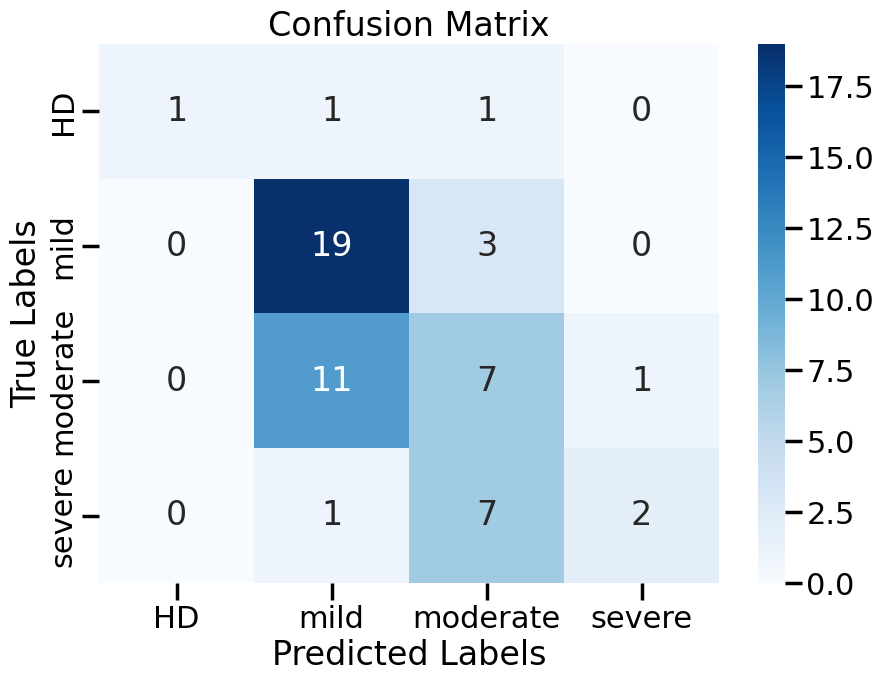

Performing cross-validation...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:43:55] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:43:57] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:43:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:44:01] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [22:44:03] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weigh

Cross-Validation Accuracy Scores: [0.53488372 0.58139535 0.37209302 0.41860465 0.51162791]
Mean CV Accuracy: 0.48372093023255813


In [180]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Encoding the target variable as it's categorical
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Calculate the scale_pos_weight for handling class imbalance
classes, counts = np.unique(y_train, return_counts=True)
scale_pos_weight = counts[0] / counts[1]

# Define the parameter grid for XGBClassifier
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'scale_pos_weight': [scale_pos_weight]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=XGBClassifier(random_state=42, objective='binary:logistic'),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the training data
print("Fitting the model...")
random_search.fit(X_train, y_train)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_xgb = random_search.best_estimator_
y_pred = best_xgb.predict(X_test)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
print("Performing cross-validation...")
cv_scores = cross_val_score(best_xgb, X_train, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))


#### XGBoost with SMOTE

Fitting the model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Model fitting complete.
Best parameters found:  {'subsample': 0.8, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 10, 'learning_rate': 0.2, 'colsample_bytree': 0.6}
Best accuracy found:  0.7097701149425287
Classification Report:
              precision    recall  f1-score   support

          HD       0.20      0.33      0.25         3
        mild       0.50      0.55      0.52        22
    moderate       0.42      0.42      0.42        19
      severe       0.50      0.30      0.37        10

    accuracy                           0.44        54
   macro avg       0.41      0.40      0.39        54
weighted avg       0.46      0.44      0.44        54

Accuracy: 0.4444444444444444


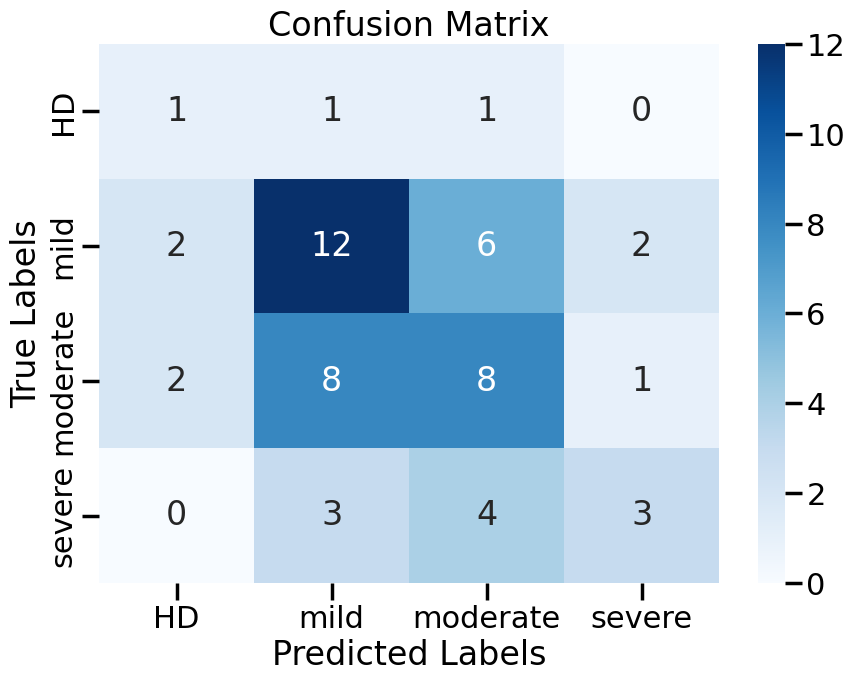

Performing cross-validation...
Cross-Validation Accuracy Scores: [0.68571429 0.64285714 0.7        0.72463768 0.7826087 ]
Mean CV Accuracy: 0.7071635610766045


In [181]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Encoding the target variable as it's categorical
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Define the parameter grid for XGBClassifier
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=XGBClassifier(random_state=42, objective='binary:logistic'),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMOTE-enhanced training data
print("Fitting the model...")
random_search.fit(X_train_smote, y_train_smote)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_xgb = random_search.best_estimator_
y_pred = best_xgb.predict(X_test)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
print("Performing cross-validation...")
cv_scores = cross_val_score(best_xgb, X_train_smote, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

#### Using Class Weights

In [ ]:
from sklearn.preprocessing import LabelBinarizer

# Dropping the 'patient_id' column along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Use LabelBinarizer for multi-label binarization
lb = LabelBinarizer()
y_binarized = lb.fit_transform(y)

# Create a DataFrame for the binary labels
y_binarized_df = pd.DataFrame(y_binarized, columns=[f"class_{cls}" for cls in lb.classes_])

# Merge the binary labels with the original features
beta_features_binary = pd.concat([X.reset_index(drop=True), y_binarized_df.reset_index(drop=True)], axis=1)

# Display the first few rows of the resulting DataFrame
print(beta_features_binary.head())

# Convert feature names to strings
X.columns = X.columns.map(str)

Fitting the model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:16:54] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:16:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:17:05] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:17:09] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:17:12] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weigh

Model fitting complete.
Best parameters found:  {'subsample': 0.6, 'scale_pos_weight': 0.14942528735632185, 'n_estimators': 200, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.01, 'colsample_bytree': 0.6}
Best accuracy found:  0.42794731351069376
Classification Report:
              precision    recall  f1-score   support

          HD       0.00      0.00      0.00         3
        mild       0.50      0.68      0.58        22
    moderate       0.42      0.42      0.42        19
      severe       0.50      0.20      0.29        10

    accuracy                           0.46        54
   macro avg       0.36      0.33      0.32        54
weighted avg       0.44      0.46      0.44        54

Accuracy: 0.46296296296296297


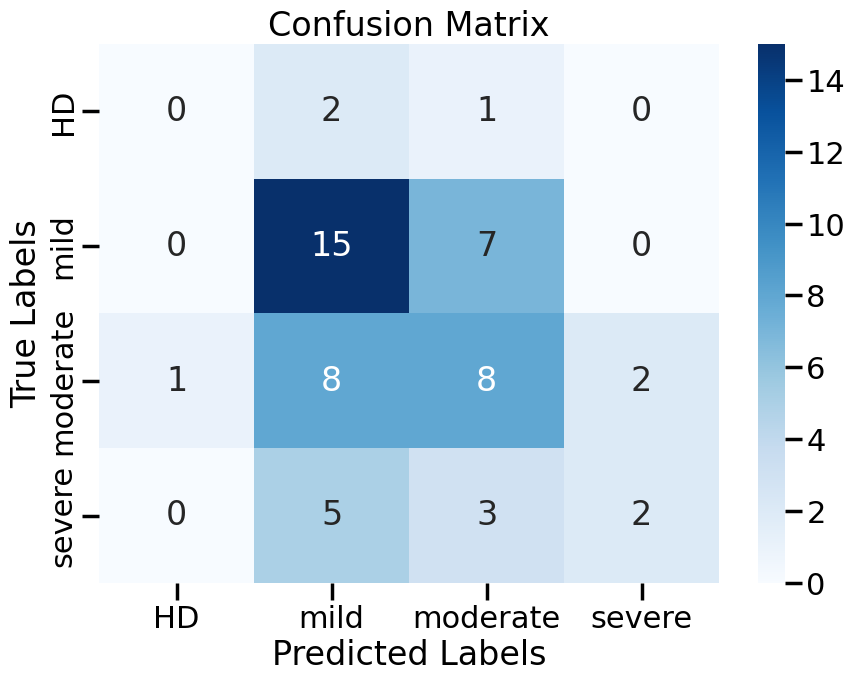

Performing cross-validation...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:19:49] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:19:56] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:19:59] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:20:02] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [02:20:09] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weigh

Cross-Validation Accuracy Scores: [0.41860465 0.53488372 0.37209302 0.34883721 0.39534884]
Mean CV Accuracy: 0.41395348837209295


In [253]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Encoding the target variable as it's categorical
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# Apply standard scaling to the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply PCA to reduce dimensionality
pca = PCA(n_components=0.95)  # Retain 95% of variance
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Calculate the scale_pos_weight for handling class imbalance
classes, counts = np.unique(y_train, return_counts=True)
scale_pos_weight = counts[0] / counts[1]

# Define the parameter grid for XGBClassifier
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'scale_pos_weight': [scale_pos_weight]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=XGBClassifier(random_state=42, objective='multi:softmax'),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the PCA-transformed training data
print("Fitting the model...")
random_search.fit(X_train_pca, y_train)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_xgb = random_search.best_estimator_
y_pred = best_xgb.predict(X_test_pca)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
print("Performing cross-validation...")
cv_scores = cross_val_score(best_xgb, X_train_pca, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

### Multi-label classification problem

In [188]:
from sklearn.preprocessing import LabelBinarizer

# Dropping the 'patient_id' column along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Use LabelBinarizer for multi-label binarization
lb = LabelBinarizer()
y_binarized = lb.fit_transform(y)

# Create a DataFrame for the binary labels
y_binarized_df = pd.DataFrame(y_binarized, columns=[f"class_{cls}" for cls in lb.classes_])

# Merge the binary labels with the original features
beta_features_binary = pd.concat([X.reset_index(drop=True), y_binarized_df.reset_index(drop=True)], axis=1)

# Display the first few rows of the resulting DataFrame
print(beta_features_binary.head())

# Convert feature names to strings
X.columns = X.columns.map(str)

   (degree_centrality, 0)  (degree_centrality, 1)  (degree_centrality, 2)  \
0                0.105263                0.000000                0.000000   
1                0.098039                0.000000                0.000000   
2                0.118421                0.000000                0.052632   
3                0.144444                0.044444                0.000000   
4                0.119658                0.000000                0.000000   

   (degree_centrality, 3)  (degree_centrality, 4)  (degree_centrality, 5)  \
0                0.000000                0.000000                     0.0   
1                0.000000                0.000000                     0.0   
2                0.000000                0.039474                     0.0   
3                0.022222                0.033333                     0.0   
4                0.000000                0.059829                     0.0   

   (degree_centrality, 6)  (degree_centrality, 7)  (degree_centrality, 8) 

   (degree_centrality, 0)  (degree_centrality, 1)  (degree_centrality, 2)  \
0                0.105263                0.000000                0.000000   
1                0.098039                0.000000                0.000000   
2                0.118421                0.000000                0.052632   
3                0.144444                0.044444                0.000000   
4                0.119658                0.000000                0.000000   

   (degree_centrality, 3)  (degree_centrality, 4)  (degree_centrality, 5)  \
0                0.000000                0.000000                     0.0   
1                0.000000                0.000000                     0.0   
2                0.000000                0.039474                     0.0   
3                0.022222                0.033333                     0.0   
4                0.000000                0.059829                     0.0   

   (degree_centrality, 6)  (degree_centrality, 7)  (degree_centrality, 8) 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


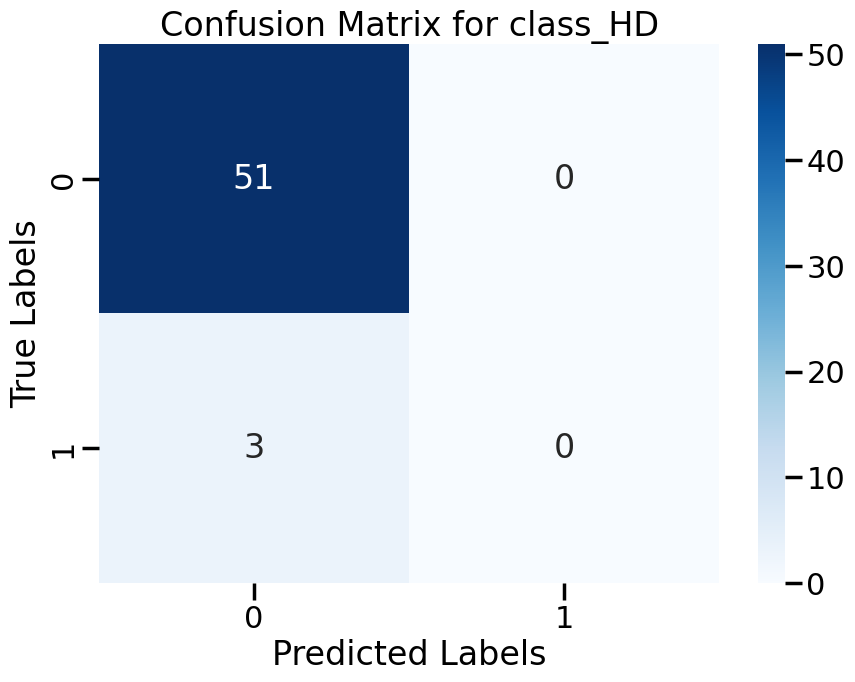

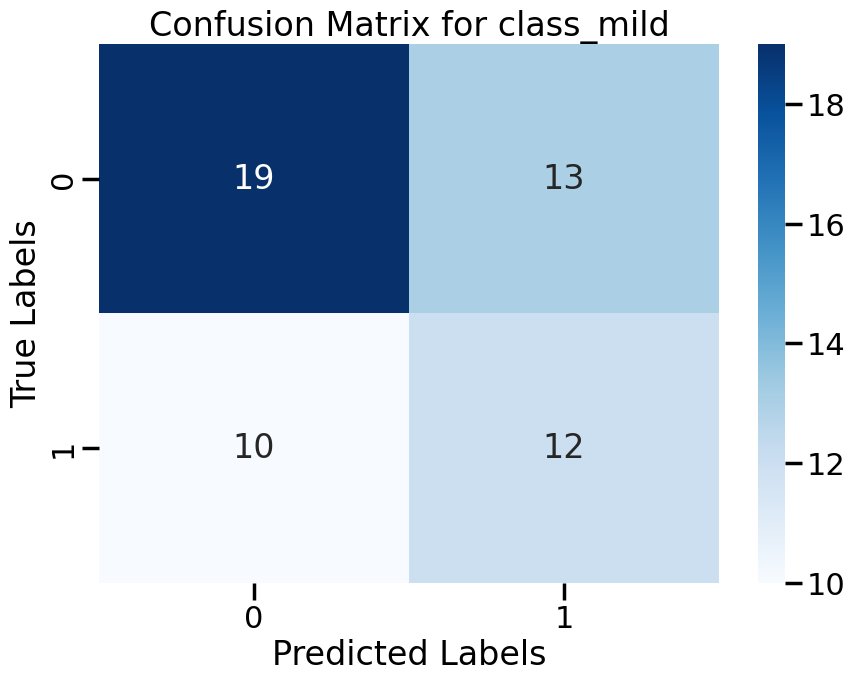

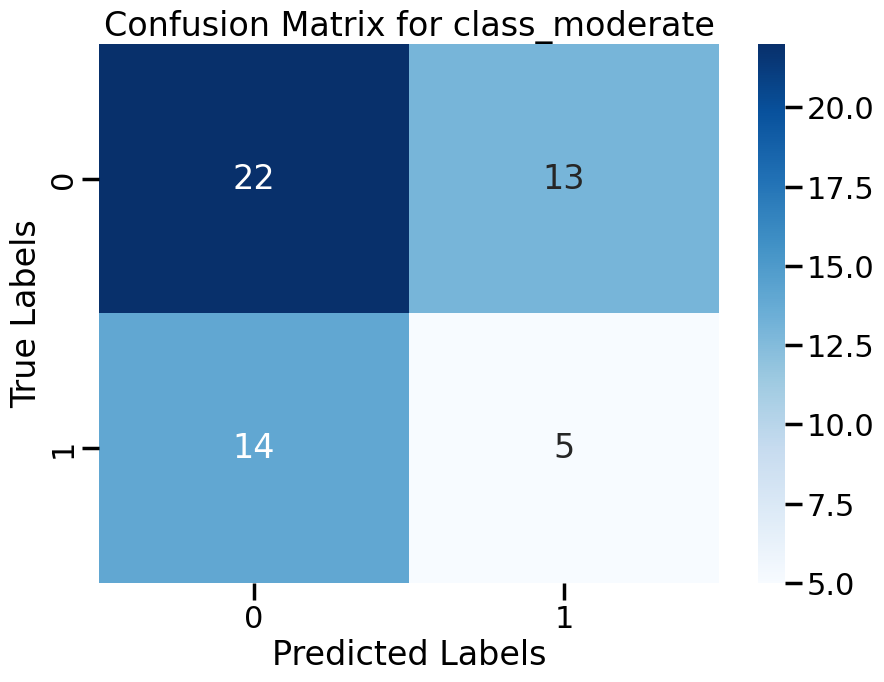

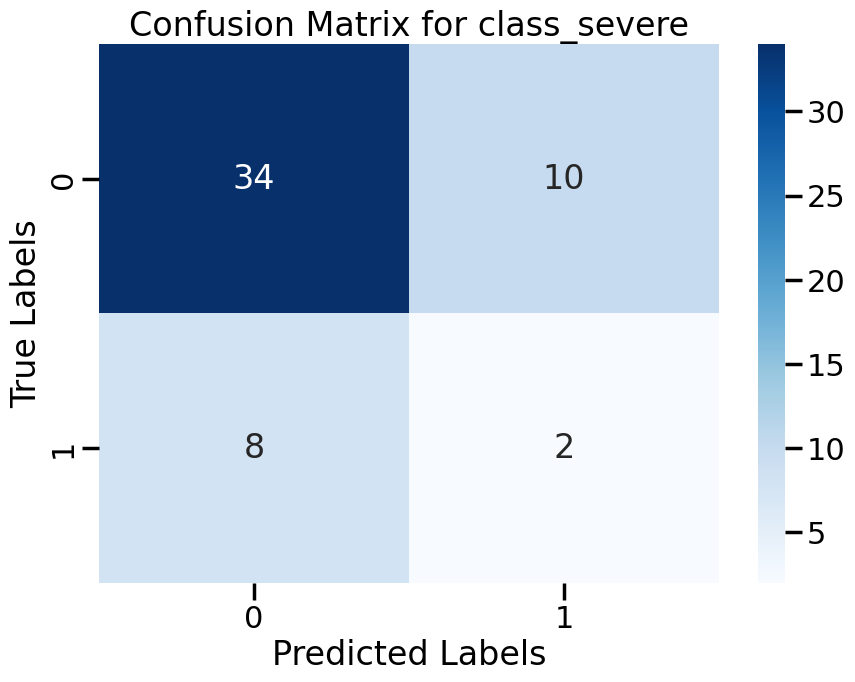

Performing cross-validation...
Cross-Validation Accuracy Scores: [0.37209302 0.34883721 0.3255814  0.20930233 0.34883721]
Mean CV Accuracy: 0.3209302325581395


In [251]:
from sklearn.preprocessing import LabelBinarizer, StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Use LabelBinarizer for multi-label binarization
lb = LabelBinarizer()
y_binarized = lb.fit_transform(y)

# Create a DataFrame for the binary labels
y_binarized_df = pd.DataFrame(y_binarized, columns=[f"class_{cls}" for cls in lb.classes_])

# Merge the binary labels with the original features
beta_features_binary = pd.concat([X.reset_index(drop=True), y_binarized_df.reset_index(drop=True)], axis=1)

# Display the first few rows of the resulting DataFrame
print(beta_features_binary.head())

# Ensure all column names are strings
beta_features_binary.columns = beta_features_binary.columns.map(str)

# Prepare features and labels for training
X = beta_features_binary.drop([f"class_{cls}" for cls in lb.classes_], axis=1)
y = beta_features_binary[[f"class_{cls}" for cls in lb.classes_]]

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Define the parameter grid for SVC
param_grid = {
    'estimator__C': [0.1, 1, 10, 100],
    'estimator__gamma': [1, 0.1, 0.01, 0.001],
    'estimator__kernel': ['linear', 'rbf', 'poly', 'sigmoid']
}

# Initialize OneVsRestClassifier with SVC
svc = SVC(random_state=42, probability=True)
classifier = OneVsRestClassifier(svc)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=classifier,
                           param_grid=param_grid,
                           cv=3,  # Number of cross-validation folds
                           scoring='accuracy',
                           verbose=1,
                           n_jobs=-1)  # Use all available cores

# Fit GridSearchCV using the training data
print("Fitting the model...")
grid_search.fit(X_train, y_train)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", grid_search.best_params_)
print("Best accuracy found: ", grid_search.best_score_)

# Predict on the test data using the best model
best_svc = grid_search.best_estimator_
y_pred = best_svc.predict(X_test)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=y.columns))

# Display the confusion matrix for each class
for i, class_label in enumerate(y.columns):
    cm = confusion_matrix(y_test.iloc[:, i], y_pred[:, i])
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {class_label}')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

# Perform cross-validation to assess model stability
print("Performing cross-validation...")
cv_scores = cross_val_score(best_svc, X_train, y_train, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

In [206]:
import numpy as np

# Define class distribution
class_counts = {
    'mild': 109,
    'moderate': 95,
    'severe': 49,
    'HD': 16
}

# Total number of samples
total_samples = sum(class_counts.values())

# Calculate base weights inversely proportional to class frequencies
base_weights = {cls: total_samples / count for cls, count in class_counts.items()}

# Manually adjust weights to emphasize HD and severe classes
adjustment_factor_hd = 3  # Example adjustment factor for HD class
adjustment_factor_severe = 2  # Example adjustment factor for severe class
custom_weights = {
    'mild': base_weights['mild'],
    'moderate': base_weights['moderate'],
    'severe': base_weights['severe'] * adjustment_factor_severe,
    'HD': base_weights['HD'] * adjustment_factor_hd
}

# Normalize weights to ensure sum equals number of classes
weight_sum = sum(custom_weights.values())
normalized_weights = {cls: weight / weight_sum for cls, weight in custom_weights.items()}

# Convert to class weight format for sklearn
class_weight_dict = {idx: weight for idx, weight in enumerate(normalized_weights.values())}
print("Custom Class Weights:", class_weight_dict)

Custom Class Weights: {0: 0.03699066442643363, 1: 0.0424419202366449, 2: 0.16457071112168428, 3: 0.7559967042152372}


Custom Class Weights: {0: 0.03699066442643363, 1: 0.0424419202366449, 2: 0.16457071112168428, 3: 0.7559967042152372}
Fitting the model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [01:06:42] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [01:06:43] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [01:06:44] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [01:06:45] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [01:06:51] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weigh

Model fitting complete.
Classification Report:
              precision    recall  f1-score   support

          HD       0.20      0.33      0.25         3
        mild       0.50      0.55      0.52        22
    moderate       0.42      0.42      0.42        19
      severe       0.50      0.30      0.37        10

    accuracy                           0.44        54
   macro avg       0.41      0.40      0.39        54
weighted avg       0.46      0.44      0.44        54

Accuracy: 0.4444444444444444


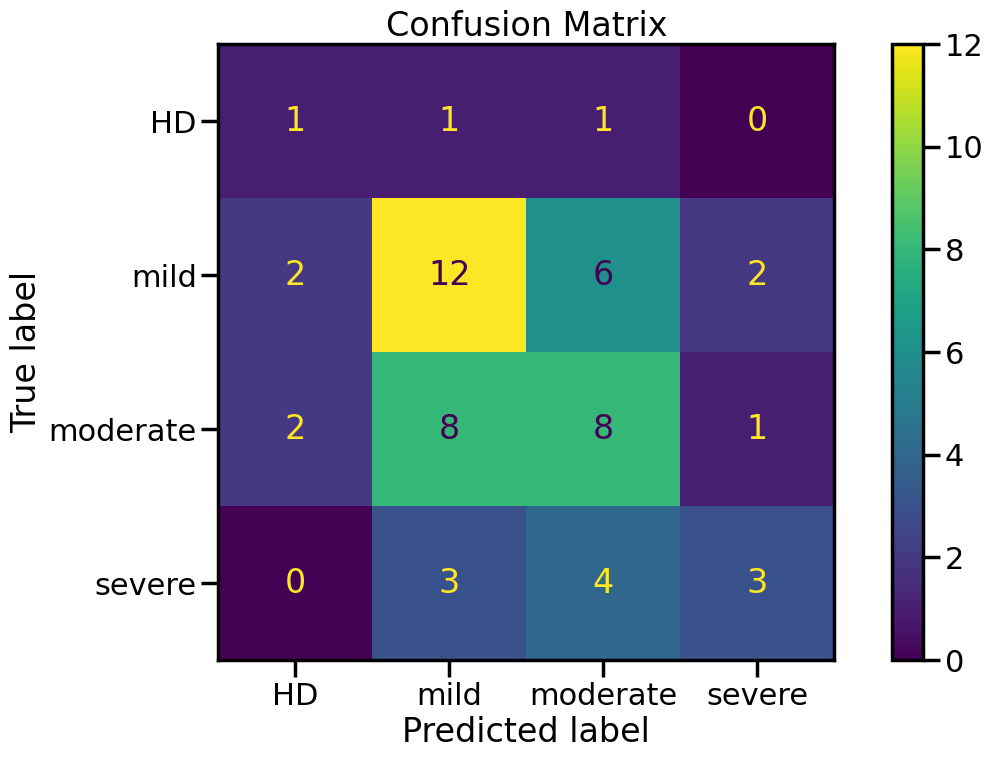

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [01:15:13] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [01:15:15] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [01:15:17] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)


Cross-validation Accuracy: 0.71


In [207]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from joblib import dump
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Prepare the data (similar steps as before)
# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in beta_features.columns:
    X = beta_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = beta_features.drop(['patient_id', 'd_cond'], axis=1)

# Setting the target variable
y = beta_features['d_cond']

# Encode target labels with value between 0 and n_classes-1
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Standardize the features
scaler = StandardScaler()
X_train_smote = scaler.fit_transform(X_train_smote)
X_test = scaler.transform(X_test)

# Calculate custom class weights
class_counts = {'mild': 109, 'moderate': 95, 'severe': 49, 'HD': 16}
total_samples = sum(class_counts.values())
base_weights = {cls: total_samples / count for cls, count in class_counts.items()}
adjustment_factor_hd = 3
adjustment_factor_severe = 2
custom_weights = {cls: base_weights[cls] for cls in base_weights}
custom_weights['HD'] *= adjustment_factor_hd
custom_weights['severe'] *= adjustment_factor_severe
weight_sum = sum(custom_weights.values())
normalized_weights = {cls: weight / weight_sum for cls, weight in custom_weights.items()}
class_weight_dict = {idx: weight for idx, weight in enumerate(normalized_weights.values())}
print("Custom Class Weights:", class_weight_dict)

# Initialize XGBoost with default settings
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss', scale_pos_weight=class_weight_dict)

# Define the parameter grid for RandomizedSearchCV
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=xgb_model, param_distributions=param_dist, n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the training data
print("Fitting the model...")
random_search.fit(X_train_smote, y_train_smote)
print("Model fitting complete.")

# Get the best estimator
best_classifier = random_search.best_estimator_

# Predict on the test data using the best classifier
y_pred = best_classifier.predict(X_test)

# Evaluation metrics
report = classification_report(y_test, y_pred, target_names=encoder.classes_, zero_division=0)
accuracy = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)

# Display results
print("Classification Report:")
print(report)
print(f"Accuracy: {accuracy}")
ConfusionMatrixDisplay(cm, display_labels=encoder.classes_).plot()
plt.title('Confusion Matrix')
plt.show()

# Cross-validation for model evaluation
cross_val_score_result = cross_val_score(best_classifier, X_train_smote, y_train_smote, cv=3)
cross_val_mean = np.mean(cross_val_score_result)
print(f"Cross-validation Accuracy: {cross_val_mean:.2f}")



## TCR beta and TCR alpha

In [254]:
# Merge the DataFrames on 'patient_id'
merged_features = pd.merge(alpha_features, beta_features, on='patient_id')

# Display the merged DataFrame
print("Merged Features DataFrame:")
merged_features.head()

Merged Features DataFrame:


,patient_id,degree_centrality_0,degree_centrality_1,degree_centrality_2,degree_centrality_3,degree_centrality_4,degree_centrality_5,degree_centrality_6,degree_centrality_7,degree_centrality_8,...,"(closeness_centrality, 230)","(closeness_centrality, 231)","(closeness_centrality, 232)","(closeness_centrality, 233)","(closeness_centrality, 234)","(closeness_centrality, 235)","(closeness_centrality, 236)","(closeness_centrality, 237)","(closeness_centrality, 238)",d_cond_y
0,100_1,0.204082,0.00,0.00,0.0,0.0,0.132653,0.0,0.0,0.0,...,0.0,0.0,0.553398,0.000000,0.000000,0.0,0.0,0.000000,0.257919,mild
1,100_2,0.190000,0.04,0.00,0.0,0.0,0.100000,0.0,0.0,0.0,...,0.0,0.0,0.545455,0.000000,0.000000,0.0,0.0,0.000000,0.272000,mild
2,101_1,0.171429,0.00,0.00,0.0,0.0,0.135714,0.0,0.0,0.0,...,0.0,0.0,0.562963,0.394805,0.000000,0.0,0.0,0.000000,0.274368,mild
3,101_2,0.256410,0.00,0.00,0.0,0.0,0.128205,0.0,0.0,0.0,...,0.0,0.0,0.526316,0.000000,0.000000,0.0,0.0,0.000000,0.261628,mild
4,102_1,0.200000,0.00,0.04,0.0,0.0,0.170000,0.0,0.0,0.0,...,0.0,0.0,0.554502,0.000000,0.373802,0.0,0.0,0.413428,0.272093,mild


In [255]:
# Inspect columns that contain non-numeric data
non_numeric_columns = merged_features.select_dtypes(exclude=[np.number]).columns

print("Columns containing non-numeric data:")
print(non_numeric_columns)

Columns containing non-numeric data:
Index(['patient_id', 'd_cond_x', ('patient_id', ''), 'd_cond_y'], dtype='object')


In [256]:
# Rename 'd_cond_x' to 'd_cond'
merged_features = merged_features.rename(columns={'d_cond_x': 'd_cond'})

# Drop 'd_cond_y' if it exists
if 'd_cond_y' in merged_features.columns:
    merged_features = merged_features.drop(columns=['d_cond_y'])

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in merged_features.columns:
    X = merged_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = merged_features.drop(['patient_id', 'd_cond'], axis=1)

# Inspect columns that contain non-numeric data
non_numeric_columns = X.select_dtypes(exclude=[np.number]).columns

print("Columns containing non-numeric data:")
print(non_numeric_columns)

# Drop any non-numeric columns if they still exist
X = X.drop(columns=non_numeric_columns)

# Ensure all remaining columns are numeric
print("Columns after dropping non-numeric data:")
print(X.columns)

Columns containing non-numeric data:
Index([], dtype='object')
Columns after dropping non-numeric data:
Index([        'degree_centrality_0',         'degree_centrality_1',
               'degree_centrality_2',         'degree_centrality_3',
               'degree_centrality_4',         'degree_centrality_5',
               'degree_centrality_6',         'degree_centrality_7',
               'degree_centrality_8',         'degree_centrality_9',
       ...
       ('closeness_centrality', 229), ('closeness_centrality', 230),
       ('closeness_centrality', 231), ('closeness_centrality', 232),
       ('closeness_centrality', 233), ('closeness_centrality', 234),
       ('closeness_centrality', 235), ('closeness_centrality', 236),
       ('closeness_centrality', 237), ('closeness_centrality', 238)],
      dtype='object', length=1800)


In [257]:
# Converting complex column names to strings if necessary
X.columns = X.columns.map(str)

In [258]:
# Setting the target variable
y = merged_features['d_cond']

# Encode the target variable 'd_cond' to numeric values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Convert feature names to strings
X.columns = X.columns.astype(str)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Apply SMOTE to the training data to handle class imbalance
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

In [259]:
X.head()

,degree_centrality_0,degree_centrality_1,degree_centrality_2,degree_centrality_3,degree_centrality_4,degree_centrality_5,degree_centrality_6,degree_centrality_7,degree_centrality_8,degree_centrality_9,...,"('closeness_centrality', 229)","('closeness_centrality', 230)","('closeness_centrality', 231)","('closeness_centrality', 232)","('closeness_centrality', 233)","('closeness_centrality', 234)","('closeness_centrality', 235)","('closeness_centrality', 236)","('closeness_centrality', 237)","('closeness_centrality', 238)"
0,0.204082,0.00,0.00,0.0,0.0,0.132653,0.0,0.0,0.0,0.061224,...,0.0,0.0,0.0,0.553398,0.000000,0.000000,0.0,0.0,0.000000,0.257919
1,0.190000,0.04,0.00,0.0,0.0,0.100000,0.0,0.0,0.0,0.060000,...,0.0,0.0,0.0,0.545455,0.000000,0.000000,0.0,0.0,0.000000,0.272000
2,0.171429,0.00,0.00,0.0,0.0,0.135714,0.0,0.0,0.0,0.035714,...,0.0,0.0,0.0,0.562963,0.394805,0.000000,0.0,0.0,0.000000,0.274368
3,0.256410,0.00,0.00,0.0,0.0,0.128205,0.0,0.0,0.0,0.051282,...,0.0,0.0,0.0,0.526316,0.000000,0.000000,0.0,0.0,0.000000,0.261628
4,0.200000,0.00,0.04,0.0,0.0,0.170000,0.0,0.0,0.0,0.040000,...,0.0,0.0,0.0,0.554502,0.000000,0.373802,0.0,0.0,0.413428,0.272093


In [260]:
print("Original class distribution:")
print(y.value_counts())

Original class distribution:
mild        109
moderate     95
severe       49
HD           16
Name: d_cond, dtype: int64


In [261]:
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)
print("Classes after encoding:")
print(list(encoder.classes_))

Classes after encoding:
['HD', 'mild', 'moderate', 'severe']


### RandomForestClassifier with RandomizedSearchCV

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 36 is smaller than n_iter=50. Running 36 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best parameters found:  {'n_estimators': 200, 'min_samples_split': 2, 'max_depth': 10}
Best accuracy found:  0.75
Classification Report:
              precision    recall  f1-score   support

          HD       0.00      0.00      0.00         3
        mild       0.56      0.91      0.69        22
    moderate       0.64      0.37      0.47        19
      severe       0.60      0.30      0.40        10

    accuracy                           0.56        54
   macro avg       0.45      0.39      0.39        54
weighted avg       0.56      0.56      0.52        54

Accuracy: 0.5555555555555556


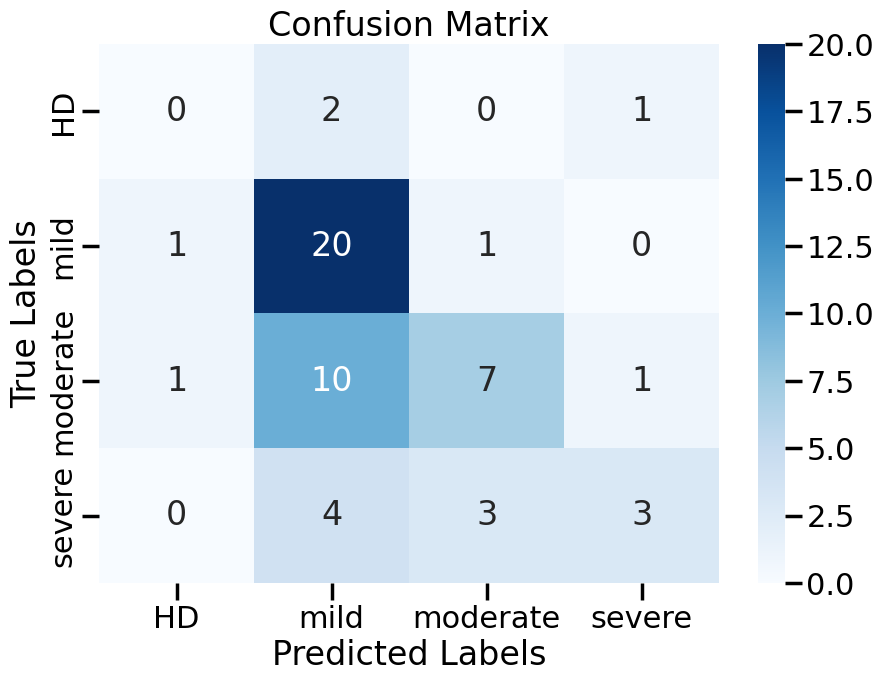

Cross-Validation Accuracy Scores: [0.71428571 0.74285714 0.81428571 0.79710145 0.85507246]
Mean CV Accuracy: 0.7847204968944099


In [262]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Define the parameter grid for RandomForestClassifier
param_dist = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'n_estimators': [50, 100, 200]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMote-enhanced training data
random_search.fit(X_train_smote, y_train_smote)

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_rf = random_search.best_estimator_
y_pred = best_rf.predict(X_test)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
cv_scores = cross_val_score(best_rf, X_train_smote, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

### BalancedRandomForestClassifier

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.para

Cross-validation scores: [0.68571429 0.75714286 0.8        0.79710145 0.84057971]
Mean cross-validation score: 0.7761076604554866


/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.para

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.53      0.82      0.64        22
           2       0.54      0.37      0.44        19
           3       0.60      0.30      0.40        10

    accuracy                           0.52        54
   macro avg       0.42      0.37      0.37        54
weighted avg       0.52      0.52      0.49        54

Accuracy: 0.5185185185185185


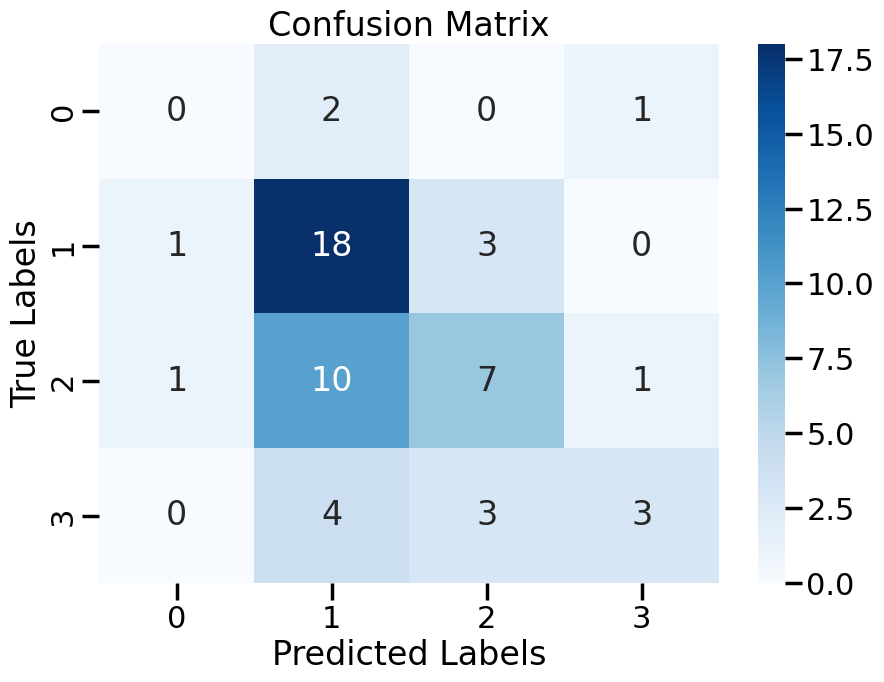

In [263]:
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Initialize BalancedRandomForestClassifier
balanced_rf = BalancedRandomForestClassifier(random_state=42)

# Cross-validation scores
cv_scores = cross_val_score(balanced_rf, X_train_smote, y_train_smote, cv=5)
print("Cross-validation scores:", cv_scores)
print("Mean cross-validation score:", cv_scores.mean())

# Fit the classifier
balanced_rf.fit(X_train_smote, y_train_smote)

# Predict on the test data
y_pred = balanced_rf.predict(X_test)

# Classification report and accuracy score
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [269]:
# Calculate class weights based on the inverse of class frequencies
class_counts = np.bincount(y_train)
total_samples = len(y_train)
class_weights = {i: total_samples / (len(class_counts) * count) for i, count in enumerate(class_counts)}

# Print calculated class weights
print("Class Weights:", class_weights)

Class Weights: {0: 4.134615384615385, 1: 0.617816091954023, 2: 0.7072368421052632, 3: 1.3782051282051282}


Columns containing non-numeric data:
Index(['('patient_id', '')'], dtype='object')
Columns after dropping non-numeric data:
Index(['degree_centrality_0', 'degree_centrality_1', 'degree_centrality_2',
       'degree_centrality_3', 'degree_centrality_4', 'degree_centrality_5',
       'degree_centrality_6', 'degree_centrality_7', 'degree_centrality_8',
       'degree_centrality_9',
       ...
       '('closeness_centrality', 229)', '('closeness_centrality', 230)',
       '('closeness_centrality', 231)', '('closeness_centrality', 232)',
       '('closeness_centrality', 233)', '('closeness_centrality', 234)',
       '('closeness_centrality', 235)', '('closeness_centrality', 236)',
       '('closeness_centrality', 237)', '('closeness_centrality', 238)'],
      dtype='object', length=1800)
After SMOTE, class distribution in training set:
[87 87 87 87]
Fitting the BalancedRandomForestClassifier model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/util

Model fitting complete.
Best parameters found:  {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 30, 'class_weight': {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0}}
Best accuracy found:  0.7528735632183908


/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:86: FutureWarning: Function delayed is deprecated; The function `delayed` has been moved from `sklearn.utils.fixes` to `sklearn.utils.parallel`. This import path will be removed in 1.5.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py:114: UserWarning: `sklearn.utils.para

Cross-Validation Accuracy Scores: [0.67142857 0.75714286 0.75714286 0.8115942  0.86956522]
Mean CV Accuracy: 0.773374741200828


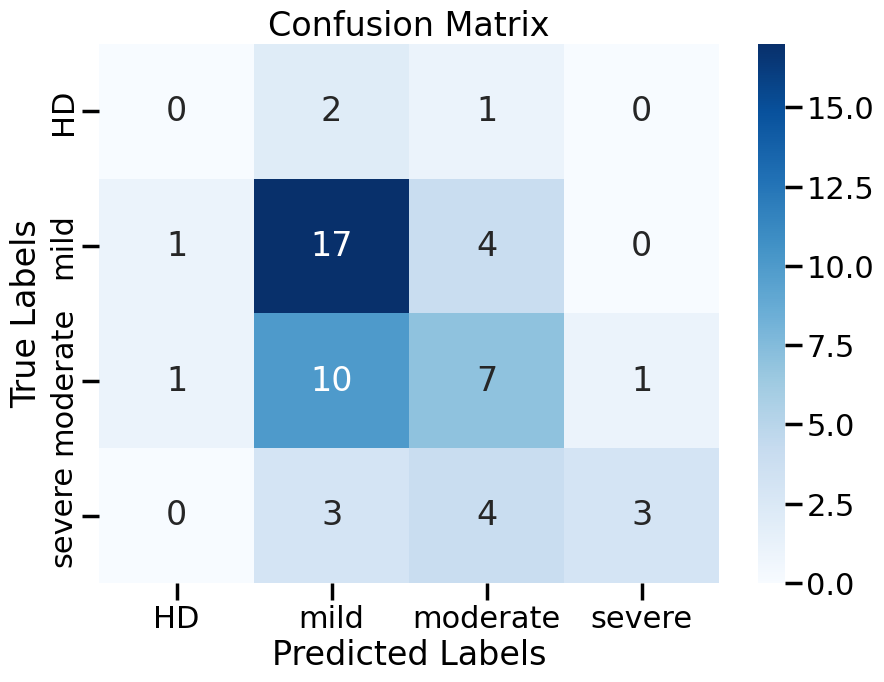

Classification Report:
              precision    recall  f1-score   support

          HD       0.00      0.00      0.00         3
        mild       0.53      0.77      0.63        22
    moderate       0.44      0.37      0.40        19
      severe       0.75      0.30      0.43        10

    accuracy                           0.50        54
   macro avg       0.43      0.36      0.36        54
weighted avg       0.51      0.50      0.48        54

Accuracy: 0.5


In [271]:
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE

# Rename 'd_cond_x' to 'd_cond'
merged_features = merged_features.rename(columns={'d_cond_x': 'd_cond'})

# Drop 'd_cond_y' if it exists
if 'd_cond_y' in merged_features.columns:
    merged_features = merged_features.drop(columns=['d_cond_y'])

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in merged_features.columns:
    X = merged_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = merged_features.drop(['patient_id', 'd_cond'], axis=1)

# Inspect columns that contain non-numeric data
non_numeric_columns = X.select_dtypes(exclude=[np.number]).columns

print("Columns containing non-numeric data:")
print(non_numeric_columns)

# Drop any non-numeric columns if they still exist
X = X.drop(columns=non_numeric_columns)

# Ensure all remaining columns are numeric
print("Columns after dropping non-numeric data:")
print(X.columns)

# Setting the target variable
y = merged_features['d_cond']

# Encode the target variable 'd_cond' to numeric values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Apply SMOTE to the training data to handle class imbalance
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Display class distribution after SMOTE
print("After SMOTE, class distribution in training set:")
print(np.bincount(y_train_smote))

# Calculate class weights for BalancedRandomForestClassifier
class_counts = np.bincount(y_train_smote)
total_samples = len(y_train_smote)
class_weights = {i: total_samples / (len(class_counts) * count) for i, count in enumerate(class_counts)}

# Define the parameter grid for BalancedRandomForestClassifier
param_dist = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'n_estimators': [50, 100, 200],
    'class_weight': [class_weights]  # Use the calculated class weights
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=BalancedRandomForestClassifier(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMOTE-enhanced training data
print("Fitting the BalancedRandomForestClassifier model...")
random_search.fit(X_train_smote, y_train_smote)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_brf = random_search.best_estimator_
y_pred = best_brf.predict(X_test)

# Perform cross-validation to assess model stability
cv_scores = cross_val_score(best_brf, X_train_smote, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

### GradientBoostingClassifier

Columns containing non-numeric data:
Index(['('patient_id', '')'], dtype='object')
Columns after dropping non-numeric data:
Index(['degree_centrality_0', 'degree_centrality_1', 'degree_centrality_2',
       'degree_centrality_3', 'degree_centrality_4', 'degree_centrality_5',
       'degree_centrality_6', 'degree_centrality_7', 'degree_centrality_8',
       'degree_centrality_9',
       ...
       '('closeness_centrality', 229)', '('closeness_centrality', 230)',
       '('closeness_centrality', 231)', '('closeness_centrality', 232)',
       '('closeness_centrality', 233)', '('closeness_centrality', 234)',
       '('closeness_centrality', 235)', '('closeness_centrality', 236)',
       '('closeness_centrality', 237)', '('closeness_centrality', 238)'],
      dtype='object', length=1800)
After SMOTE, class distribution in training set:
[87 87 87 87]
Fitting the GradientBoostingClassifier model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Model fitting complete.
Best para

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


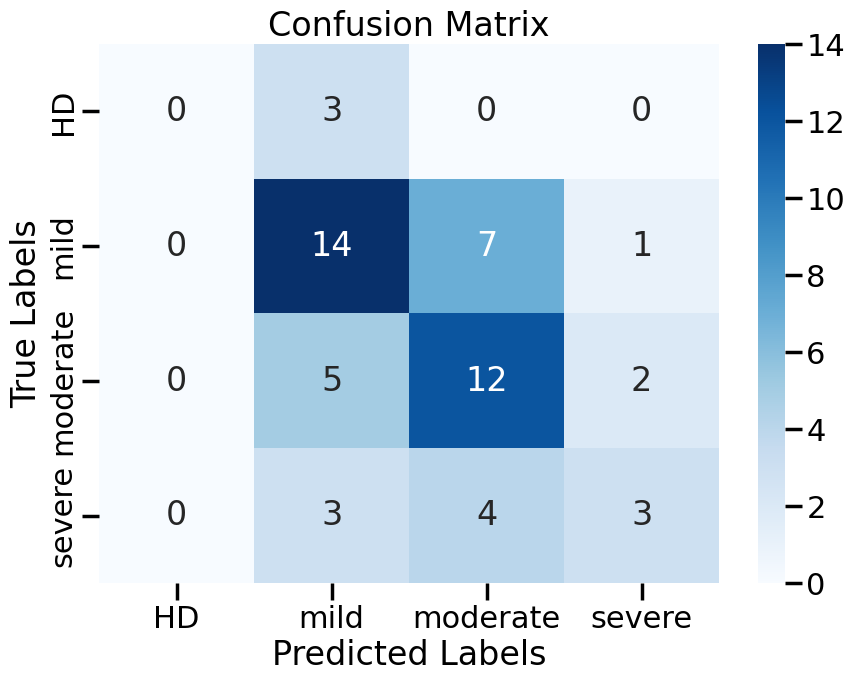

Cross-Validation Accuracy Scores: [0.62857143 0.74285714 0.72857143 0.71014493 0.82608696]
Mean CV Accuracy: 0.7272463768115942


In [272]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Rename 'd_cond_x' to 'd_cond'
merged_features = merged_features.rename(columns={'d_cond_x': 'd_cond'})

# Drop 'd_cond_y' if it exists
if 'd_cond_y' in merged_features.columns:
    merged_features = merged_features.drop(columns=['d_cond_y'])

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in merged_features.columns:
    X = merged_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = merged_features.drop(['patient_id', 'd_cond'], axis=1)

# Inspect columns that contain non-numeric data
non_numeric_columns = X.select_dtypes(exclude=[np.number]).columns

print("Columns containing non-numeric data:")
print(non_numeric_columns)

# Drop any non-numeric columns if they still exist
X = X.drop(columns=non_numeric_columns)

# Ensure all remaining columns are numeric
print("Columns after dropping non-numeric data:")
print(X.columns)

# Setting the target variable
y = merged_features['d_cond']

# Encode the target variable 'd_cond' to numeric values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Apply SMOTE to the training data to handle class imbalance
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Display class distribution after SMOTE
print("After SMOTE, class distribution in training set:")
print(np.bincount(y_train_smote))

# Define the parameter grid for GradientBoostingClassifier
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=GradientBoostingClassifier(random_state=42),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMOTE-enhanced training data
print("Fitting the GradientBoostingClassifier model...")
random_search.fit(X_train_smote, y_train_smote)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_gbc = random_search.best_estimator_
y_pred = best_gbc.predict(X_test)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
cv_scores = cross_val_score(best_gbc, X_train_smote, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

### KNeighbordClassifier

Columns containing non-numeric data:
Index(['('patient_id', '')'], dtype='object')
Columns after dropping non-numeric data:
Index(['degree_centrality_0', 'degree_centrality_1', 'degree_centrality_2',
       'degree_centrality_3', 'degree_centrality_4', 'degree_centrality_5',
       'degree_centrality_6', 'degree_centrality_7', 'degree_centrality_8',
       'degree_centrality_9',
       ...
       '('closeness_centrality', 229)', '('closeness_centrality', 230)',
       '('closeness_centrality', 231)', '('closeness_centrality', 232)',
       '('closeness_centrality', 233)', '('closeness_centrality', 234)',
       '('closeness_centrality', 235)', '('closeness_centrality', 236)',
       '('closeness_centrality', 237)', '('closeness_centrality', 238)'],
      dtype='object', length=1800)
Fitting the KNN model with RandomizedSearchCV...
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Model fitting complete.
Best parameters found:  {'weights': 'distance', 'p': 1, 'n_neighbors': 

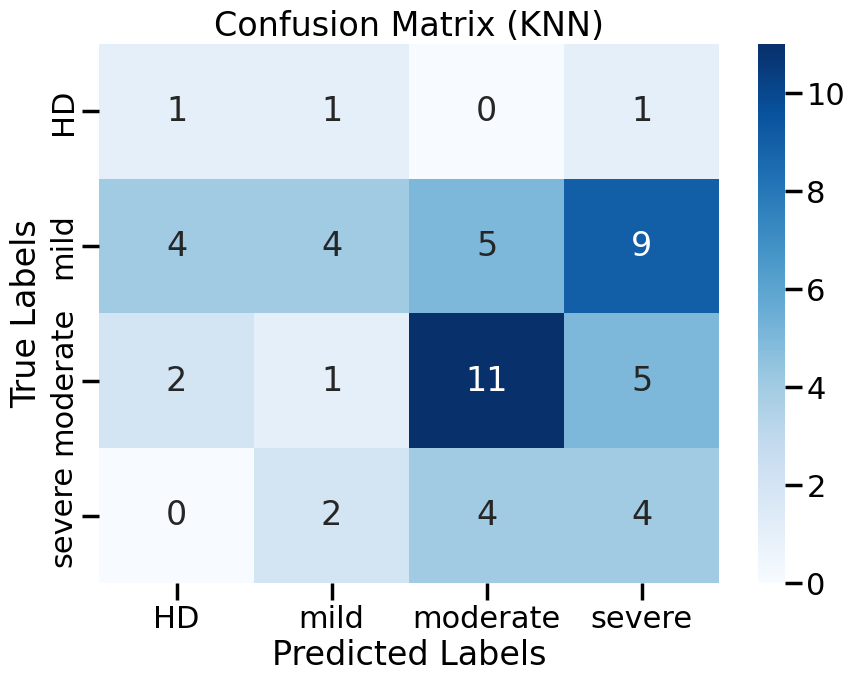

Fitting the stacking model...
Stacking model fitting complete.
Classification Report (Stacking Classifier):
              precision    recall  f1-score   support

          HD       0.00      0.00      0.00         3
        mild       0.62      0.82      0.71        22
    moderate       0.56      0.53      0.54        19
      severe       0.43      0.30      0.35        10

    accuracy                           0.57        54
   macro avg       0.40      0.41      0.40        54
weighted avg       0.53      0.57      0.54        54

Accuracy (Stacking Classifier): 0.5740740740740741


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


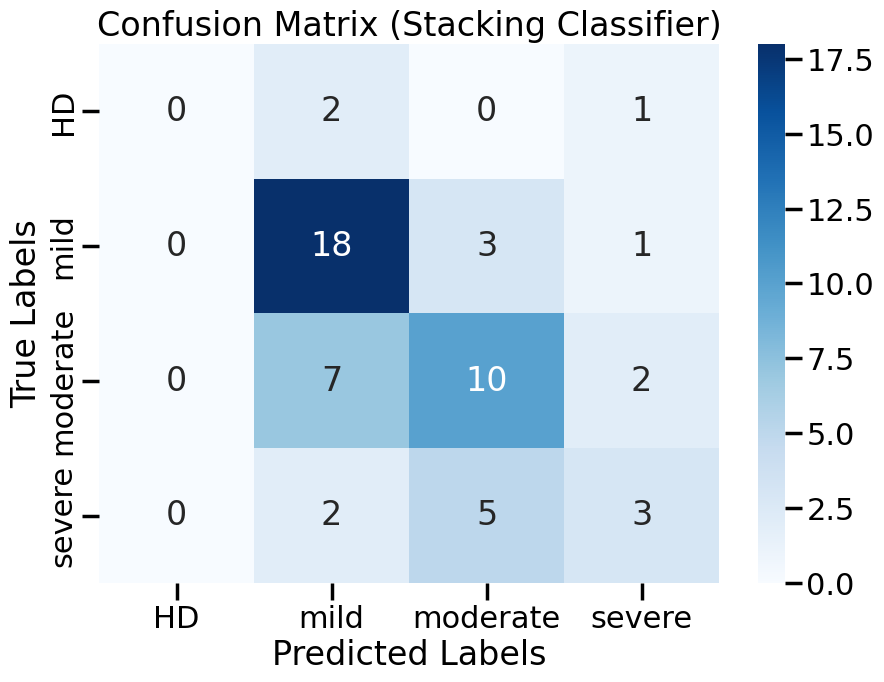

Classification Report (KNN with PCA):
              precision    recall  f1-score   support

          HD       0.17      0.67      0.27         3
        mild       0.35      0.32      0.33        22
    moderate       0.46      0.32      0.37        19
      severe       0.11      0.10      0.11        10

    accuracy                           0.30        54
   macro avg       0.27      0.35      0.27        54
weighted avg       0.33      0.30      0.30        54

Accuracy (KNN with PCA): 0.2962962962962963


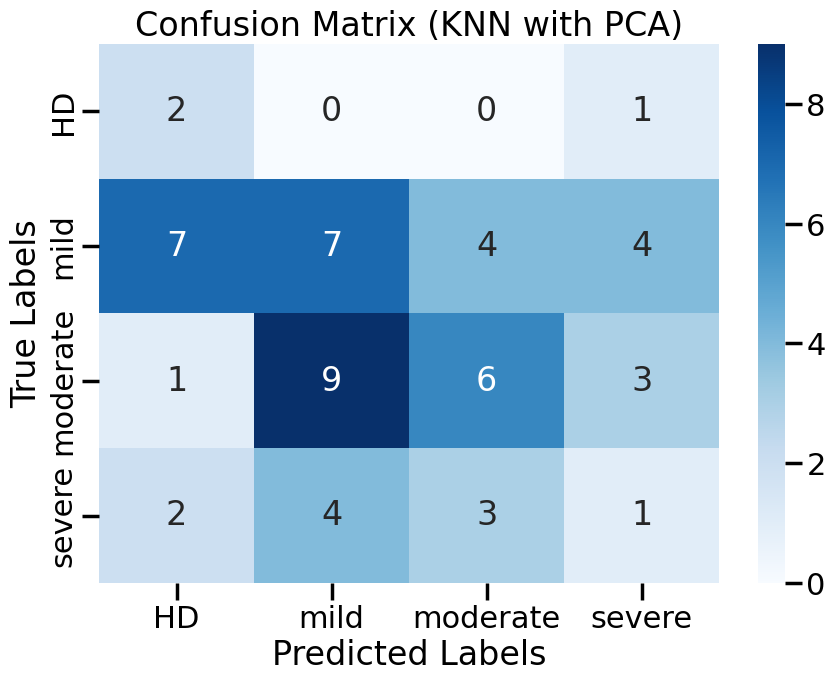

Performing cross-validation on the KNN model...
Cross-Validation Accuracy Scores (KNN): [0.6        0.6        0.68571429 0.65217391 0.75362319]
Mean CV Accuracy (KNN): 0.6583022774327121
Performing cross-validation on the stacking classifier...
Cross-Validation Accuracy Scores (Stacking Classifier): [0.71428571 0.7        0.77142857 0.75362319 0.79710145]
Mean CV Accuracy (Stacking Classifier): 0.7472877846790891
Performing cross-validation on KNN with PCA...
Cross-Validation Accuracy Scores (KNN with PCA): [0.65714286 0.67142857 0.64285714 0.73913043 0.73913043]
Mean CV Accuracy (KNN with PCA): 0.6899378881987577


In [273]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Rename 'd_cond_x' to 'd_cond'
merged_features = merged_features.rename(columns={'d_cond_x': 'd_cond'})

# Drop 'd_cond_y' if it exists
if 'd_cond_y' in merged_features.columns:
    merged_features = merged_features.drop(columns=['d_cond_y'])

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in merged_features.columns:
    X = merged_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = merged_features.drop(['patient_id', 'd_cond'], axis=1)

# Inspect columns that contain non-numeric data
non_numeric_columns = X.select_dtypes(exclude=[np.number]).columns

print("Columns containing non-numeric data:")
print(non_numeric_columns)

# Drop any non-numeric columns if they still exist
X = X.drop(columns=non_numeric_columns)

# Ensure all remaining columns are numeric
print("Columns after dropping non-numeric data:")
print(X.columns)

# Setting the target variable
y = merged_features['d_cond']

# Encode the target variable 'd_cond' to numeric values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Apply SMOTE to the training data to handle class imbalance
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Apply standard scaling to the features
scaler = StandardScaler()
X_train_smote_scaled = scaler.fit_transform(X_train_smote)
X_test_scaled = scaler.transform(X_test)

# Apply PCA to reduce dimensionality
pca = PCA(n_components=0.95)  # Retain 95% of variance
X_train_pca = pca.fit_transform(X_train_smote_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Define the parameter grid for KNeighborsClassifier
param_dist = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2]  # 1 for Manhattan, 2 for Euclidean
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=KNeighborsClassifier(),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMOTE-enhanced training data
print("Fitting the KNN model with RandomizedSearchCV...")
random_search.fit(X_train_smote_scaled, y_train_smote)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_knn = random_search.best_estimator_
y_pred_knn = best_knn.predict(X_test_scaled)

# Evaluation metrics for KNN
print("Classification Report (KNN):")
print(classification_report(y_test, y_pred_knn, target_names=label_encoder.classes_))
print("Accuracy (KNN):", accuracy_score(y_test, y_pred_knn))

# Display the confusion matrix for KNN
cm_knn = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix (KNN)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Initialize the Stacking Classifier with KNN and RandomForest
base_models = [
    ('knn', KNeighborsClassifier(weights='distance', p=1, n_neighbors=3, algorithm='ball_tree')),
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42))
]
meta_model = LogisticRegression()

stacking_clf = StackingClassifier(estimators=base_models, final_estimator=meta_model, cv=5)

# Fit the Stacking Classifier using the SMOTE-enhanced and scaled training data
print("Fitting the stacking model...")
stacking_clf.fit(X_train_smote_scaled, y_train_smote)
print("Stacking model fitting complete.")

# Predict on the test data using the stacking model
y_pred_stacking = stacking_clf.predict(X_test_scaled)

# Evaluation metrics for Stacking Classifier
print("Classification Report (Stacking Classifier):")
print(classification_report(y_test, y_pred_stacking, target_names=label_encoder.classes_))
print("Accuracy (Stacking Classifier):", accuracy_score(y_test, y_pred_stacking))

# Display the confusion matrix for Stacking Classifier
cm_stacking = confusion_matrix(y_test, y_pred_stacking)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_stacking, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix (Stacking Classifier)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Initialize and fit KNN with PCA
knn_pca = KNeighborsClassifier(weights='distance', p=1, n_neighbors=3, algorithm='ball_tree')
knn_pca.fit(X_train_pca, y_train_smote)
y_pred_pca = knn_pca.predict(X_test_pca)

# Evaluation metrics for KNN with PCA
print("Classification Report (KNN with PCA):")
print(classification_report(y_test, y_pred_pca, target_names=label_encoder.classes_))
print("Accuracy (KNN with PCA):", accuracy_score(y_test, y_pred_pca))

# Display the confusion matrix for KNN with PCA
cm_pca = confusion_matrix(y_test, y_pred_pca)
plt.figure(figsize=(10, 7))
sns.heatmap(cm_pca, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix (KNN with PCA)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability for KNN
print("Performing cross-validation on the KNN model...")
cv_scores_knn = cross_val_score(best_knn, X_train_smote_scaled, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores (KNN):", cv_scores_knn)
print("Mean CV Accuracy (KNN):", np.mean(cv_scores_knn))

# Perform cross-validation to assess model stability for Stacking Classifier
print("Performing cross-validation on the stacking classifier...")
cv_scores_stacking = cross_val_score(stacking_clf, X_train_smote_scaled, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores (Stacking Classifier):", cv_scores_stacking)
print("Mean CV Accuracy (Stacking Classifier):", np.mean(cv_scores_stacking))

# Perform cross-validation to assess model stability for KNN with PCA
print("Performing cross-validation on KNN with PCA...")
cv_scores_pca = cross_val_score(knn_pca, X_train_pca, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores (KNN with PCA):", cv_scores_pca)
print("Mean CV Accuracy (KNN with PCA):", np.mean(cv_scores_pca))

### XGBoost

Columns containing non-numeric data:
Index(['('patient_id', '')'], dtype='object')
Columns after dropping non-numeric data:
Index(['degree_centrality_0', 'degree_centrality_1', 'degree_centrality_2',
       'degree_centrality_3', 'degree_centrality_4', 'degree_centrality_5',
       'degree_centrality_6', 'degree_centrality_7', 'degree_centrality_8',
       'degree_centrality_9',
       ...
       '('closeness_centrality', 229)', '('closeness_centrality', 230)',
       '('closeness_centrality', 231)', '('closeness_centrality', 232)',
       '('closeness_centrality', 233)', '('closeness_centrality', 234)',
       '('closeness_centrality', 235)', '('closeness_centrality', 236)',
       '('closeness_centrality', 237)', '('closeness_centrality', 238)'],
      dtype='object', length=1800)
Fitting the XGBClassifier model...
Fitting 3 folds for each of 50 candidates, totalling 150 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:26:39] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:26:43] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:26:45] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:26:47] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:26:51] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weigh

Model fitting complete.
Best parameters found:  {'subsample': 0.8, 'scale_pos_weight': 1.0, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.8}
Best accuracy found:  0.7126436781609197
Classification Report:
              precision    recall  f1-score   support

          HD       0.33      0.33      0.33         3
        mild       0.64      0.82      0.72        22
    moderate       0.56      0.53      0.54        19
      severe       0.60      0.30      0.40        10

    accuracy                           0.59        54
   macro avg       0.53      0.49      0.50        54
weighted avg       0.59      0.59      0.58        54

Accuracy: 0.5925925925925926


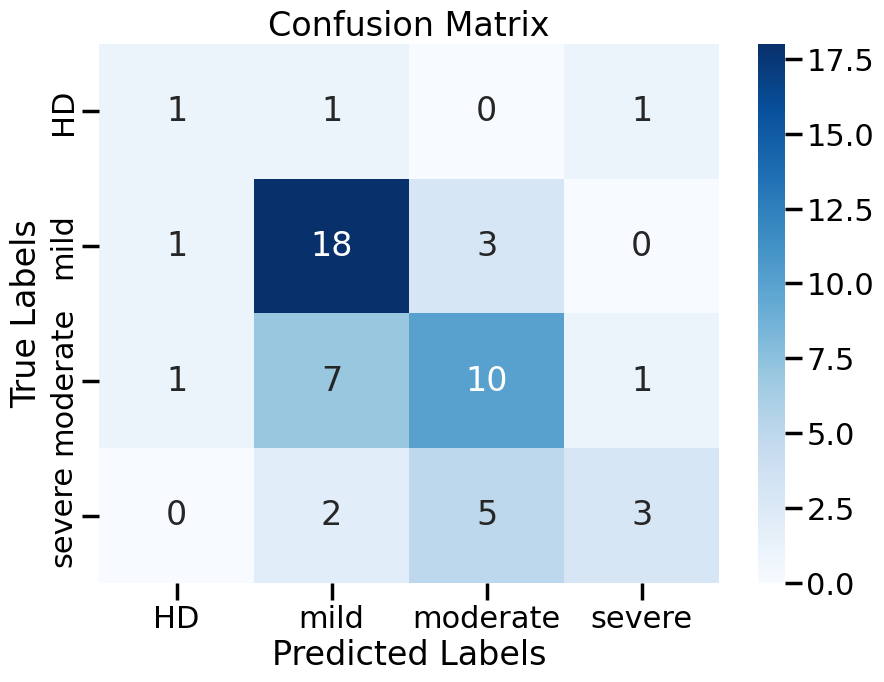

Performing cross-validation...


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:40:52] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:40:58] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:41:06] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:41:11] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:41:20] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "scale_pos_weigh

Cross-Validation Accuracy Scores: [0.64285714 0.71428571 0.7        0.73913043 0.85507246]
Mean CV Accuracy: 0.7302691511387163


In [274]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler, LabelEncoder
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Rename 'd_cond_x' to 'd_cond'
merged_features = merged_features.rename(columns={'d_cond_x': 'd_cond'})

# Drop 'd_cond_y' if it exists
if 'd_cond_y' in merged_features.columns:
    merged_features = merged_features.drop(columns=['d_cond_y'])

# Dropping the 'patient_id' and '(patient_id, )' columns along with 'd_cond' which is the target variable
if ('patient_id', '') in merged_features.columns:
    X = merged_features.drop(['patient_id', ('patient_id', ''), 'd_cond'], axis=1)
else:
    X = merged_features.drop(['patient_id', 'd_cond'], axis=1)

# Inspect columns that contain non-numeric data
non_numeric_columns = X.select_dtypes(exclude=[np.number]).columns

print("Columns containing non-numeric data:")
print(non_numeric_columns)

# Drop any non-numeric columns if they still exist
X = X.drop(columns=non_numeric_columns)

# Ensure all remaining columns are numeric
print("Columns after dropping non-numeric data:")
print(X.columns)

# Setting the target variable
y = merged_features['d_cond']

# Encode the target variable 'd_cond' to numeric values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Apply SMOTE to the training data to handle class imbalance
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Apply standard scaling to the features
scaler = StandardScaler()
X_train_smote_scaled = scaler.fit_transform(X_train_smote)
X_test_scaled = scaler.transform(X_test)

# Calculate the scale_pos_weight for handling class imbalance
classes, counts = np.unique(y_train_smote, return_counts=True)
scale_pos_weight = counts[0] / counts[1]

# Define the parameter grid for XGBClassifier
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'scale_pos_weight': [scale_pos_weight]
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=XGBClassifier(random_state=42, objective='multi:softmax'),
                                   param_distributions=param_dist,
                                   n_iter=50,  # Number of parameter settings sampled
                                   cv=3,  # Number of cross-validation folds
                                   scoring='accuracy',
                                   verbose=1,
                                   random_state=42)  # Show progress

# Fit RandomizedSearchCV using the SMOTE-enhanced training data
print("Fitting the XGBClassifier model...")
random_search.fit(X_train_smote_scaled, y_train_smote)
print("Model fitting complete.")

# Output best parameters and accuracy
print("Best parameters found: ", random_search.best_params_)
print("Best accuracy found: ", random_search.best_score_)

# Predict on the test data using the best model
best_xgb = random_search.best_estimator_
y_pred = best_xgb.predict(X_test_scaled)

# Evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))
print("Accuracy:", accuracy_score(y_test, y_pred))

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Perform cross-validation to assess model stability
print("Performing cross-validation...")
cv_scores = cross_val_score(best_xgb, X_train_smote_scaled, y_train_smote, cv=5, scoring='accuracy')
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))


# *MISC*

## Wrong models

### Keras

In [ ]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Flatten, Dense, concatenate
from tensorflow.keras.utils import to_categorical

# Encoding the 'node' and 'd_cond' for use in a neural network
node_encoder = LabelEncoder()
df['node_encoded'] = node_encoder.fit_transform(df['node'])

# Prepare target
target_encoder = LabelEncoder()
y = to_categorical(target_encoder.fit_transform(df['d_cond']))

# Inputs
node_input = Input(shape=(1,), name='node_input')
centrality_input = Input(shape=(4,), name='centrality_input')  # Assuming 4 centrality measures

# Embedding for nodes
node_embedding = Embedding(input_dim=len(node_encoder.classes_), output_dim=10)(node_input)
node_vec = Flatten()(node_embedding)

# Concatenate node embeddings with centrality measures
concatenated = concatenate([node_vec, centrality_input])

# Output layer for multi-class classification
output = Dense(y.shape[1], activation='softmax')(concatenated)

# Build and compile the model
model = Model(inputs=[node_input, centrality_input], outputs=output)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit([df['node_encoded'], df[['degree_centrality', 'eigenvector_centrality', 'betweenness_centrality', 'closeness_centrality']]], y, epochs=10, batch_size=32)


###FeatureHasher

In [ ]:
# Check for duplicate patient_ids in features_df
print("Unique patient_ids in features_df:", df['patient_id'].nunique())
print("Total entries in features_df:", len(df['patient_id']))

In [ ]:
df.head()

In [ ]:
# Assuming hashed_features_df is the DataFrame containing your hashed features
df = pd.concat([df, hashed_features_df], axis=1)  # Concatenate along columns

In [ ]:
# Rename all columns now that hashed features are included
df.columns = ['node', 'degree_centrality', 'eigenvector_centrality', 'betweenness_centrality', 'closeness_centrality', 'patient_id', 'd_cond'] + [str(i) for i in range(10)]


In [ ]:
# Aggregate features by 'patient_id'
aggregated_features = df.groupby('patient_id').agg({
    'degree_centrality': 'mean',
    'eigenvector_centrality': 'mean',
    'betweenness_centrality': 'mean',
    'closeness_centrality': 'mean',
    **{str(i): 'mean' for i in range(10)}  # Aggregating the hashed features
}).reset_index()

# Adding 'd_cond' back to the aggregated features, ensuring one 'd_cond' per 'patient_id'
aggregated_features = aggregated_features.merge(
    df[['patient_id', 'd_cond']].drop_duplicates(),
    on='patient_id',
    how='left'
)

In [ ]:
# Show the head of the new DataFrame and check its structure
print(aggregated_features.head())
print("Shape of the aggregated features:", aggregated_features.shape)

### NetworkX

In [ ]:
# Generating the Eigenvector Centrality with NetWorkX
import networkx as nx

# Create a new NetworkX graph
nx_graph_0 = nx.Graph()

# Add nodes and edges
nx_graph_0.add_nodes_from(node_list_0)
nx_graph_0.add_edges_from(edge_list_0)

# Now you can apply various NetworkX functions
# Calculate centrality
centrality_0 = nx.eigenvector_centrality(nx_graph_0)
print("Eigenvector Centrality:", centrality_0)

# Calculate the number of connected components
print("Number of connected components:", nx.number_connected_components(nx_graph_0))

# Basic info
print("Number of nodes:", nx_graph_0.number_of_nodes())
print("Number of edges:", nx_graph_0.number_of_edges())

### Feature generation

1. **Degree Centrality:** Number of direct connections a node has.
- Betweenness Centrality: Number of times a node acts as a bridge along the shortest path between two other nodes.
- Closeness Centrality: Reciprocal of the sum of the shortest path distances from a node to all other nodes.

Machine Learning Context:
These centrality measures can be used as features indicating the importance or strategic positioning of specific sequences in the immune response network. Higher centrality could imply sequences crucial in mediating or influencing immune response patterns.

2. Connected Components

Machine Learning Context:
Being part of a larger or smaller component might indicate sequences that are part of common or rare immune response pathways. This could be particularly insightful when analyzing the evolution of immune responses or identifying unique responses to severe infections.

3. Graph Structural Features

Calculating graph-level features such as density, average clustering coefficient, or average shortest path length.

Machine Learning Context:
These features can represent the overall structure and interconnectivity of the immune response at different time points (0h vs. 24h), helping to model changes or stability in the immune system's architecture.

In [ ]:
import networkx as nx

# Assuming nx_graph_0 is already created and populated
features_df = pd.DataFrame(index=nx_graph_0.nodes())
features_df['eigenvector'] = pd.Series(nx.eigenvector_centrality(nx_graph_0))
features_df['degree'] = pd.Series(nx.degree_centrality(nx_graph_0))
features_df['betweenness'] = pd.Series(nx.betweenness_centrality(nx_graph_0))
features_df['closeness'] = pd.Series(nx.closeness_centrality(nx_graph_0))
features_df['density'] = nx.density(nx_graph_0)
features_df['avg_clustering'] = nx.average_clustering(nx_graph_0)
features_df['global_efficiency'] = nx.global_efficiency(nx_graph_0)
features_df['component_size'] = pd.Series(component_sizes)
features_df['component_label'] = pd.Series(component_labels)

In [ ]:
features_df.head()

# Print the shape of the DataFrame
print("Shape of features_df:", features_df.shape)

In [ ]:
# Get summary statistics for the original DataFrame
stats_original = features_df.describe()

# Print the statistics
print("Original Data Statistics:")
print(stats_original)

# Get summary statistics for the scaled DataFrame
stats_scaled = features_df_scaled.describe()

# Print the statistics of the scaled data
print("\nScaled Data Statistics:")
print(stats_scaled)

### Standartization and scaling for PCA

In [ ]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler object
scaler = StandardScaler()

# Assuming features_df is your DataFrame with all numeric columns
features_scaled = scaler.fit_transform(features_df)

# Convert the scaled features back into a DataFrame
features_df_scaled = pd.DataFrame(features_scaled, index=features_df.index, columns=features_df.columns)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming features_df_scaled is already prepared and scaled
pca = PCA(n_components=0.95)  # Retain 95% of the variance
principalComponents = pca.fit_transform(features_df_scaled)

# Convert to DataFrame for easier handling
pca_df = pd.DataFrame(data=principalComponents)

# Plot the explained variance to see how many components are sufficient
plt.figure(figsize=(8, 4))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')  # for each component
plt.title('Explained Variance')
plt.show()

## Additional EDA

### 1. Voterank Centrality
An alternative centrality measure to eigenvector_centrality, you can consider using voterank. This method is often used for identifying influential nodes in a graph based on a simple majority rule in voting networks, which might be less susceptible to the issues affecting the power iteration method:

In [5]:
from LZGraphs.Graphs.Naive import NaiveLZGraph, generate_dictionary
import numpy as np

# Group data by patient_ID
grouped = df_filtered.groupby('patient_id')
patient_feature_vectors = {}

NameError: name 'df_filtered' is not defined

In [6]:
try:
    centrality_measure = lzgraph.voterank()
    patient_feature_vectors[patient_id] = centrality_measure
    print(f"Patient {patient_id} Voterank Centrality:", centrality_measure)
except Exception as e:
    print(f"Failed for patient {patient_id} with error: {e}")


NameError: name 'patient_id' is not defined

### 2. Random Walk Methods
Random walks can provide insights into the graph's structure and the importance of nodes based on their traversal probability:

Simple Random Walk: This can give you an idea of node connectivity and reachability.
Random Walk with Backtracking (Ber Shortest): This variant can provide insights into path diversity and node centrality.

In [ ]:
try:
    # Set a number of steps for the random walk. Adjust this number based on your specific needs.
    num_steps = 10  # Example: 10 steps. Adjust this value as needed.
    walk_result = lzgraph.random_walk(steps=num_steps)
    print("Random Walk Result for Patient", patient_id, ":", walk_result)
except Exception as e:
    print(f"Random walk failed for patient {patient_id} with error: {e}")

**Step-by-Step Implementation**
Setup: Initialize structures for storing feature vectors and any additional results.
Loop through Patients: For each patient, generate the graph, compute centrality and perform a random walk.
Store Results: Collect results into a DataFrame for subsequent analysis or modeling

In [ ]:
import pandas as pd
from LZGraphs.Graphs.Naive import NaiveLZGraph, generate_dictionary

# Initialize DataFrame to store features
features_df = pd.DataFrame()

for patient_id, group in df_filtered.groupby('patient_id'):
    sequences = group['cdr3_amino_acid'].tolist()
    lzgraph = NaiveLZGraph(sequences, dictionary, verbose=True)

    # Initialize a dictionary to store features for this patient
    patient_features = {'patient_id': patient_id}

    # Compute Voterank centrality
    try:
        centrality_measure = lzgraph.voterank()
        patient_features['voterank_centrality'] = centrality_measure
        print(f"Patient {patient_id} Voterank Centrality:", centrality_measure)
    except Exception as e:
        print(f"Failed Voterank for patient {patient_id} with error: {e}")
        patient_features['voterank_centrality'] = None

    # Append patient's features to the DataFrame
    features_df = features_df.append(patient_features, ignore_index=True)

# Optionally, save the DataFrame to a CSV file for further analysis
features_df.to_csv("patient_features.csv", index=False)

In [ ]:
import pandas as pd

file_path = '/content/drive/MyDrive/AI_FINAL_project_Aizhan/patient_features.csv'

patient_features = pd.read_csv(file_path)

patient_features.head()

In [ ]:
# Assuming 'patient_ID' is the identifier and 'd_cond' is the target column
clinical_targets = df_filtered[['patient_ID', 'd_cond']].drop_duplicates()

# Merging on 'patient_ID' to align clinical targets with graph-based features
data = pd.merge(patient_features, clinical_targets, on='patient_ID', how='left')

# Check the first few rows of the merged data to verify it looks correct
print(data.head())

# Save the merged DataFrame to a new CSV file
data.to_csv('merged_patient_features.csv', index=False)


In [ ]:
import pandas as pd
import ast

# Convert the string representations of lists into actual lists
data['voterank_centrality'] = data['voterank_centrality'].apply(ast.literal_eval)

# Encoding the 'd_cond' column, assuming there are multiple conditions like 'mild', 'moderate', etc.
condition_mapping = {'mild': 0, 'moderate': 1}  # Extend this dictionary based on your data
data['d_cond'] = data['d_cond'].map(condition_mapping)

# Example of how to handle the voterank_centrality data for feature engineering (e.g., using a simple count vectorizer)
from sklearn.feature_extraction.text import CountVectorizer

# Flatten the list of lists to a single list of sequences for vectorization
all_sequences = [seq for sublist in data['voterank_centrality'] for seq in sublist]

# Fit a count vectorizer and transform the data
vectorizer = CountVectorizer()
sequence_matrix = vectorizer.fit_transform(all_sequences)

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import ast

# Convert the string representations in 'voterank_centrality' into actual lists
data['voterank_centrality'] = data['voterank_centrality'].apply(ast.literal_eval)

# Flatten the list of sequences for each patient into a single string per patient
data['sequences'] = data['voterank_centrality'].apply(lambda x: ' '.join(x))

In [ ]:
from LZGraphs.Graphs.Naive import NaiveLZGraph, generate_dictionary
import numpy as np

# Group data by patient_ID
grouped = df_filtered.groupby('patient_ID')
patient_feature_vectors = {}

for patient_id, group in grouped:
    sequences = group['cdr3_amino_acid'].tolist()
    lzgraph = NaiveLZGraph(sequences, dictionary, verbose=True)

    try:
        # Try to compute the eigenvector centrality with adjusted parameters
        eigenvector_centrality = lzgraph.eigenvector_centrality(max_iter=500, tol=1e-4)
        patient_feature_vectors[patient_id] = eigenvector_centrality
        print(f"Patient {patient_id} Eigenvector Centrality:", eigenvector_centrality)
    except nx.PowerIterationFailedConvergence as e:
        print(f"Eigenvector centrality failed to converge for patient {patient_id}: {e}")


In [ ]:
import networkx as nx
import pandas as pd

# Assuming lzgraph and dictionary are properly initialized
# Assume sequences for a specific patient (patient_id = '100_1')
patient_id = '100_1'
sequences = df_filtered[df_filtered['patient_ID'] == patient_id]['cdr3_amino_acid'].tolist()

# Create the graph for this patient
lzgraph = NaiveLZGraph(sequences, dictionary, verbose=True)

# Initialize a list to store subgraph metrics
subgraph_metrics = []

# Compute Voterank centrality
try:
    central_nodes = lzgraph.voterank()
    print(f"Patient {patient_id} Voterank Centrality:", central_nodes)

    # Assuming 'G' is the NetworkX graph conversion of your lzgraph
    G = nx.Graph(lzgraph.edges())  # Adjust this line based on how lzgraph manages and exposes its graph data

    for node in central_nodes:
        neighbors = list(G.neighbors(node))
        subgraph = G.subgraph([node] + neighbors)
        subgraph_metrics.append({
            'patient_ID': patient_id,
            'central_node': node,
            'num_neighbors': len(neighbors),
            'num_edges': subgraph.number_of_edges()
        })

except Exception as e:
    print(f"Failed Voterank for patient {patient_id} with error: {e}")

# Convert subgraph metrics to a DataFrame and save it to CSV
if subgraph_metrics:
    metrics_df = pd.DataFrame(subgraph_metrics)
    metrics_df.to_csv("one_patient_subgraph_metrics.csv", index=False)
    print("Subgraph metrics saved successfully.")
else:
    print("No subgraph metrics to save.")


MISC FOR EDA

In [ ]:
import numpy as np

# Mock data creation for demonstration; replace df_filtered with your actual DataFrame
df_filtered['feature_vector'] = feature_vector  # Assuming feature_vector is already appended to df_filtered

# Group by 'patient_ID' and aggregate feature vectors by mean
feature_df = df_filtered.groupby('patient_ID')['feature_vector'].apply(lambda x: np.mean(np.vstack(x), axis=0))

# Retrieve the corresponding labels
labels = df_filtered.groupby('patient_ID')['d_cond'].first()


In [ ]:
# Aggregate features if not done previously
feature_df = df_filtered.groupby('patient_ID')['feature_vector'].apply(lambda x: np.mean(np.vstack(x), axis=0))

# Check if the aggregation results in any empty or all-NaN vectors
print("Aggregated feature shape:", feature_df.shape)
print("Sample aggregated feature:", feature_df.iloc[0])

# Apply imputation and check the result
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(np.vstack(feature_df.values))

print("Shape after imputation:", X_train_imputed.shape)

# If the shape of X_train_imputed is (n, 0), there is an issue with the input data to the imputer
if X_train_imputed.shape[1] == 0:
    print("Warning: No valid features available after imputation.")

# Check for any remaining NaNs
if np.isnan(X_train_imputed).any():
    print("Warning: NaN values exist after imputation.")


**Eigenvector centrality** is a measure of the influence of a node in a network. Nodes with high eigenvector centrality are those that are connected to many other nodes who themselves have high scores. Here's what can be infered from the scores:

*   Magnitude of Scores: The scores are extremely small, which can happen in large graphs or graphs with particular structural characteristics like sparsity or nodes that are not strongly connected.
*   Identifying Key Nodes: Nodes with higher scores (relatively speaking within this context) are more 'central' or influential. These could represent amino acid sequences or motifs that are more prevalent or more critical in terms of function or structural stability.
*   Graph Structure Insight: The distribution of centrality scores can give you insights into the structure of the graph. A few nodes with significantly higher scores than others might indicate hubs in a scale-free network, which is a common structure in biological networks.

**Utilizing the Results with the centrality scores**

*   Prioritize Sequences: Focus on sequences corresponding to nodes with higher centrality for further biological studies or experimental validations.
*   Feature Selection for Machine Learning: Use centrality measures as features in machine learning models to predict biological properties or outcomes associated with different sequences.
*   Network Analysis: Perform further network analysis to understand the relationships and interaction dynamics between different sequences or sequence motifs.

**Next Steps in Analysis**

*   Visualize the Network: Plot the graph with node sizes or colors proportional to their centrality scores to visualize the network's structure and identify key nodes visually.
*   Correlate with Biological Data: If you have additional biological data (e.g., functional data, expression levels), correlate these centrality scores with that data to identify sequences of particular interest or significance.
*   Explore Other Metrics: Besides eigenvector centrality, explore other centrality measures or network metrics that might provide additional insights into the network's structure and the roles of its nodes.

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming 'lzgraph' is your graph object and 'centrality_scores' are what you've computed
nx.set_node_attributes(lzgraph, centrality_scores, 'centrality')

# Draw the graph
pos = nx.spring_layout(lzgraph)  # positions for all nodes
sizes = [8000 * lzgraph.nodes[node]['centrality'] for node in lzgraph.nodes()]

nx.draw(lzgraph, pos, with_labels=True, node_size=sizes, node_color=sizes, cmap=plt.cm.Blues,
        font_size=8, alpha=0.7)
plt.show()

## Another approach for feature extraction

In [101]:
new_data.head()

,dataset,patient_ID,patient_subID,cell_type,barcode,TRA_cdr3,TRA_cdr3_nt,TRA_V_gene,TRA_D_gene,TRA_J_gene,...,TRB_cdr3_nt,TRB_V_gene,TRB_D_gene,TRB_J_gene,TRB_C_gene,clonotype,d_cond,sex,age,race
0,Su,100_1,T1,CD8+,AAGACCTTCGTTACAG-1-9:I1:100-1,None,None,None,NaN,None,...,TGCAGTGCCGATCTGGACAGGGCAGGTAACGAGCAGTACTTC,TRBV20-1,NaN,TRBJ2-7,TRBC2,32396,mild,Female,32.0,Asian
1,Su,100_1,T1,CD8+,AGACGTTCACGTGAGA-1-9:I1:100-1,CALMDSNYQLIW,TGTGCGTTAATGGATAGCAACTATCAGTTAATCTGG,TRAV1-2,NaN,TRAJ33,...,TGTGCCAGCGCCCCCGGGACGCAGGTGGCAGTGGGGCAGTTCTTC,TRBV6-2,NaN,TRBJ2-1,TRBC2,32397,mild,Female,32.0,Asian
2,Su,100_1,T1,CD8+,AGTCTTTGTCTTCTCG-1-9:I1:100-1,CAVKDSNYQLIW,TGTGCTGTGAAGGATAGCAACTATCAGTTAATCTGG,TRAV1-2,NaN,TRAJ33,...,TGTGCCAGCAGTGCGGGACTAGAATACAATGAGCAGTTCTTC,TRBV28,NaN,TRBJ2-1,TRBC2,32398,mild,Female,32.0,Asian
3,Su,100_1,T1,CD8+,ATCTACTTCGCTGATA-1-9:I1:100-1,CAGSISNFGNEKLTF,TGTGCTGGCTCCATATCTAACTTTGGAAATGAGAAATTAACCTTT,TRAV41,NaN,TRAJ48,...,TGTGCCAGCAGACCTGAGGATAGCGGTAGCTCCTACAATGAGCAGT...,TRBV28,NaN,TRBJ2-1,TRBC2,32399,mild,Female,32.0,Asian
4,Su,100_1,T1,CD8+,ATGGGAGTCCGGGTGT-1-9:I1:100-1,None,None,None,NaN,None,...,TGTGCCAGCGCGAACCTCGGGACAGGGGGCACAGATACGCAGTATTTT,TRBV10-3,NaN,TRBJ2-3,TRBC2,28105,mild,Female,32.0,Asian


In [103]:
def analyze_columns(dataframe, exclude_columns):
    """
    Analyze columns in the dataframe excluding specified columns.

    Parameters:
    dataframe (pd.DataFrame): The dataframe to analyze.
    exclude_columns (list): List of columns to exclude from the analysis.

    Returns:
    pd.DataFrame: A dataframe summarizing the analysis of each column.
    """
    analysis = []

    for column in dataframe.columns:
        if column not in exclude_columns:
            unique_values = dataframe[column].nunique()
            missing_values = dataframe[column].isnull().sum()
            total_values = dataframe[column].shape[0]
            missing_percentage = (missing_values / total_values) * 100
            dtype = dataframe[column].dtype
            top_value = dataframe[column].mode()[0] if not dataframe[column].mode().empty else None
            top_freq = dataframe[column].value_counts().max() if not dataframe[column].value_counts().empty else None

            analysis.append({
                'Column': column,
                'Unique Values': unique_values,
                'Missing Values': missing_values,
                'Missing Percentage': missing_percentage,
                'Top Value': top_value,
                'Top Frequency': top_freq,
                'Data Type': dtype
            })

    analysis_df = pd.DataFrame(analysis)
    return analysis_df

In [104]:
# Specify the columns to exclude from the analysis
exclude_columns = ['TRA_cdr3', 'TRA_cdr3_nt']

# Analyze the columns
analysis_results = analyze_columns(new_data, exclude_columns)

# Display the analysis results
print(analysis_results)


           Column  Unique Values  Missing Values  Missing Percentage  \
0         dataset              1               0            0.000000   
1      patient_ID            270               0            0.000000   
2   patient_subID              2            6297            8.631821   
3       cell_type              1               0            0.000000   
4         barcode          72951               0            0.000000   
5      TRA_V_gene             46               0            0.000000   
6      TRA_D_gene              0           72951          100.000000   
7      TRA_J_gene             53               0            0.000000   
8      TRA_C_gene              2               0            0.000000   
9        TRB_cdr3          36676               0            0.000000   
10    TRB_cdr3_nt          37440               0            0.000000   
11     TRB_V_gene             50               0            0.000000   
12     TRB_D_gene              0           72951          100.00

Pre-processing will involve: We are going to remove theses: 'dataset','patient_subID', 'cell_type', 'barcode', 'TRA_D_gene', 'TRB_D_gene'

In [107]:
# Assuming new_data is already defined

# List of columns to remove
columns_to_remove = ['dataset','patient_subID', 'cell_type', 'barcode', 'TRA_D_gene', 'TRB_D_gene']

# Create the features DataFrame by dropping the specified columns
features = new_data.drop(columns=columns_to_remove)

features.head()

,patient_ID,TRA_cdr3,TRA_cdr3_nt,TRA_V_gene,TRA_J_gene,TRA_C_gene,TRB_cdr3,TRB_cdr3_nt,TRB_V_gene,TRB_J_gene,TRB_C_gene,clonotype,d_cond,sex,age,race
0,100_1,None,None,None,None,None,CSADLDRAGNEQYF,TGCAGTGCCGATCTGGACAGGGCAGGTAACGAGCAGTACTTC,TRBV20-1,TRBJ2-7,TRBC2,32396,mild,Female,32.0,Asian
1,100_1,CALMDSNYQLIW,TGTGCGTTAATGGATAGCAACTATCAGTTAATCTGG,TRAV1-2,TRAJ33,TRAC,CASAPGTQVAVGQFF,TGTGCCAGCGCCCCCGGGACGCAGGTGGCAGTGGGGCAGTTCTTC,TRBV6-2,TRBJ2-1,TRBC2,32397,mild,Female,32.0,Asian
2,100_1,CAVKDSNYQLIW,TGTGCTGTGAAGGATAGCAACTATCAGTTAATCTGG,TRAV1-2,TRAJ33,TRAC,CASSAGLEYNEQFF,TGTGCCAGCAGTGCGGGACTAGAATACAATGAGCAGTTCTTC,TRBV28,TRBJ2-1,TRBC2,32398,mild,Female,32.0,Asian
3,100_1,CAGSISNFGNEKLTF,TGTGCTGGCTCCATATCTAACTTTGGAAATGAGAAATTAACCTTT,TRAV41,TRAJ48,TRAC,CASRPEDSGSSYNEQFF,TGTGCCAGCAGACCTGAGGATAGCGGTAGCTCCTACAATGAGCAGT...,TRBV28,TRBJ2-1,TRBC2,32399,mild,Female,32.0,Asian
4,100_1,None,None,None,None,None,CASANLGTGGTDTQYF,TGTGCCAGCGCGAACCTCGGGACAGGGGGCACAGATACGCAGTATTTT,TRBV10-3,TRBJ2-3,TRBC2,28105,mild,Female,32.0,Asian


In [108]:
# Select specific columns to create the alpha_data DataFrame
alpha_data = features[['TRA_cdr3', 'TRA_V_gene', 'TRA_J_gene']]

# Display the alpha_data DataFrame
print("Alpha Data DataFrame:")
print(alpha_data)


Alpha Data DataFrame:
                TRA_cdr3 TRA_V_gene TRA_J_gene
0                   None       None       None
1           CALMDSNYQLIW    TRAV1-2     TRAJ33
2           CAVKDSNYQLIW    TRAV1-2     TRAJ33
3        CAGSISNFGNEKLTF     TRAV41     TRAJ48
4                   None       None       None
...                  ...        ...        ...
72946  CALSVKNYGGSQGNLIF     TRAV19     TRAJ42
72947        CAEKNTDKLIF   TRAV13-2     TRAJ34
72948     CVVKANQAGTALIF   TRAV12-1     TRAJ15
72949               None       None       None
72950       CAVSYNTDKLIF    TRAV1-2     TRAJ34

[72951 rows x 3 columns]


In [109]:
lzgraph = AAPLZGraph(alpha_data, verbose=True)

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/LZGraphBase.py:68: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  self.initial_states_probability = pd.Series()
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/LZGraphBase.py:73: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  self.length_distribution_proba = pd.Series()
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/LZGraphBase.py:74: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  self.subpattern_individual_probability = pd.Series()


  0%|          | 0/3 [00:00<?, ?it/s]

Graph Constructed.. |  0.17  Seconds
Graph Metadata Derived.. |  0.24  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.29  Seconds
Graph Edge Weight Normalized.. |  0.31  Seconds
Terminal State Map Derived.. |  0.32  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.46  Seconds
Terminal State Map Derived.. |  0.46  Seconds
LZGraph Created Successfully.. |  0.47  Seconds




/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/LZGraphBase.py:361: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


In [2]:
# Assuming new_data is already defined and AAPLZGraph is correctly imported

# Example patient ID
patient_id = '100_1'

# Filter the new_data dataframe for a single patient
patient_data = new_data[new_data['patient_ID'] == patient_id]

# Select the relevant columns
alpha_data = patient_data[['TRA_cdr3', 'TRA_V_gene', 'TRA_J_gene']]

# Display the alpha_data DataFrame
print("Alpha Data DataFrame for Patient:")
print(alpha_data)

NameError: name 'new_data' is not defined

In [124]:
# Renaming to column name to fit the package settings
alpha_data = alpha_data.rename(columns={'TRA_cdr3': 'cdr3_amino_acid'})
lzgraph = AAPLZGraph(alpha_data, verbose=True)
important_nodes = lzgraph.voterank()

# Function to create feature vector from important nodes
def create_feature_vector(important_nodes):
    unique_nodes = sorted(set(important_nodes))
    feature_vector = {node: 1 for node in unique_nodes}
    return feature_vector

# Create feature vector for the patient
feature_vector = create_feature_vector(important_nodes)

# Convert the feature vector to a DataFrame
feature_data_101 = pd.DataFrame([feature_vector])

# Display the feature DataFrame
print("Feature DataFrame:")
feature_data_101.head()

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/LZGraphBase.py:68: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  self.initial_states_probability = pd.Series()
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/LZGraphBase.py:73: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  self.length_distribution_proba = pd.Series()
/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/LZGraphBase.py:74: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  self.subpattern_individual_probability = pd.Series()


  0%|          | 0/3 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/LZGraphs/Graphs/LZGraphBase.py:361: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  self.subpattern_individual_probability = weight_df.groupby('level_0').sum().rename(columns={0: 'proba'})


Graph Constructed.. |  0.06  Seconds
Graph Metadata Derived.. |  0.07  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.1  Seconds
Graph Edge Weight Normalized.. |  0.11  Seconds
Terminal State Map Derived.. |  0.12  Seconds
Individual Subpattern Empirical Probability Derived.. |  0.19  Seconds
Terminal State Map Derived.. |  0.19  Seconds
LZGraph Created Successfully.. |  0.19  Seconds


Feature DataFrame:


,3_4,R_2,T_1,V_5,__4,__5,_a_12,_g_7,a_6,c_1,ci_14,d_2,m_7,n_9,o_10,r_3
0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [ ]:
# Function to create a feature vector from important nodes
def create_feature_vector(important_nodes):
    feature_vector = {node: 1 for node in important_nodes}
    return feature_vector

# Initialize an empty DataFrame to store features for all patients
features_nodes = pd.DataFrame()

In [ ]:
# Iterate through each unique patient ID
for patient_id in new_data['patient_ID'].unique():
    # Filter the new_data dataframe for the current patient
    patient_data = new_data[new_data['patient_ID'] == patient_id]

    # Select the relevant columns and rename to fit the package settings
    alpha_data = patient_data[['TRA_cdr3', 'TRA_V_gene', 'TRA_J_gene']].rename(
        columns={'TRA_cdr3': 'cdr3_amino_acid'})

    # Remove rows with missing 'cdr3_amino_acid' values
    alpha_data = alpha_data.dropna(subset=['cdr3_amino_acid'])

    # Display the alpha_data DataFrame for debugging
    print(f"Alpha Data for patient {patient_id}:")
    print(alpha_data)

    # Initialize AAPLZGraph with all sequences for the patient
    lzgraph = AAPLZGraph(alpha_data, verbose=True)

    # Calculate important nodes using VoteRank
    important_nodes = lzgraph.voterank()

    # Display important nodes for debugging
    print(f"Important nodes for patient {patient_id}:")
    print(important_nodes)

    # Create feature vector for the patient
    feature_vector = create_feature_vector(important_nodes)

    # Convert the feature vector to a DataFrame with patient ID as the index
    feature_df = pd.DataFrame([feature_vector], index=[patient_id])

    # Append the feature_df to the features_nodes DataFrame, updating existing columns and adding new ones
    features_nodes = pd.concat([features_nodes, feature_df], axis=0, sort=False)

# Fill NaN values with 0 (for features not present in some patients)
features_nodes = features_nodes.fillna(0)

# Display the features_nodes DataFrame
print("Features Nodes DataFrame:")
print(features_nodes)


In [149]:
# Display the features_nodes DataFrame
print("Features Nodes DataFrame:")
features_nodes.head()

Features Nodes DataFrame:


,n_9,__4,c_1,d_2,r_3,3_4,__5,a_6,m_7,o_10,_a_12,ci_14,T_1,R_2,V_5,_g_7
100_1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
100_2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
101_1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
101_2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
102_1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [148]:
features_nodes.shape

(270, 16)